In [1]:
import pandas as pd
import numpy as np
from pathlib import Path
from matplotlib import pyplot as plt
import seaborn as sns

from collections import OrderedDict
import scipy as sp
import statsmodels.api as sm
import scipy.stats as st
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from scipy.spatial.distance import squareform

In [2]:
folder = Path('/Users/ssulheim/Library/CloudStorage/OneDrive-SINTEF/UNIL/leakage/data/Vila et al., 2023')

In [3]:
untargeted_fn = folder / 'Untargeted_LCMS.csv'
dfu = pd.read_csv(untargeted_fn)
targeted_fn = folder / 'Targeted_LCMS.csv'
dft = pd.read_csv(targeted_fn)

In [4]:
dfu.head(300)

,SID,Metabolite,Peak_Intensity,Strain,SangerID,Carbon_Source,Well,Plate,OD,Replicate,Type
0,C1_E1,"2',4'-Dihydroxyacetophenone",21466.33,Enterobacteriaceae,360,D-Glucose,B1,1,0.151,1,S
1,C1_E1,"2,3-Diaminopropionic acid",6622.67,Enterobacteriaceae,360,D-Glucose,B1,1,0.151,1,S
2,C1_E1,2-Hydroxybutyric acid,31576.00,Enterobacteriaceae,360,D-Glucose,B1,1,0.151,1,S
3,C1_E1,2-Hydroxyglutaric acid,880990.69,Enterobacteriaceae,360,D-Glucose,B1,1,0.151,1,S
4,C1_E1,2-Ketobutyric acid/Succinic acid semialdehyde,16728.67,Enterobacteriaceae,360,D-Glucose,B1,1,0.151,1,S
...,...,...,...,...,...,...,...,...,...,...,...
295,C1_P3,Cyclic AMP,29967.00,Pseudomonadacae,449,D-Glucose,C1,2,0.181,3,S
296,C1_P3,Deoxyguanosine,10696.67,Pseudomonadacae,449,D-Glucose,C1,2,0.181,3,S
297,C1_P3,Dethiobiotin,24535.33,Pseudomonadacae,449,D-Glucose,C1,2,0.181,3,S
298,C1_P3,FAD,2302.00,Pseudomonadacae,449,D-Glucose,C1,2,0.181,3,S


## Carbon source to color

In [5]:
cs_to_type_map = {}
cs_to_color_map = {}
type_to_color = {'A':'g', 'S':'r'}
for cs in dfu.Carbon_Source.unique():
    idx = dfu.Carbon_Source==cs
    type_ = dfu.loc[idx, 'Type'].values[0]
    cs_to_type_map[cs] = type_
    cs_to_color_map[cs] = type_to_color[type_]

# Normalization

## From methods
For the analysis shown in Figures 3B-E and Figure S11 peak heights were averaged across all 3 replicates on each carbon source and then normalized across carbon sources (Z-Score Normalization). For Figures S12 and S13 the normalization was conducted  across all samples (i.e including all 3 replicates separately..

https://github.com/linzx06/AC-PCA/blob/master/Matlab_code/acPCA.m can potentially be used?

## Normalization of mean values

In [6]:
dfu['Normalized peak'] = dfu['Peak_Intensity']/dfu['OD']
dfu['logscaled (Np)'] = np.log10(dfu['Normalized peak'])
dfu['logscaled (PI)'] = np.log10(dfu['Peak_Intensity'])

dfm = dfu.groupby(['Strain', 'Metabolite', 'Carbon_Source']).mean(numeric_only=True).reset_index()
dfm['Type'] = dfm['Carbon_Source'].map(cs_to_type_map)
dfm.drop(columns = ['Replicate'], inplace=True)


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/ssulheim/anaconda3/lib/python3.11/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


# Normalization of full dataset

# PCA of means 

In [7]:
id_dict = dfm[['Strain', 'Carbon_Source', 'Type', 'OD']].drop_duplicates().to_dict('index')
id_dict_s = {key: value['Strain'] for key, value in id_dict.items()}
id_dict_c = {key: value['Carbon_Source'] for key, value in id_dict.items()}
id_dict_t = {key: value['Type'] for key, value in id_dict.items()}
id_dict_od = {key: value['OD'] for key, value in id_dict.items()}
id_strain_cs_od = {(value['Strain'], value['Carbon_Source']): value['OD'] for key, value in id_dict.items()}

/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


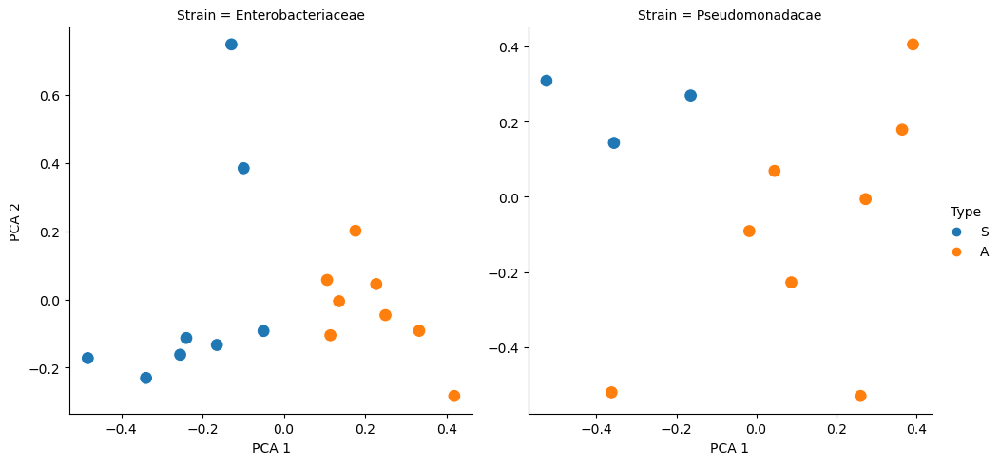

In [8]:
strains = dfm.Strain.unique()
df_list = []
for strain in strains:
    pca = PCA(n_components=2)
# X = pd.pivot_table(dfu.loc[sidx, :], index = 'Metabolite', columns = 'Carbon_Source', values = 'Z-score(log)', aggfunc='mean')
# dfu['ID'] = dfu['STRAIN
    sidx = dfm.Strain == strain
    X = dfm.loc[sidx,:].pivot(index = 'Carbon_Source', columns = 'Metabolite', values = 'Peak_Intensity')#Z-score(log)
    X_std =X.std(axis=0)
    X_std[X_std==0]=1
    Xi = (X-X.mean(axis = 0))/X_std
    Xi.fillna(0, inplace=True)
# Xi.fillna(Xi.min(axis=0), inplace=True)
# imputer = SimpleImputer()
# Xi = imputer.fit_transform(X)
    pca.fit(Xi.T)
    pca_df_s = pd.DataFrame(pca.components_, index = ['PCA 1', 'PCA 2']).T
    pca_df_s['Strain'] = strain
    pca_df_s['Carbon_Source'] = Xi.index
    pca_df_s['Type'] = pca_df_s['Carbon_Source'].map(cs_to_type_map)
    pca_df_s['OD'] = [id_strain_cs_od[strain, met] for met in X.index]
    df_list.append(pca_df_s)
pca_df = pd.concat(df_list)
sns.relplot(data = pca_df, x = 'PCA 1', y = 'PCA 2', hue = 'Type', col = 'Strain', palette='tab10', s = 100, facet_kws={'sharey': False, 'sharex': False})
plt.show()

# Note! Remember that the PCA components differ between the two strains!

/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


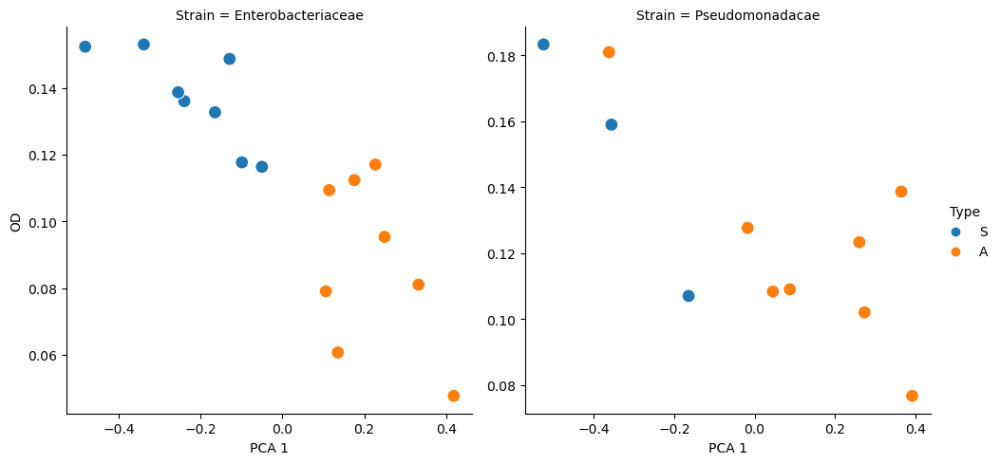

In [9]:
sns.relplot(data = pca_df, x = 'PCA 1', y = 'OD', hue = 'Type', col = 'Strain', palette='tab10', s = 100, facet_kws={'sharey': False, 'sharex': False})
plt.show()

## Normalizing by dividing by OD doesn't help

/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


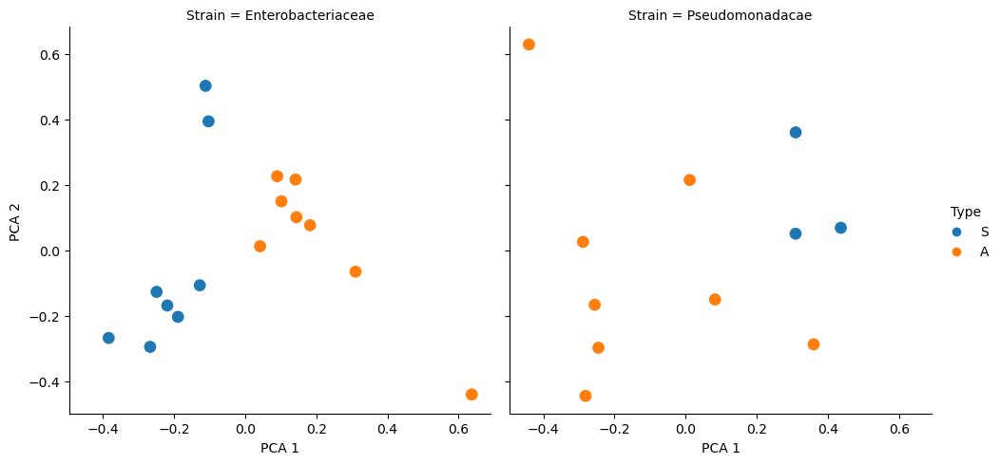

In [10]:
strains = dfm.Strain.unique()
df_list = []
for strain in strains:
    pca = PCA(n_components=2)
# X = pd.pivot_table(dfu.loc[sidx, :], index = 'Metabolite', columns = 'Carbon_Source', values = 'Z-score(log)', aggfunc='mean')
# dfu['ID'] = dfu['STRAIN
    sidx = dfm.Strain == strain
    X = dfm.loc[sidx,:].pivot(index = 'Carbon_Source', columns = 'Metabolite', values = 'Normalized peak')#Z-score(log)
    X_std =X.std(axis=0)
    X_std[X_std==0]=1
    Xi = (X-X.mean(axis = 0))/X_std
    Xi.fillna(0, inplace=True)
# Xi.fillna(Xi.min(axis=0), inplace=True)
# imputer = SimpleImputer()
# Xi = imputer.fit_transform(X)
    pca.fit(Xi.T)
    pca_df_s = pd.DataFrame(pca.components_, index = ['PCA 1', 'PCA 2']).T
    pca_df_s['Strain'] = strain
    pca_df_s['Carbon_Source'] = Xi.index
    pca_df_s['Type'] = pca_df_s['Carbon_Source'].map(cs_to_type_map)
    pca_df_s['OD'] = [id_strain_cs_od[strain, met] for met in X.index]
    df_list.append(pca_df_s)
pca_df = pd.concat(df_list)
sns.relplot(data = pca_df, x = 'PCA 1', y = 'PCA 2', hue = 'Type', col = 'Strain', palette='tab10', s = 100)
plt.show()

/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


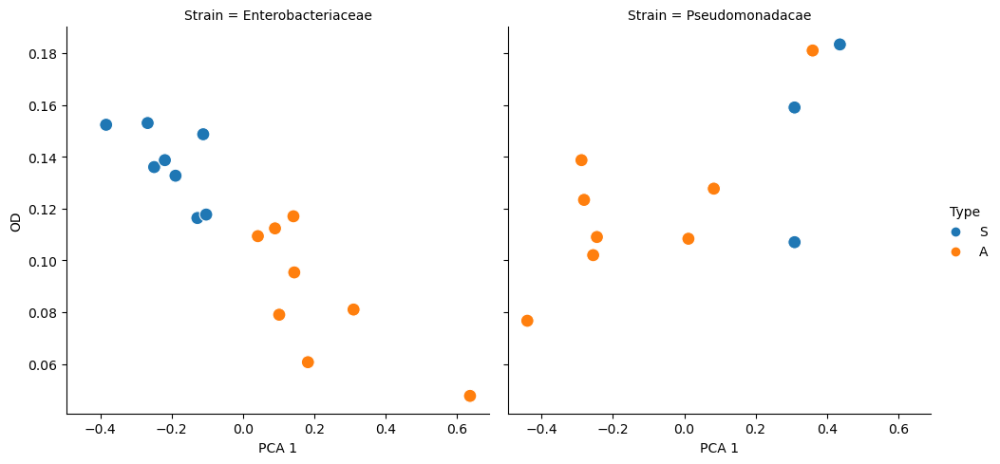

In [11]:
sns.relplot(data = pca_df, x = 'PCA 1', y = 'OD', hue = 'Type', col = 'Strain', palette='tab10', s = 100)
plt.show()

## Same for full dataset

In [12]:
metabolites = dfu.Metabolite.unique()
key = 'Peak_Intensity'
# key2 = 'Normalized peak 1'
# dfu[key2] = dfu[key]/(dfu['OD']**4)
for s in dfu.Strain.unique():
    sidx = dfu.Strain == s
    for m in metabolites:
        idx = (dfu.Metabolite == m)&sidx
        dfu.loc[idx, 'Z-score'] = (dfu.loc[idx, key]-dfu.loc[idx, key].mean())/dfu.loc[idx, key].std()
        logscaled = np.log10(dfu.loc[idx, key])
        logscaled.replace([np.inf, -np.inf], np.nan, inplace=True)
        dfu.loc[idx, 'logscaled (PI)'] = logscaled
        dfu.loc[idx, 'Z-score(log)'] = (logscaled-np.nanmean(logscaled))/np.nanstd(logscaled)


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/ssulheim/anaconda3/lib/python3.11/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [13]:
cid_dict = dfu[['SID', 'Strain', 'Carbon_Source', 'Type', 'OD']].drop_duplicates().set_index('SID').to_dict('index')
cid_dict_s = {key: value['Strain'] for key, value in cid_dict.items()}
cid_dict_c = {key: value['Carbon_Source'] for key, value in cid_dict.items()}
cid_dict_t = {key: value['Type'] for key, value in cid_dict.items()}
# cid_dict_od = {key: value['OD'] for key, value in cid_dict.items()}
cid_strain_cs_od = {(value['Strain'], value['Carbon_Source']): value['OD'] for key, value in id_dict.items()}

## PCA

/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


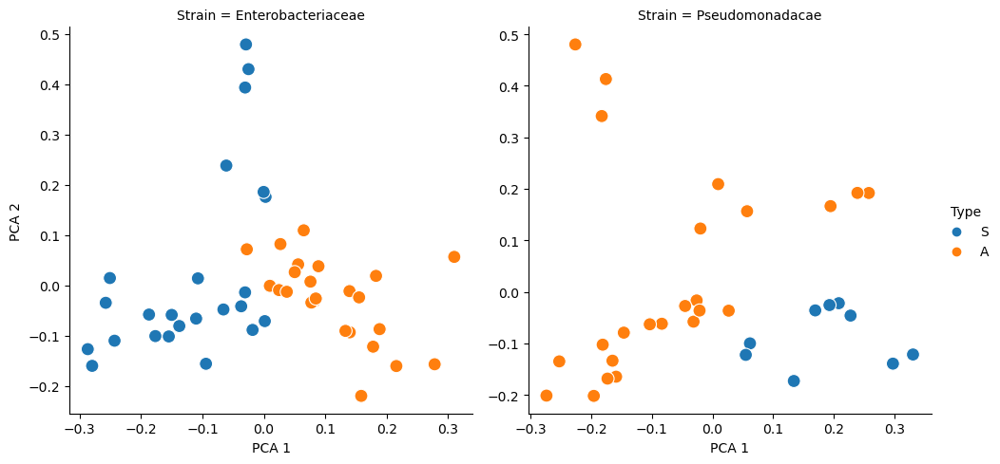

In [14]:
strains = dfu.Strain.unique()
df_list = []
for strain in strains:
    pca = PCA(n_components=2)
# X = pd.pivot_table(dfu.loc[sidx, :], index = 'Metabolite', columns = 'Carbon_Source', values = 'Z-score(log)', aggfunc='mean')
# dfu['ID'] = dfu['STRAIN
    sidx = dfu.Strain == strain
    X = dfu.loc[sidx,:].pivot(index = 'SID', columns = 'Metabolite', values = 'Peak_Intensity')#Z-score(log)
    X_std =X.std(axis=0)
    X_std[X_std==0]=1
    Xi = (X-X.mean(axis = 0))/X_std
    Xi.fillna(0, inplace=True)
# Xi.fillna(Xi.min(axis=0), inplace=True)
# imputer = SimpleImputer()
# Xi = imputer.fit_transform(X)
    pca.fit(Xi.T)
    pca_df_s = pd.DataFrame(pca.components_, index = ['PCA 1', 'PCA 2']).T
    pca_df_s['SID'] = Xi.index
    pca_df_s['Strain'] = pca_df_s['SID'].map(cid_dict_s)
    pca_df_s['Carbon_Source'] = pca_df_s['SID'].map(cid_dict_c)
    pca_df_s['Type'] = pca_df_s['SID'].map(cid_dict_t)
    pca_df_s['OD'] = [id_strain_cs_od[strain, met] for met in pca_df_s['Carbon_Source']]
    df_list.append(pca_df_s)
pca_df = pd.concat(df_list)
sns.relplot(data = pca_df, x = 'PCA 1', y = 'PCA 2', hue = 'Type', col = 'Strain', palette='tab10', s = 100, facet_kws={'sharey': False, 'sharex': False}, hue_order=['S','A'])
plt.show()


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


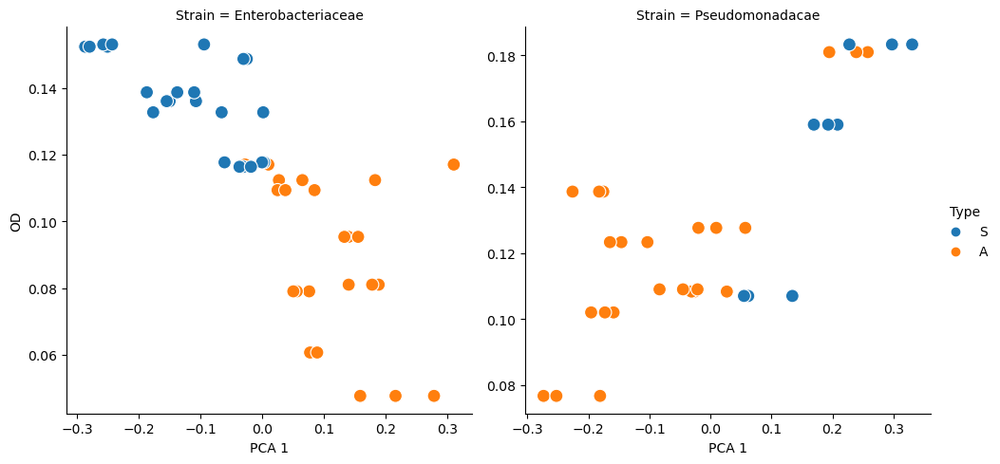

In [15]:
sns.relplot(data = pca_df, x = 'PCA 1', y = 'OD', hue = 'Type', col = 'Strain', palette='tab10', s = 100, facet_kws={'sharey': False, 'sharex': False}, hue_order=['S','A'])
plt.show()

In [16]:
od_t_s = dfm.loc[:, ['OD', 'Type', 'Strain']].drop_duplicates()


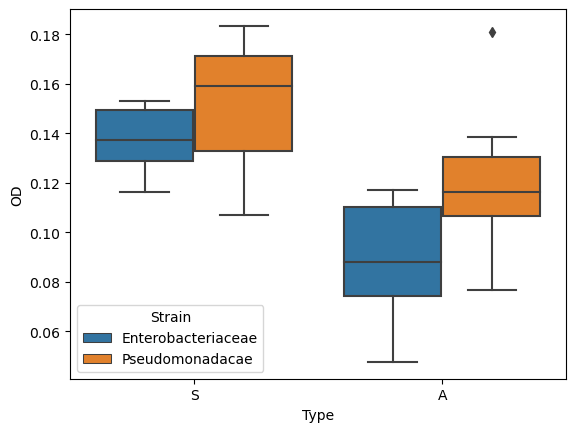

In [17]:
sns.boxplot(y = od_t_s['OD'], x =  od_t_s['Type'], hue = od_t_s['Strain'])
plt.show()

# How much is of the variability is predicted by OD?

### Permanova?? Manova??
https://www.statsmodels.org/stable/generated/statsmodels.multivariate.manova.MANOVA.html#statsmodels.multivariate.manova.MANOVA


In [18]:
result_list = []
for strain in dfu.Strain.unique():
    for m in dfu.Metabolite.unique():
        sidx = dfu.Strain == strain
        idx = (dfu.Metabolite == m)&sidx
        for key in ['OD', 'Type']:
            Xdata = sm.add_constant(dfu.loc[idx, key])
            Ydata = (dfu.loc[idx, ['logscaled (PI)']]-np.nanmean(dfu.loc[idx, ['logscaled (PI)']]))/np.nanstd(dfu.loc[idx, ['logscaled (PI)']])
            if key == 'OD':
                Xdata['OD'] = (Xdata['OD']-np.nanmean(Xdata['OD']))/np.nanstd(Xdata['OD'])
            else:
                Xdata = pd.get_dummies(Xdata, drop_first=True)
            nanidx = Ydata['logscaled (PI)'].isna()
            Xdata = Xdata.loc[~nanidx,:]
            Xdata = sm.add_constant(Xdata)
            Ydata = Ydata[~nanidx]
            if len(Ydata) > 10:
                # smodel = sm.GLM(Ydata, XdataD)
                smodel = sm.OLS(Ydata, Xdata)
                results = smodel.fit()
                if not np.isnan(results.rsquared_adj):
                    result_list.append([strain, m, key, results.rsquared, results.rsquared_adj, results.aic, results.f_pvalue])
reg_df = pd.DataFrame(result_list, columns = ['Strain', 'Metabolite', 'Variable', 'R squared', 'Adjusted R squared', 'AIC', 'P-value (F-statistic)'])
# cat_columns = ['Strain', 'Type', 'Carbon_Source']
# XdataD=Xdata
# Xdata[cat_columns] = XdataD[cat_columns].astype('category')


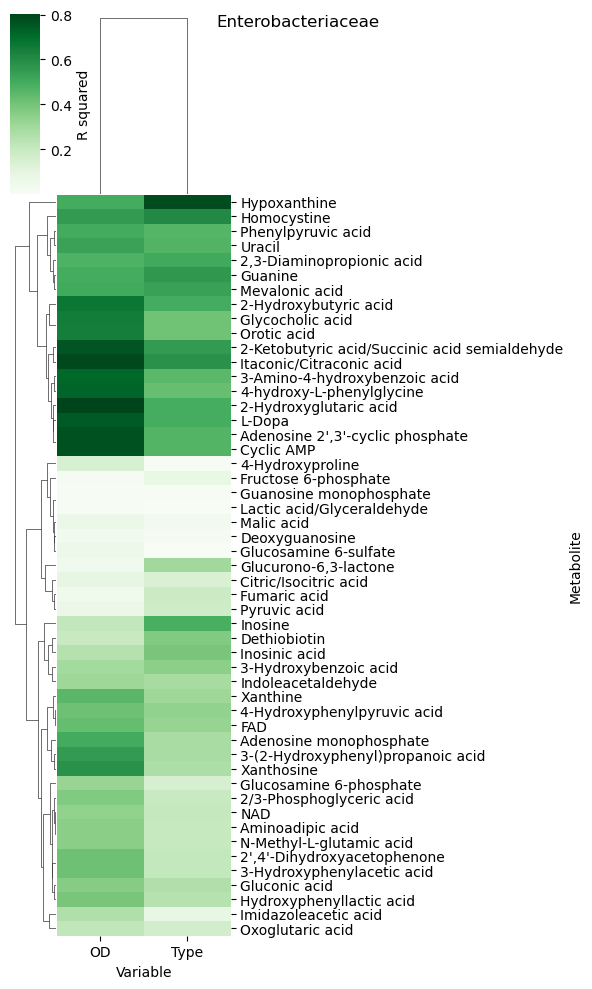

In [19]:
strain = 'Enterobacteriaceae'
sidx = reg_df.Strain == strain
reg_pivot = reg_df.loc[sidx,:].pivot(index = 'Metabolite', columns = ['Variable'], values = 'R squared')
g = sns.clustermap(reg_pivot, yticklabels=True, cmap = 'Greens', cbar_kws={'label': 'R squared'}, figsize = (6,10))
plt.savefig('explained_variance_entero.svg')

g.fig.suptitle(strain)
plt.show()

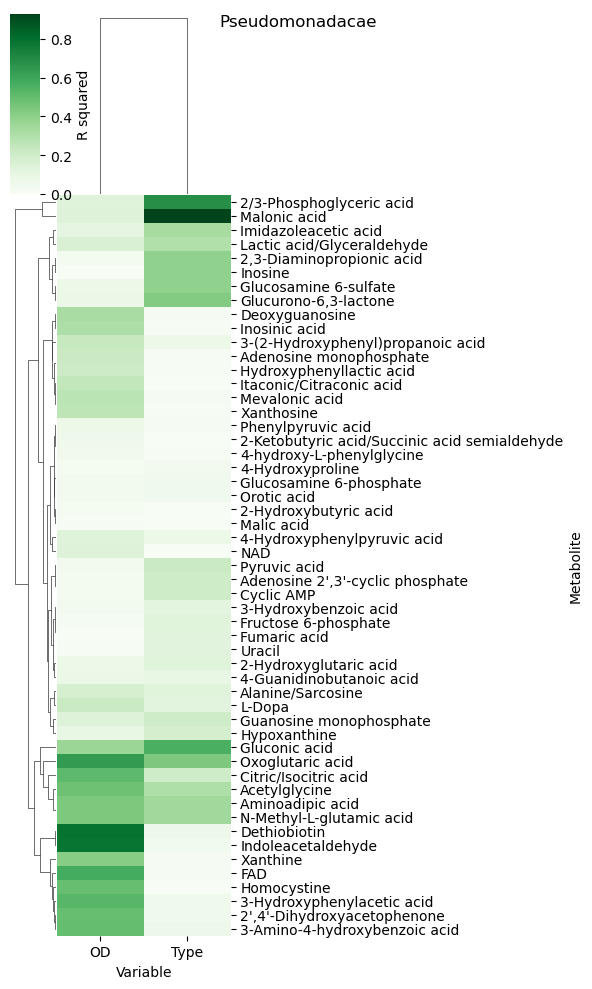

In [20]:
strain = 'Pseudomonadacae'
sidx = reg_df.Strain == strain
reg_pivot = reg_df.loc[sidx,:].pivot(index = 'Metabolite', columns = ['Variable'], values = 'R squared')
g = sns.clustermap(reg_pivot, yticklabels=True, cmap = 'Greens', cbar_kws={'label': 'R squared'}, figsize = (6,10))
g.fig.suptitle(strain)
plt.savefig('explained_variance_pseudomonas.svg')
plt.show()

/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


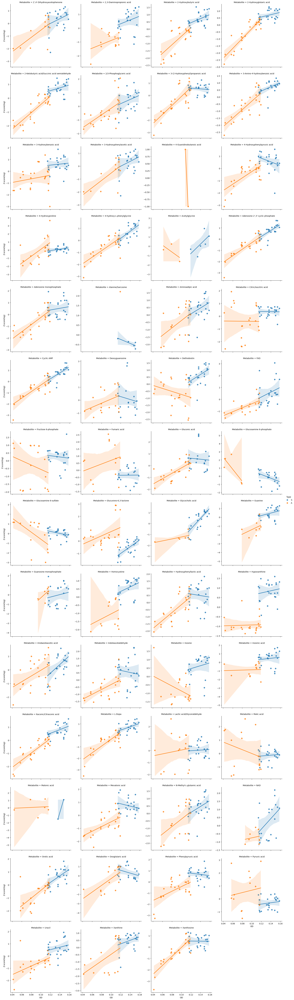

In [21]:
sidx = dfu.Strain == 'Enterobacteriaceae'
sns.lmplot(data = dfu.loc[sidx, :], x = 'OD', y = 'Z-score(log)', hue = 'Type', col = 'Metabolite', facet_kws={'sharey': False, 'sharex': True}, col_wrap=4)
plt.savefig('correlation logscaled peak vs od.svg')
plt.show()

/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


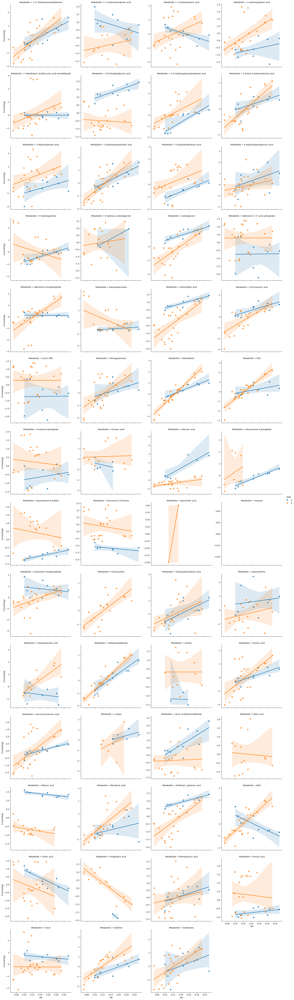

In [22]:
sidx = dfu.Strain == 'Pseudomonadacae'
sns.lmplot(data = dfu.loc[sidx, :], x = 'OD', y = 'Z-score(log)', hue = 'Type', col = 'Metabolite', facet_kws={'sharey': False, 'sharex': True}, col_wrap=4)
plt.savefig('correlation logscaled peak vs od.svg')
plt.show()

# Remove growth effect

In [23]:
metabolites = dfu.Metabolite.unique()
key = 'logscaled (PI)'
name = 'Corrected logscaled'
for s in dfu.Strain.unique():
    sidx = dfu.Strain == s
    i = 0
    for m in metabolites:
        # Normalize both plates together?
        idx = (dfu.Metabolite == m)&sidx
        # dfu.loc[idx, 'Max-scaled'] = dfu.loc[idx, key]/np.max(dfu.loc[idx, key])
        # logscaled = np.log10(dfu.loc[idx, key])
        # logscaled.replace([np.inf, -np.inf], np.nan, inplace=True)
        # z_scores = (logscaled-np.nanmean(logscaled))/np.nanstd(logscaled)
        # z_scores = dfu.loc[idx, 'Z-score(log)']
        arr = dfu.loc[idx, key]
        x_arr = []
        y_arr = []

        for xi, yi in zip(dfu.loc[idx, 'OD'], arr):
            if np.isfinite(xi) and np.isfinite(yi):
                x_arr.append(xi)
                y_arr.append(yi)

        correction = np.zeros(len(dfu.loc[idx, 'OD']))
        if len(y_arr) > 8:
                    # slope, intercept, r_value, p_value, std_err = sp.stats.linregress(x_arr, y_arr)
            rlm = sm.RLM(y_arr, sm.add_constant(x_arr), M=sm.robust.norms.HuberT())
            rlm_results = rlm.fit()
            p_value = rlm_results
            # print(s, m, slope, intercept, r_value**2, p_value)
            if rlm_results.pvalues[1] < 1e-2:
                i+= 1
                intercept, slope = rlm_results.params
                print(f'{i}: Corrected {s}, {m}. Slope: {slope:.2f}')
                # print(s, m, slope, rlm_results.params[1])

                correction = intercept + dfu.loc[idx, 'OD']*slope
            else:
                correction = np.nanmean(y_arr)
        dfu.loc[idx, name] = arr - correction
        

1: Corrected Enterobacteriaceae, 2',4'-Dihydroxyacetophenone. Slope: 14.63
2: Corrected Enterobacteriaceae, 2,3-Diaminopropionic acid. Slope: 14.03
3: Corrected Enterobacteriaceae, 2-Hydroxybutyric acid. Slope: 18.96
4: Corrected Enterobacteriaceae, 2-Hydroxyglutaric acid. Slope: 20.71
5: Corrected Enterobacteriaceae, 2-Ketobutyric acid/Succinic acid semialdehyde. Slope: 20.28
6: Corrected Enterobacteriaceae, 2/3-Phosphoglyceric acid. Slope: 5.77
7: Corrected Enterobacteriaceae, 3-(2-Hydroxyphenyl)propanoic acid. Slope: 9.88
8: Corrected Enterobacteriaceae, 3-Amino-4-hydroxybenzoic acid. Slope: 12.48
9: Corrected Enterobacteriaceae, 3-Hydroxybenzoic acid. Slope: 7.35
10: Corrected Enterobacteriaceae, 3-Hydroxyphenylacetic acid. Slope: 14.63
11: Corrected Enterobacteriaceae, 4-Hydroxyphenylpyruvic acid. Slope: 7.39
12: Corrected Enterobacteriaceae, 4-Hydroxyproline. Slope: 8.35
13: Corrected Enterobacteriaceae, 4-hydroxy-L-phenylglycine. Slope: 13.00
14: Corrected Enterobacteriaceae, Ad

/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


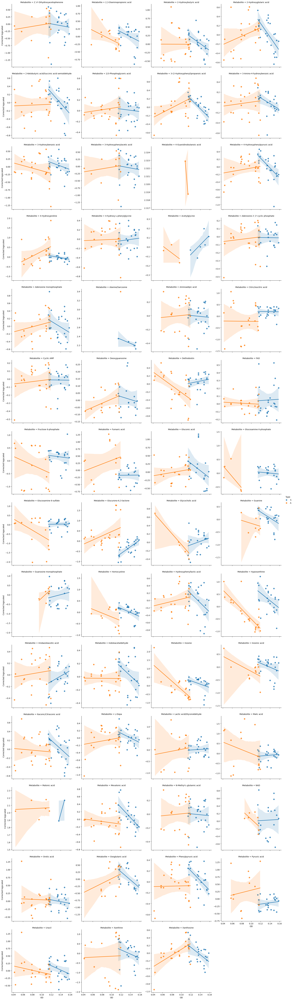

In [50]:
sidx = dfu.Strain == 'Enterobacteriaceae'
sns.lmplot(data = dfu.loc[sidx, :], x = 'OD', y = 'Corrected logscaled', hue = 'Type', col = 'Metabolite', facet_kws={'sharey': False, 'sharex': True}, col_wrap=4)
plt.savefig('correlation logscaled peak vs od.svg')
plt.show()

# Now do PCA

In [24]:
# Xi.isna()

/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


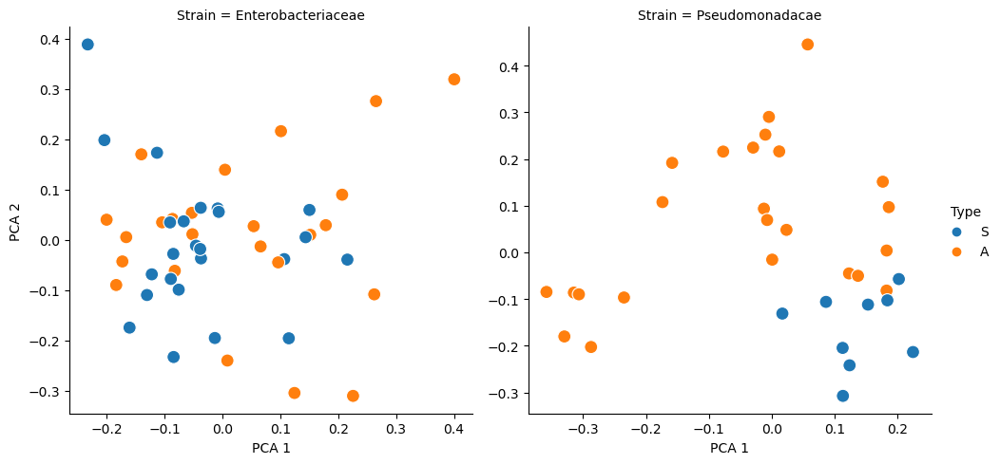

In [25]:
strains = dfu.Strain.unique()
df_list = []
for strain in strains:
    pca = PCA(n_components=2)
# X = pd.pivot_table(dfu.loc[sidx, :], index = 'Metabolite', columns = 'Carbon_Source', values = 'Z-score(log)', aggfunc='mean')
# dfu['ID'] = dfu['STRAIN
    sidx = dfu.Strain == strain
    X = dfu.loc[sidx,:].pivot(index = 'SID', columns = 'Metabolite', values = name)#Z-score(log)
    X_std =X.std(axis=0)
    # X_std[X_std==0]=1
    Xi = (X-X.mean(axis = 0))/X_std
    Xi = Xi.loc[:, Xi.isna().sum(axis=0)<1]
    # Xi = Xi.loc[X.isna().sum(axis=1)<5,:]
    Xi.fillna(0, inplace=True)
# Xi.fillna(Xi.min(axis=0), inplace=True)
# imputer = SimpleImputer()
# Xi = imputer.fit_transform(X)
    pca.fit(Xi.T)
    pca_df_s = pd.DataFrame(pca.components_, index = ['PCA 1', 'PCA 2']).T
    pca_df_s['SID'] = Xi.index
    pca_df_s['Strain'] = pca_df_s['SID'].map(cid_dict_s)
    pca_df_s['Carbon_Source'] = pca_df_s['SID'].map(cid_dict_c)
    pca_df_s['Type'] = pca_df_s['SID'].map(cid_dict_t)
    pca_df_s['OD'] = [id_strain_cs_od[strain, met] for met in pca_df_s['Carbon_Source']]
    df_list.append(pca_df_s)
pca_df = pd.concat(df_list)
sns.relplot(data = pca_df, x = 'PCA 1', y = 'PCA 2', hue = 'Type', col = 'Strain', palette='tab10', s = 100, facet_kws={'sharey': False, 'sharex': False}, hue_order=['S','A'])
plt.show()


# Note! Dependent on how missing values are treated

/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


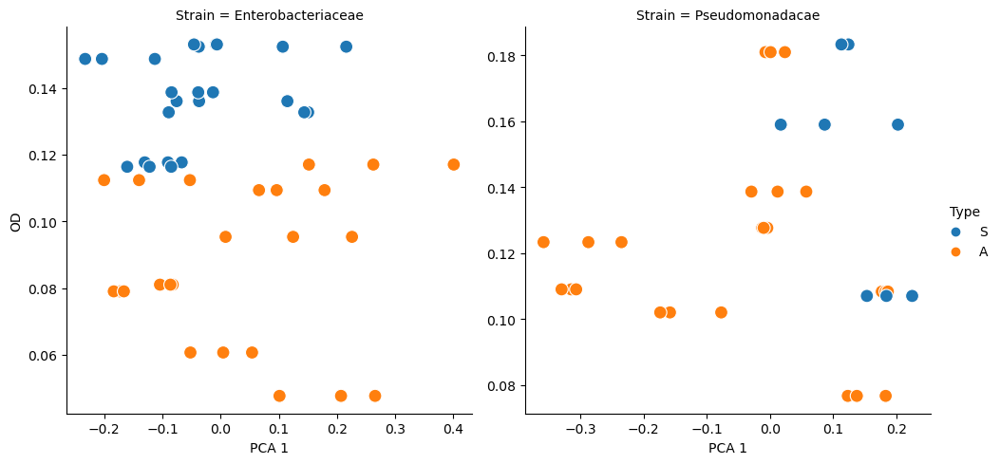

In [26]:
sns.relplot(data = pca_df, x = 'PCA 1', y = 'OD', hue = 'Type', col = 'Strain', palette='tab10', s = 100, facet_kws={'sharey': False, 'sharex': False}, hue_order=['S','A'])
plt.show()

/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


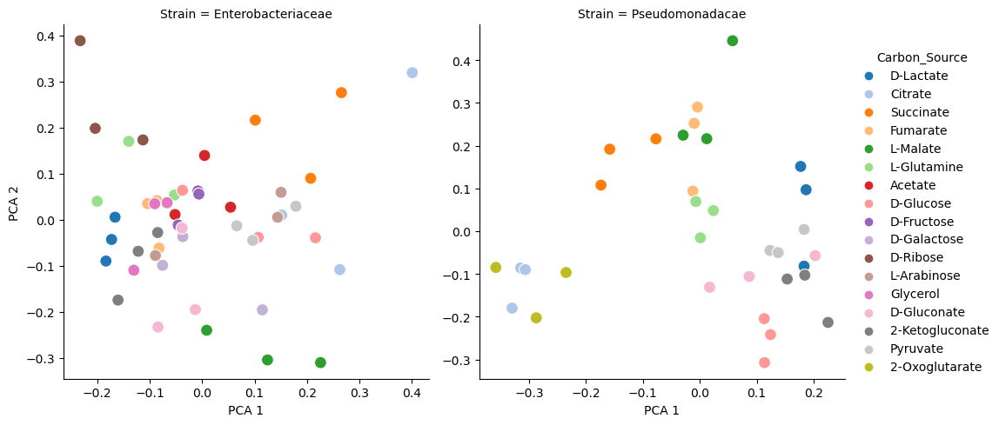

In [27]:

sns.relplot(data = pca_df, x = 'PCA 1', y = 'PCA 2', hue = 'Carbon_Source', col = 'Strain', palette='tab20', s = 100, facet_kws={'sharey': False, 'sharex': False})
plt.show()
plt.savefig('PCA_corrected_cs.svg')

# Heatmaps

In [28]:
dfu.columns


Index(['SID', 'Metabolite', 'Peak_Intensity', 'Strain', 'SangerID',
       'Carbon_Source', 'Well', 'Plate', 'OD', 'Replicate', 'Type',
       'Normalized peak', 'logscaled (Np)', 'logscaled (PI)', 'Z-score',
       'Z-score(log)', 'Corrected logscaled'],
      dtype='object')

<Figure size 640x480 with 0 Axes>

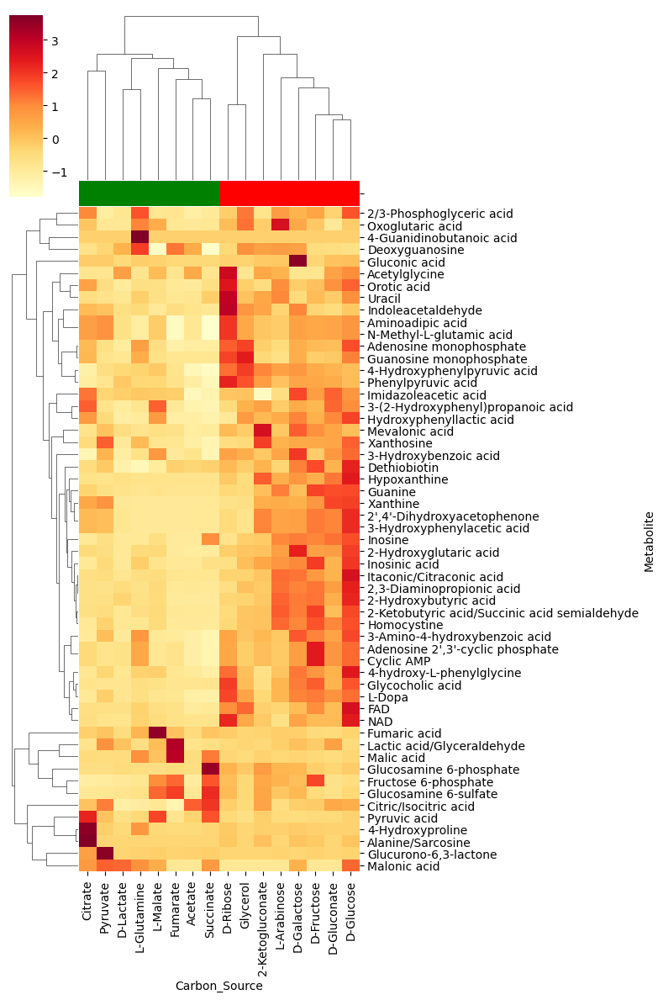

In [29]:
sidx = dfu.Strain == 'Enterobacteriaceae'
df_pivot = pd.pivot_table(dfu.loc[sidx, :], index = 'Metabolite', columns = 'Carbon_Source', values = 'Peak_Intensity', aggfunc='mean', fill_value=np.nan)
# dfm_pivotZ = (dfm_pivot.T - np.nanmean(dfm_pivot, axis = 1))/np.nanstd(dfm_pivot, axis # = 1)
df_pivotZ = ((df_pivot.T - df_pivot.mean(axis=1))/df_pivot.std(axis=1)).T
# dfm_pivotZ = dfm_pivotZ.loc[:,dfm_pivotZ.isna().sum(axis=0)<10].T
# mask = dfu_pivotZ.isna()

# dfu_pivotZ.T.fillna(dfu_pivotZ.min(axis = 1), inplace = True)
df_pivotZ.fillna(0, inplace = True)# 0 is mean since these are standardized

sns.clustermap(df_pivotZ, figsize=(8, 12), yticklabels = True, col_colors=pd.Series(cs_to_color_map), cmap = 'YlOrRd', metric="correlation")
plt.show()

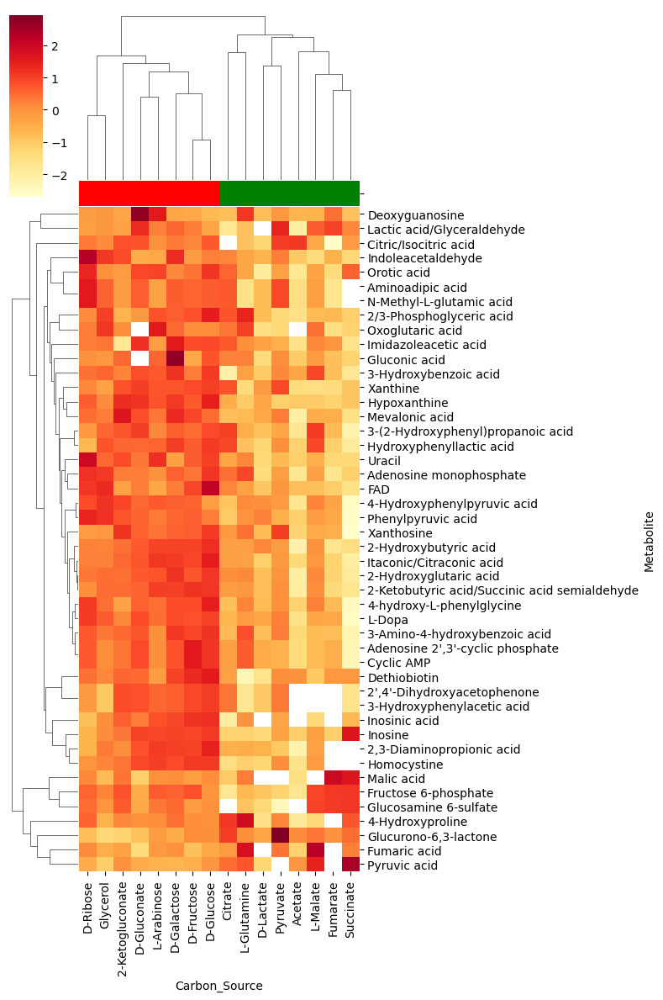

In [48]:
sidx = dfu.Strain == 'Enterobacteriaceae'
df_pivot = pd.pivot_table(dfu.loc[sidx, :], index = 'Metabolite', columns = 'Carbon_Source', values = 'logscaled (PI)', aggfunc='mean', fill_value=np.nan)
# dfm_pivotZ = (dfm_pivot.T - np.nanmean(dfm_pivot, axis = 1))/np.nanstd(dfm_pivot, axis # = 1)
df_pivot = df_pivot.loc[df_pivot.isna().sum(axis=1)<4,:]

df_pivotZ = ((df_pivot.T - df_pivot.mean(axis=1))/df_pivot.std(axis=1)).T
# dfm_pivotZ = dfm_pivotZ.loc[:,dfm_pivotZ.isna().sum(axis=0)<10].T
mask = df_pivotZ.isna()

# dfu_pivotZ.T.fillna(dfu_pivotZ.min(axis = 1), inplace = True)
df_pivotZ.fillna(0, inplace = True)# 0 is mean since these are standardized

sns.clustermap(df_pivotZ, figsize=(8, 12), yticklabels = True, col_colors=pd.Series(cs_to_color_map), cmap = 'YlOrRd', metric="correlation", mask = mask)
plt.show()

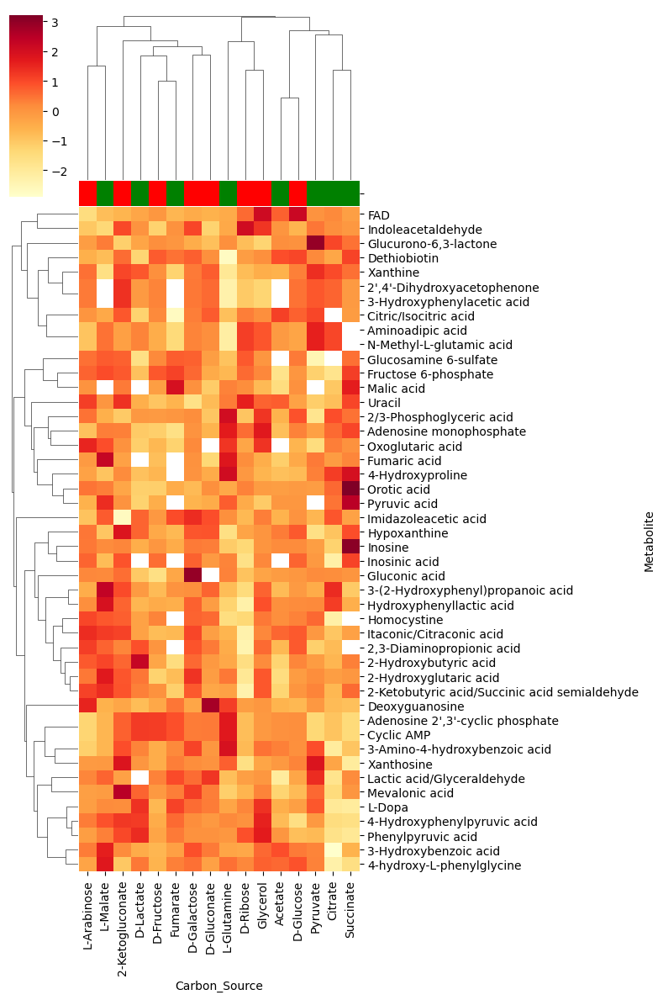

In [49]:
sidx = dfu.Strain == 'Enterobacteriaceae'
df_pivot = pd.pivot_table(dfu.loc[sidx, :], index = 'Metabolite', columns = 'Carbon_Source', values = 'Corrected logscaled', aggfunc='mean', fill_value=np.nan)
# dfm_pivotZ = (dfm_pivot.T - np.nanmean(dfm_pivot, axis = 1))/np.nanstd(dfm_pivot, axis # = 1)
df_pivot = df_pivot.loc[df_pivot.isna().sum(axis=1)<4,:]

df_pivotZ = ((df_pivot.T - df_pivot.mean(axis=1))/df_pivot.std(axis=1)).T
# dfm_pivotZ = dfm_pivotZ.loc[:,dfm_pivotZ.isna().sum(axis=0)<10].T
mask = df_pivotZ.isna()

# dfu_pivotZ.T.fillna(dfu_pivotZ.min(axis = 1), inplace = True)
df_pivotZ.fillna(0, inplace = True)# 0 is mean since these are standardized

sns.clustermap(df_pivotZ, figsize=(8, 12), yticklabels = True, col_colors=pd.Series(cs_to_color_map), cmap = 'YlOrRd', metric="correlation", mask = mask)
plt.show()

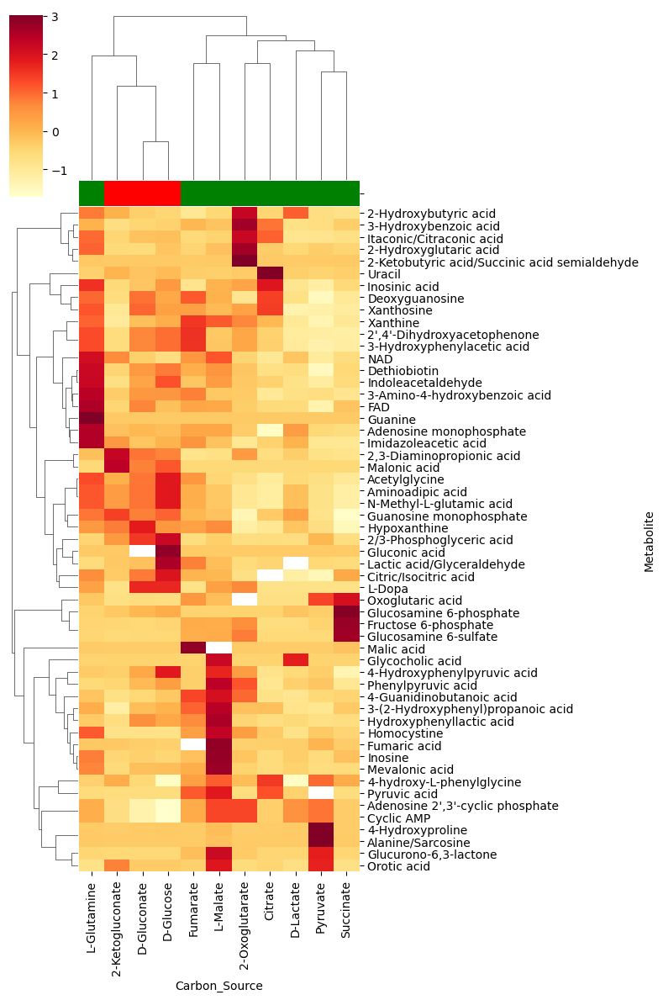

In [45]:
sidx = dfu.Strain == 'Pseudomonadacae'
df_pivot = pd.pivot_table(dfu.loc[sidx, :], index = 'Metabolite', columns = 'Carbon_Source', values = 'Peak_Intensity', aggfunc='mean', fill_value=np.nan)
# dfm_pivotZ = (dfm_pivot.T - np.nanmean(dfm_pivot, axis = 1))/np.nanstd(dfm_pivot, axis # = 1)
df_pivotZ = ((df_pivot.T - df_pivot.mean(axis=1))/df_pivot.std(axis=1)).T
# dfm_pivotZ = dfm_pivotZ.loc[:,dfm_pivotZ.isna().sum(axis=0)<10].T
mask = df_pivotZ.isna()

# dfu_pivotZ.T.fillna(dfu_pivotZ.min(axis = 1), inplace = True)
df_pivotZ.fillna(0, inplace = True)# 0 is mean since these are standardized

sns.clustermap(df_pivotZ, figsize=(8, 12), yticklabels = True, col_colors=pd.Series(cs_to_color_map), cmap = 'YlOrRd', metric="correlation", mask = mask)
plt.show()

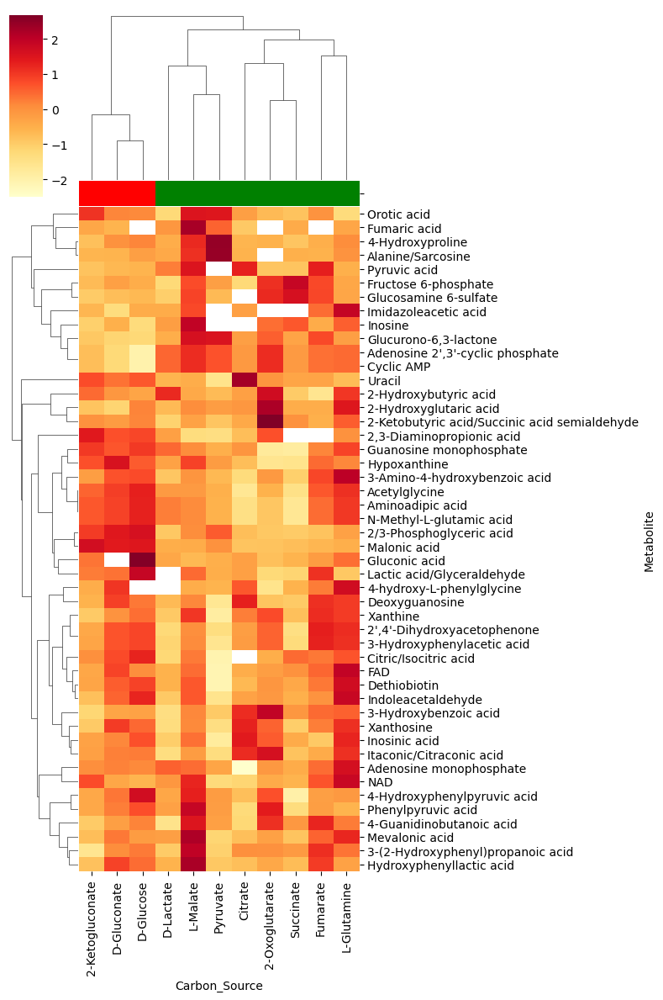

In [44]:
sidx = dfu.Strain == 'Pseudomonadacae'
df_pivot = pd.pivot_table(dfu.loc[sidx, :], index = 'Metabolite', columns = 'Carbon_Source', values = 'logscaled (PI)', aggfunc='mean', fill_value=np.nan)
# dfm_pivotZ = (dfm_pivot.T - np.nanmean(dfm_pivot, axis = 1))/np.nanstd(dfm_pivot, axis # = 1)
df_pivot = df_pivot.loc[df_pivot.isna().sum(axis=1)<4,:]

df_pivotZ = ((df_pivot.T - df_pivot.mean(axis=1))/df_pivot.std(axis=1)).T
# dfm_pivotZ = dfm_pivotZ.loc[:,dfm_pivotZ.isna().sum(axis=0)<10].T
mask = df_pivotZ.isna()

# dfu_pivotZ.T.fillna(dfu_pivotZ.min(axis = 1), inplace = True)
df_pivotZ.fillna(0, inplace = True)# 0 is mean since these are standardized

sns.clustermap(df_pivotZ, figsize=(8, 12), yticklabels = True, col_colors=pd.Series(cs_to_color_map), cmap = 'YlOrRd', metric="correlation", mask = mask)
plt.show()

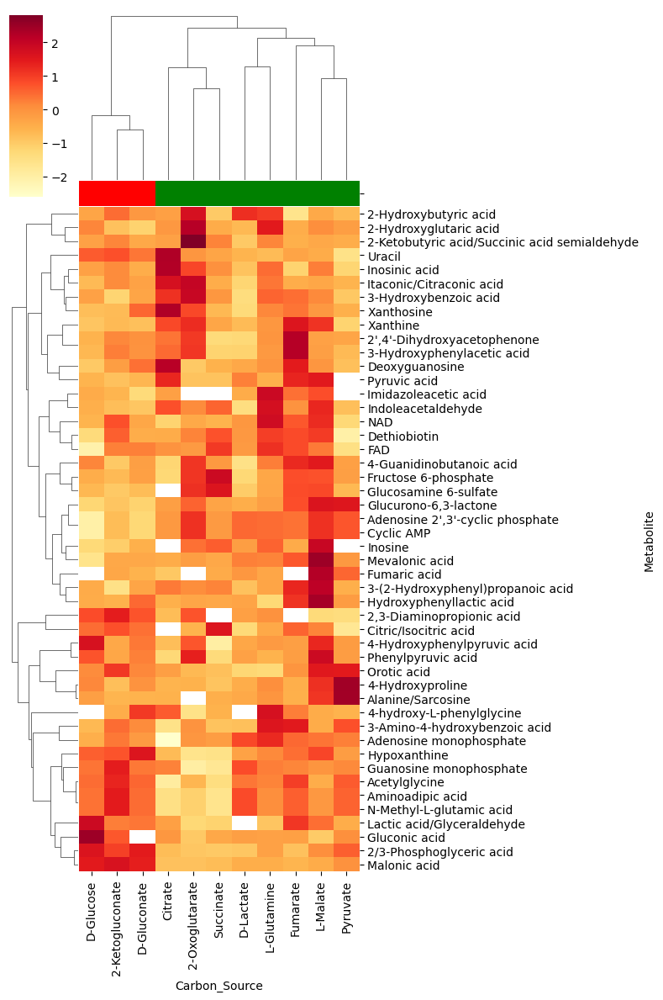

In [43]:
sidx = dfu.Strain == 'Pseudomonadacae'
df_pivot = pd.pivot_table(dfu.loc[sidx, :], index = 'Metabolite', columns = 'Carbon_Source', values = 'Corrected logscaled', aggfunc='mean', fill_value=np.nan)
# dfm_pivotZ = (dfm_pivot.T - np.nanmean(dfm_pivot, axis = 1))/np.nanstd(dfm_pivot, axis # = 1)
df_pivot = df_pivot.loc[df_pivot.isna().sum(axis=1)<4,:]

df_pivotZ = ((df_pivot.T - df_pivot.mean(axis=1))/df_pivot.std(axis=1)).T
# dfm_pivotZ = dfm_pivotZ.loc[:,dfm_pivotZ.isna().sum(axis=0)<10].T
mask = df_pivotZ.isna()

# dfu_pivotZ.T.fillna(dfu_pivotZ.min(axis = 1), inplace = True)
df_pivotZ.fillna(0, inplace = True)# 0 is mean since these are standardized

sns.clustermap(df_pivotZ, figsize=(8, 12), yticklabels = True, col_colors=pd.Series(cs_to_color_map), cmap = 'YlOrRd', metric="correlation", mask = mask)
plt.show()

# Partial regression of linear model with both OD and Type

In [ ]:
result_list = []
keys = ['OD', 'Type', 'SID', 'logscaled (PI)']

for strain in dfu.Strain.unique():
    for m in dfu.Metabolite.unique():
        sidx = dfu.Strain == strain
        idx = (dfu.Metabolite == m)&sidx
        data = dfu.loc[idx, keys].set_index('SID')
        # Xdata = data[keys[:2]]# Either add constant or only have one dummy sm.add_constant()
        # Xdata = pd.get_dummies(data['Type'])
        Xdata = sm.add_constant((data['Type'] == 'S').astype(int))
        Ydata = (data[['logscaled (PI)']]-np.nanmean(data[['logscaled (PI)']]))/np.nanstd(data[['logscaled (PI)']])
        Xdata['OD'] = (data['OD']-np.nanmean(data['OD']))/np.nanstd(data['OD'])
        nanidx = Ydata['logscaled (PI)'].isna()
        Xdata = Xdata.loc[~nanidx,:]
        Ydata = Ydata[~nanidx]
        if len(Ydata) > 10:
            # smodel = sm.GLM(Ydata, XdataD)
            smodel = sm.OLS(Ydata, Xdata)
            # smodel = sm.RLM(Ydata, Xdata)
            results = smodel.fit()
            alldata = Xdata.copy()
            alldata['Y'] = Ydata.copy()
            if not np.isnan(results.rsquared_adj):
                result_list.append([strain, m, results.rsquared, results.rsquared_adj, results.aic, results.f_pvalue, *results.pvalues])
            # fig = sm.graphics.plot_partregress_grid(results)
            # fig.tight_layout(pad=1.0)
            # fig = sm.graphics.plot_ccpr(results, "Type")
            fig = sm.graphics.plot_regress_exog(results, "Type")
            # fig.tight_layout(pad=1.0)
            fig.suptitle(f'{strain}: {m}')
reg_df = pd.DataFrame(result_list, columns = ['Strain', 'Metabolite', 'R squared', 'Adjusted R squared', 'AIC', 'P-value (F-statistic)', 'pvalue intercept', 'pvalue Type', 'pvalue OD'])
plt.show()

In [322]:
reg_df['Sig. Type'] = (reg_df['pvalue Type'] < 0.01).astype(int)

In [323]:
reg_df[['Sig. Type', 'Strain']].groupby(['Strain']).sum()

,Sig. Type
Strain,
Enterobacteriaceae,9
Pseudomonadacae,14


In [325]:
(reg_df['pvalue OD'] < 0.01).sum()

52

# Fit data to equation

$X(t) = X_0e^{\mu t}$

$\frac{d\sigma_i}{dt} = a_i(\textbf{v})X(t) = a_i(\textbf{v})X_0e^{\mu t}$, $a$ [mmol/gDW/h] -> $\sigma$ [mmol]

$\sigma_i(t) = \int_0^t a_i(\textbf{v})X_0e^{\mu t} dt = a_i(\textbf{v})X_0 \int_0^t e^{\mu t} = a_i(\textbf{v})X_0 (\frac{e^{\mu t}-1}{\mu})$

$ln(\sigma_i(t)) = ln(a_i(\textbf{v})) + ln(X_0) + ln(\frac{e^{\mu t}-1}{\mu})$

$\mu = \frac{ln(X)-ln(X_0)}{\Delta t} $


t = 24 h
But X0 is not nown....

$\sigma_i(t)=a_i(\textbf{v})X_0 (\frac{e^{\mu t}-1}{\mu}) = a_i(\textbf{v})(\frac{X(t)-X0}{\mu}) = bX(t) + bX_0, \rightarrow b=\frac{a_i}{\mu}$

Thus, concentrations increases linearly with growth


# Fit data to equation

$X(t) = X_0e^{\mu t}$

$\frac{d\sigma_i}{dt} = a_iX(t) = a_iX_0e^{\mu t}$, $a$ [mmol/gDW/h] -> $\sigma$ [mmol]

$\sigma_i(t) = \sigma_i(0) + \int_0^t a_iX_0e^{\mu t} dt = \sigma_i(0) + a_iX_0 \int_0^t e^{\mu t} = \sigma_i(0) + a_iX_0 (\frac{e^{\mu t}-1}{\mu})$

$\sigma_i(t)-\sigma_i(0)=a_iX_0 (\frac{e^{\mu t}-1}{\mu}) = a_i(\frac{X(t)-X_0}{\mu}) = bX(t) - bX_0, \rightarrow b=\frac{a_i}{\mu}$

$a_i = \mu \frac{\sigma_i-\sigma_i(0)}{X(t)-X_0}$
Thus, concentrations increases linearly with growth


# Logistic regression

In [31]:
for strain in strains:
    pca = PCA(n_components=2)
# X = pd.pivot_table(dfu.loc[sidx, :], index = 'Metabolite', columns = 'Carbon_Source', values = 'Z-score(log)', aggfunc='mean')
# dfu['ID'] = dfu['STRAIN
    sidx = dfu.Strain == strain
    X = dfu.loc[sidx,:].pivot(index = 'Carbon_Source', columns = 'Metabolite', values = 'Peak')#Z-score(log)
    X['OD'] = [cid_strain_cs_od[strain, met] for met in X.index]
    Xi = (X-X.mean(axis = 0))/X.std(axis=0)
    Xi.fillna(0, inplace=True)
    y = 
    clf = LogisticRegression(random_state=0).fit(X, y)

Metabolite,"2',4'-Dihydroxyacetophenone","2,3-Diaminopropionic acid",2-Hydroxybutyric acid,2-Hydroxyglutaric acid,2-Ketobutyric acid/Succinic acid semialdehyde,2/3-Phosphoglyceric acid,3-(2-Hydroxyphenyl)propanoic acid,3-Amino-4-hydroxybenzoic acid,3-Hydroxybenzoic acid,3-Hydroxyphenylacetic acid,...,Mevalonic acid,N-Methyl-L-glutamic acid,NAD,Orotic acid,Oxoglutaric acid,Phenylpyruvic acid,Pyruvic acid,Uracil,Xanthine,Xanthosine
Carbon_Source,,,,,,,,,,,,,,,,,,,,,
2-Ketogluconate,-0.208128,0.0,0.639145,-0.709623,0.082357,1.129999,-1.469068,0.174440,-1.049171,-0.154132,...,-0.705148,0.964798,1.309770,0.927183,0.000000,-0.106215,-0.709874,0.893852,-0.959290,-0.793432
2-Oxoglutarate,0.760866,0.0,1.737759,2.302223,2.766904,-0.959040,0.033280,-0.169807,2.041337,0.766216,...,-0.313763,-1.061803,-0.446745,-0.935749,0.000000,1.471248,-0.815047,-0.044705,1.029677,0.774419
Citrate,0.003978,0.0,-0.092121,0.058100,-0.347321,-0.689556,0.391947,-1.572568,1.340192,0.047325,...,-0.741706,-1.544498,-0.890853,-0.376039,0.000000,-1.071909,1.364678,2.421286,0.552833,2.319843
D-Gluconate,0.425692,0.0,-0.388806,-1.462658,-0.311355,1.320533,-0.564648,0.308385,-0.614127,0.447868,...,0.032639,0.742776,-1.145349,-0.278935,0.000000,-0.213577,-0.747101,0.169705,-0.443138,0.479768
D-Glucose,0.355367,0.0,-0.798651,-0.269440,-0.057436,1.383928,-0.717100,-0.060696,-0.724534,0.381073,...,-0.700063,1.038549,-1.838619,-0.437947,0.000000,0.020612,-0.762223,0.350430,-0.151107,-0.735351
D-Lactate,-1.428893,0.0,1.378691,-0.558877,-1.052217,-0.847904,-0.767103,-0.933899,-1.271805,-1.313611,...,-0.083881,0.457870,0.339085,-1.366447,0.000000,-0.000499,0.331177,-0.512583,-0.972191,-1.391770
Fumarate,1.832504,0.0,-1.638934,-0.521119,-0.570017,-0.898300,1.270030,1.203953,0.427836,1.784055,...,0.589144,0.462127,0.695018,-0.294166,-0.175433,-0.273084,1.300632,-0.332260,1.432476,0.255994
L-Glutamine,0.780925,0.0,0.568912,1.092927,0.384383,-0.587161,-0.623304,1.893582,0.139473,0.785267,...,0.952580,0.716326,0.928856,0.000000,-1.345987,-1.363774,-0.697515,-1.044666,0.580782,0.197434
L-Malate,-0.152396,0.0,-0.550339,-0.050361,-0.365641,-0.016741,2.031047,-0.428672,0.012687,-0.101198,...,2.450526,-0.013099,1.064523,1.174423,0.000000,1.768174,1.433499,-0.555572,1.145311,-0.227613


In [201]:
pca = PCA(n_components=2)
# X = pd.pivot_table(dfu.loc[sidx, :], index = 'Metabolite', columns = 'Carbon_Source', values = 'Z-score(log)', aggfunc='mean')
# dfu['ID'] = dfu['STRAIN
X = dfm.pivot(index = 'Metabolite', columns = ['SID'], values = 'Corrected Z-score(log)')#Z-score(log)
X = X.loc[X.isna().sum(axis=1)<5,:]
imputer = SimpleImputer()
Xi = imputer.fit_transform(X)
pca.fit(Xi)
# X = X.T.fillna(X.min(axis = 1)/10).T


KeyError: 'SID'

In [ ]:
X

In [ ]:
pca_df = pd.DataFrame(pca.components_, index = ['PCA 1', 'PCA 2']).T
pca_df['CID'] = X.columns
pca_df['Strain'] = pca_df['CID'].map(cid_dict_s)
pca_df['Carbon_Source'] = pca_df['CID'].map(cid_dict_c)
pca_df['Type'] = pca_df['CID'].map(cid_dict_t)
sns.relplot(data = pca_df, x = 'PCA 1', y = 'PCA 2', hue = 'Carbon_Source', col = 'Strain', palette='tab20', s = 100)


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


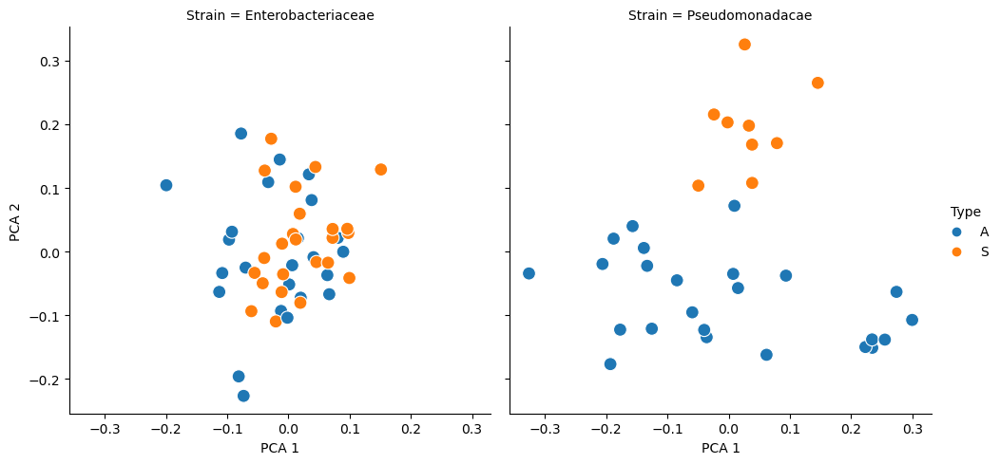

In [74]:
sns.relplot(data = pca_df, x = 'PCA 1', y = 'PCA 2', hue = 'Type', col = 'Strain', palette='tab10', s = 100)


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


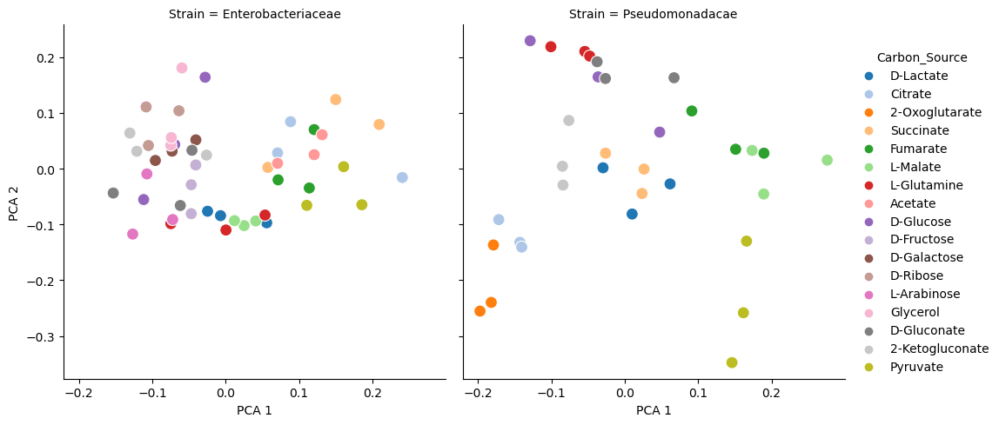

In [75]:
pca = PCA(n_components=2)
# X = pd.pivot_table(dfu.loc[sidx, :], index = 'Metabolite', columns = 'Carbon_Source', values = 'Z-score(log)', aggfunc='mean')
# dfu['ID'] = dfu['STRAIN
X = dfu.pivot(index = 'Metabolite', columns = ['SID'], values = 'Z-score(log)')
X = X.loc[X.isna().sum(axis=1)<5,:]

imputer = SimpleImputer()
Xi = imputer.fit_transform(X)
pca.fit(Xi)
# X = X.T.fillna(X.min(axis = 1)/10).T
pca_df = pd.DataFrame(pca.components_, index = ['PCA 1', 'PCA 2']).T
pca_df['CID'] = X.columns
pca_df['Strain'] = pca_df['CID'].map(cid_dict_s)
pca_df['Carbon_Source'] = pca_df['CID'].map(cid_dict_c)
pca_df['Type'] = pca_df['CID'].map(cid_dict_t)
sns.relplot(data = pca_df, x = 'PCA 1', y = 'PCA 2', hue = 'Carbon_Source', col = 'Strain', palette='tab20', s=100)


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


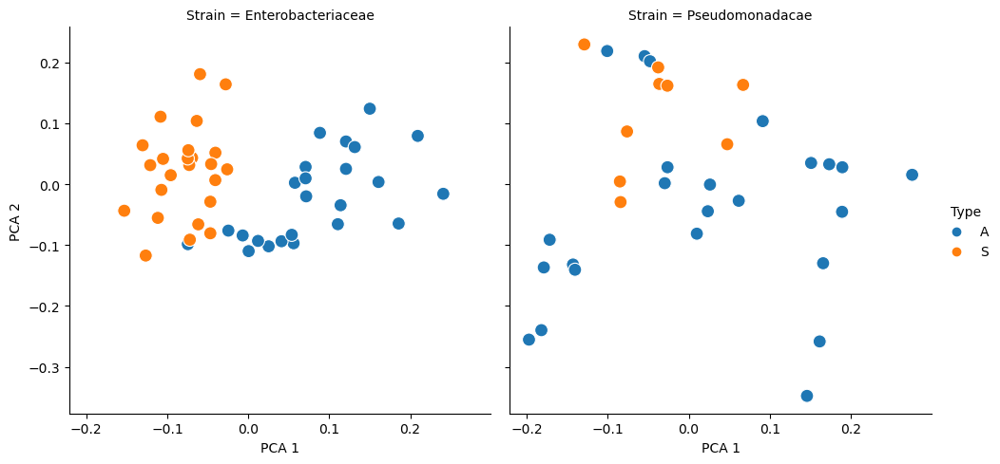

In [76]:
sns.relplot(data = pca_df, x = 'PCA 1', y = 'PCA 2', hue = 'Type', col = 'Strain', palette='tab10', s= 100)


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


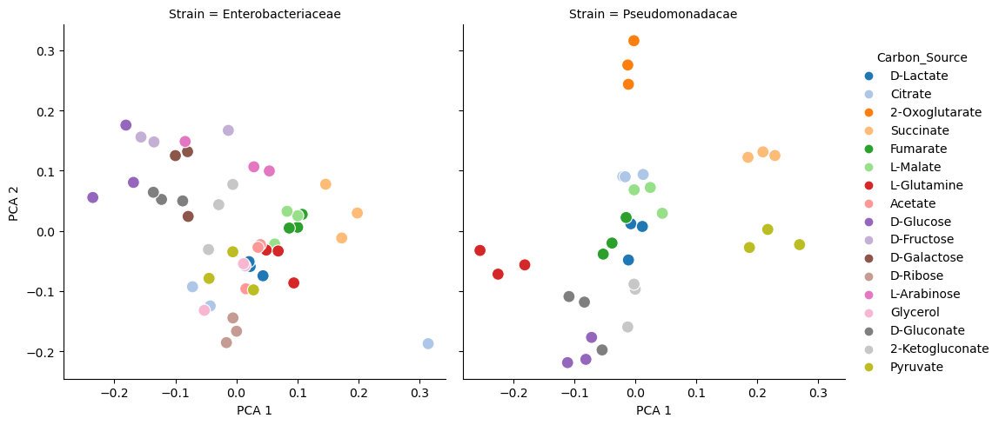

In [139]:
pca = PCA(n_components=2)
# X = pd.pivot_table(dfu.loc[sidx, :], index = 'Metabolite', columns = 'Carbon_Source', values = 'Z-score(log)', aggfunc='mean')
# dfu['ID'] = dfu['STRAIN
sidx = dfu.Strain == 'Enterobacteriaceae'

X = dfu.loc[:,:].pivot(index = 'Metabolite', columns = ['SID'], values = 'Z-score')
X = X.loc[X.isna().sum(axis=1)<5,:]

imputer = SimpleImputer()
Xi = imputer.fit_transform(X)
pca.fit(Xi)
# X = X.T.fillna(X.min(axis = 1)/10).T
pca_df = pd.DataFrame(pca.components_, index = ['PCA 1', 'PCA 2']).T
pca_df['CID'] = X.columns
pca_df['Strain'] = pca_df['CID'].map(cid_dict_s)
pca_df['Carbon_Source'] = pca_df['CID'].map(cid_dict_c)
pca_df['Type'] = pca_df['CID'].map(cid_dict_t)
sns.relplot(data = pca_df, x = 'PCA 1', y = 'PCA 2', hue = 'Carbon_Source', col = 'Strain', palette='tab20', s=100)


In [140]:
pca_df['OD'] = pca_df['CID'].map(cid_dict_od)

In [141]:
st.pearsonr(pca_df['OD'], pca_df['PCA 1'])

PearsonRResult(statistic=-0.7112539912938316, pvalue=1.0021647624709604e-13)

/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


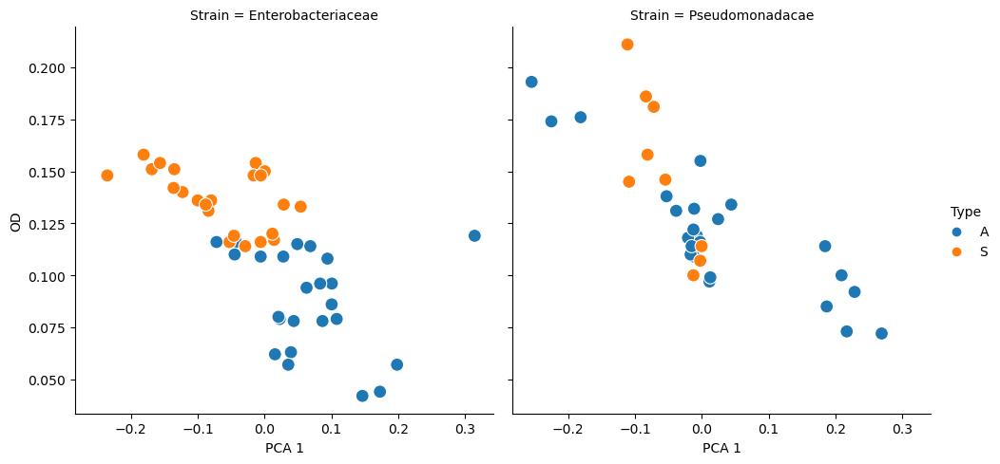

In [142]:
sns.relplot(data = pca_df, x = 'PCA 1', y = 'OD', hue = 'Type', col = 'Strain', palette='tab10', s= 100)


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


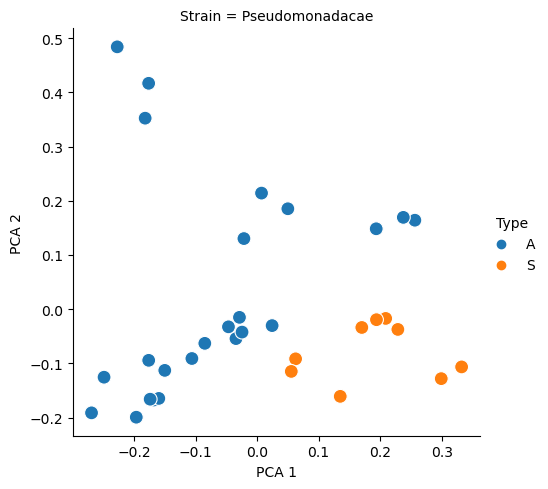

In [138]:
sns.relplot(data = pca_df, x = 'PCA 1', y = 'PCA 2', hue = 'Type', col = 'Strain', palette='tab10', s= 100)


# Question 2 - > Are metabolite values predictive of changes in release rates

In [10]:
metabolites = dfu.Metabolite.unique()
key = 'Peak_Intensity'
# key2 = 'Normalized peak 1'
# dfu[key2] = dfu[key]/(dfu['OD']**4)
for s in dfu.Strain.unique():
    sidx = dfu.Strain == s
    for m in metabolites:
        # Normalize both plates together?
        idx = (dfu.Metabolite == m)&sidx
        # dfu.loc[idx, 'Max-scaled'] = dfu.loc[idx, key]/np.max(dfu.loc[idx, key])
        dfu.loc[idx, 'Z-score'] = (dfu.loc[idx, key]-dfu.loc[idx, key].mean())/dfu.loc[idx, key].std()
        logscaled = np.log10(dfu.loc[idx, key])
        logscaled.replace([np.inf, -np.inf], np.nan, inplace=True)
        dfu.loc[idx, 'Z-score(log)'] = (logscaled-np.nanmean(logscaled))/np.nanstd(logscaled)
        # dfu.loc[idx, 'Z-score/OD'] = (dfu.loc[idx, key2]-dfu.loc[idx, key2].mean())/dfu.loc[idx, key2].std()


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/ssulheim/anaconda3/lib/python3.11/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [11]:
# dfu['TypeI'] = dfu.Type.map({'S':1,'A':2})
dfm = dfu.groupby(['Strain', 'Metabolite', 'Carbon_Source']).mean(numeric_only=True).reset_index()

<Axes: xlabel='Z-score', ylabel='Carbon_Source'>

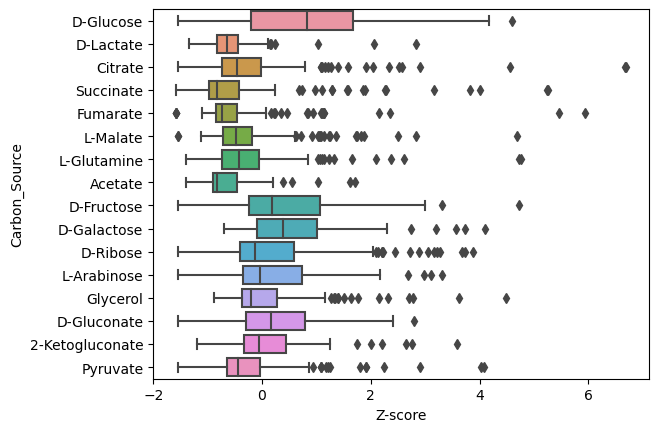

In [12]:
sidx = dfu.Strain == 'Enterobacteriaceae'
sns.boxplot(data=dfu.loc[sidx,:], y = 'Carbon_Source', x = 'Z-score')

# PCA etc 

In [27]:
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer

In [108]:
cid_dict = dfu[['SID', 'Strain', 'Carbon_Source', 'Type', 'OD']].drop_duplicates().set_index('SID').to_dict('index')
cid_dict_s = {key: value['Strain'] for key, value in cid_dict.items()}
cid_dict_c = {key: value['Carbon_Source'] for key, value in cid_dict.items()}
cid_dict_t = {key: value['Type'] for key, value in cid_dict.items()}
cid_dict_od = {key: value['OD'] for key, value in cid_dict.items()}

In [99]:
pca = PCA(n_components=2)
# X = pd.pivot_table(dfu.loc[sidx, :], index = 'Metabolite', columns = 'Carbon_Source', values = 'Z-score(log)', aggfunc='mean')
# dfu['ID'] = dfu['STRAIN
X = 10**dfu.pivot(index = 'Metabolite', columns = ['SID'], values = 'Corrected logscaled')#Z-score(log)
# X = X.loc[X.isna().sum(axis=1)<5,:]
X.fillna(0, inplace=True)
Xi = (X.T-X.T.mean(axis=0))/X.T.std(axis=0)
# imputer = SimpleImputer()
# Xi = imputer.fit_transform(X)
pca.fit(Xi.T)
# X = X.T.fillna(X.min(axis = 1)/10).T


PCA(n_components=2)

/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


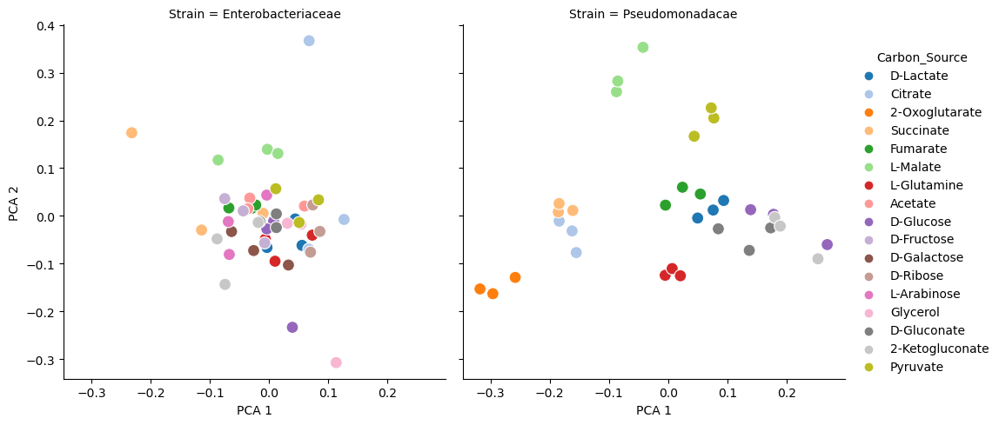

In [101]:
pca_df = pd.DataFrame(pca.components_, index = ['PCA 1', 'PCA 2']).T
pca_df['CID'] = X.columns
pca_df['Strain'] = pca_df['CID'].map(cid_dict_s)
pca_df['Carbon_Source'] = pca_df['CID'].map(cid_dict_c)
pca_df['Type'] = pca_df['CID'].map(cid_dict_t)
sns.relplot(data = pca_df, x = 'PCA 1', y = 'PCA 2', hue = 'Carbon_Source', col = 'Strain', palette='tab20', s = 100)


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


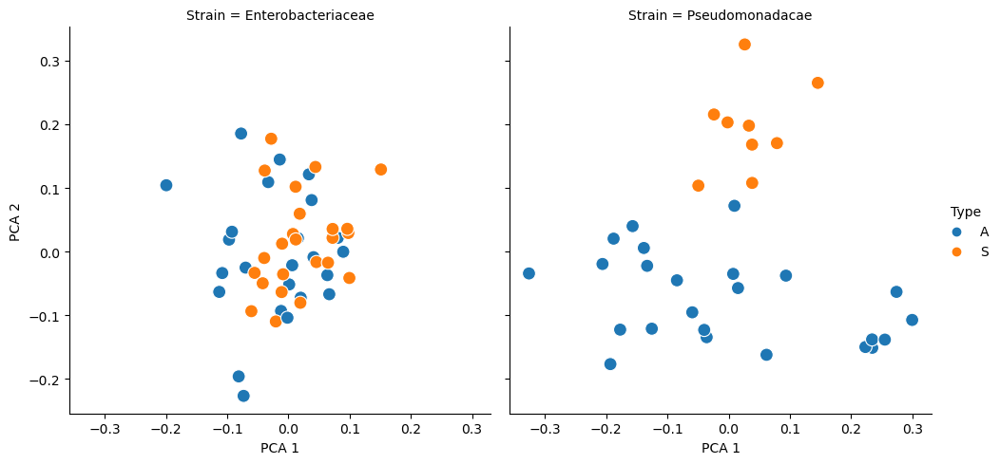

In [71]:
sns.relplot(data = pca_df, x = 'PCA 1', y = 'PCA 2', hue = 'Type', col = 'Strain', palette='tab10', s = 100)


In [72]:
pca = PCA(n_components=2)
# X = pd.pivot_table(dfu.loc[sidx, :], index = 'Metabolite', columns = 'Carbon_Source', values = 'Z-score(log)', aggfunc='mean')
# dfu['ID'] = dfu['STRAIN
X = dfu.pivot(index = 'Metabolite', columns = ['SID'], values = 'Corrected Z-score(log)')#Z-score(log)
X = X.loc[X.isna().sum(axis=1)<5,:]
imputer = SimpleImputer()
Xi = imputer.fit_transform(X)
pca.fit(Xi)
# X = X.T.fillna(X.min(axis = 1)/10).T


PCA(n_components=2)

/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


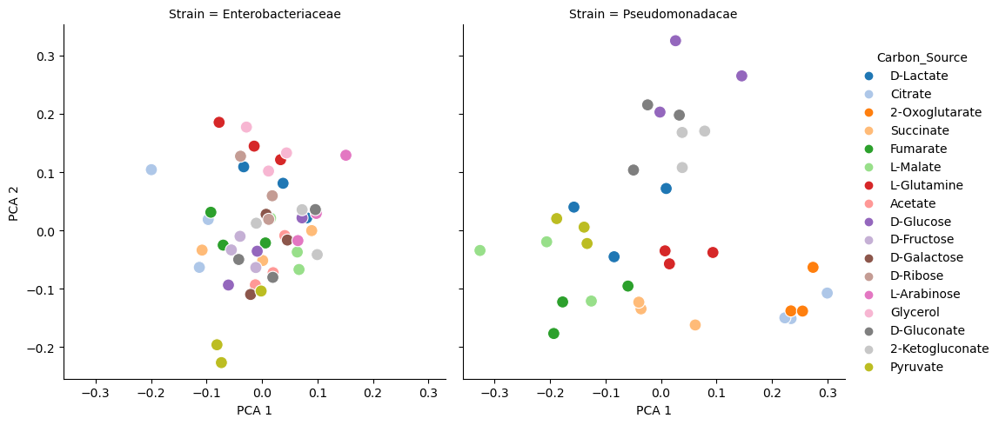

In [73]:
pca_df = pd.DataFrame(pca.components_, index = ['PCA 1', 'PCA 2']).T
pca_df['CID'] = X.columns
pca_df['Strain'] = pca_df['CID'].map(cid_dict_s)
pca_df['Carbon_Source'] = pca_df['CID'].map(cid_dict_c)
pca_df['Type'] = pca_df['CID'].map(cid_dict_t)
sns.relplot(data = pca_df, x = 'PCA 1', y = 'PCA 2', hue = 'Carbon_Source', col = 'Strain', palette='tab20', s = 100)


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


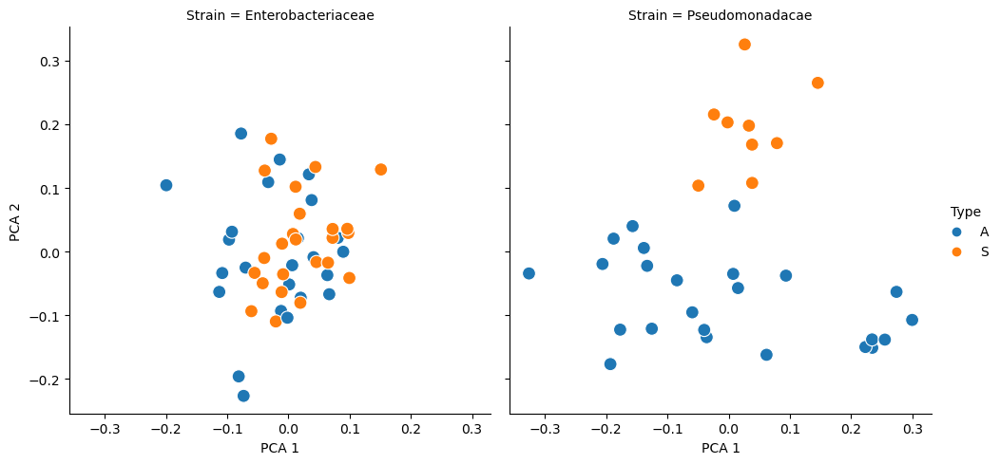

In [74]:
sns.relplot(data = pca_df, x = 'PCA 1', y = 'PCA 2', hue = 'Type', col = 'Strain', palette='tab10', s = 100)


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


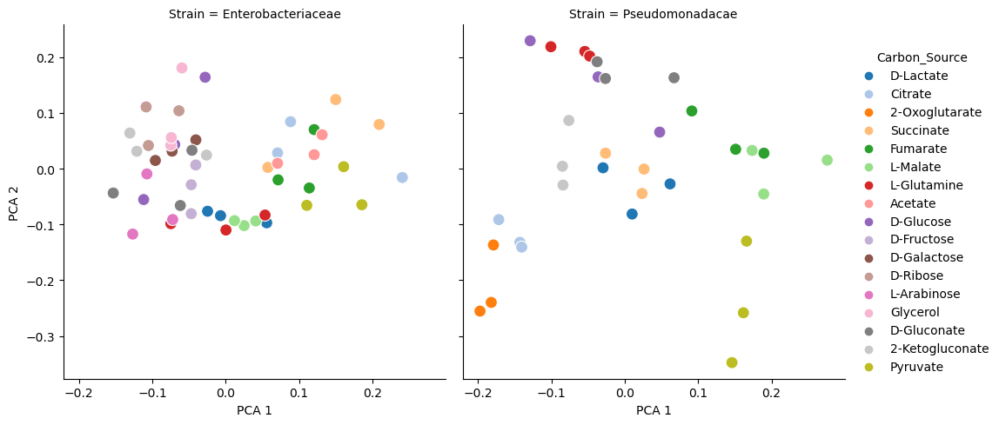

In [75]:
pca = PCA(n_components=2)
# X = pd.pivot_table(dfu.loc[sidx, :], index = 'Metabolite', columns = 'Carbon_Source', values = 'Z-score(log)', aggfunc='mean')
# dfu['ID'] = dfu['STRAIN
X = dfu.pivot(index = 'Metabolite', columns = ['SID'], values = 'Z-score(log)')
X = X.loc[X.isna().sum(axis=1)<5,:]

imputer = SimpleImputer()
Xi = imputer.fit_transform(X)
pca.fit(Xi)
# X = X.T.fillna(X.min(axis = 1)/10).T
pca_df = pd.DataFrame(pca.components_, index = ['PCA 1', 'PCA 2']).T
pca_df['CID'] = X.columns
pca_df['Strain'] = pca_df['CID'].map(cid_dict_s)
pca_df['Carbon_Source'] = pca_df['CID'].map(cid_dict_c)
pca_df['Type'] = pca_df['CID'].map(cid_dict_t)
sns.relplot(data = pca_df, x = 'PCA 1', y = 'PCA 2', hue = 'Carbon_Source', col = 'Strain', palette='tab20', s=100)


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


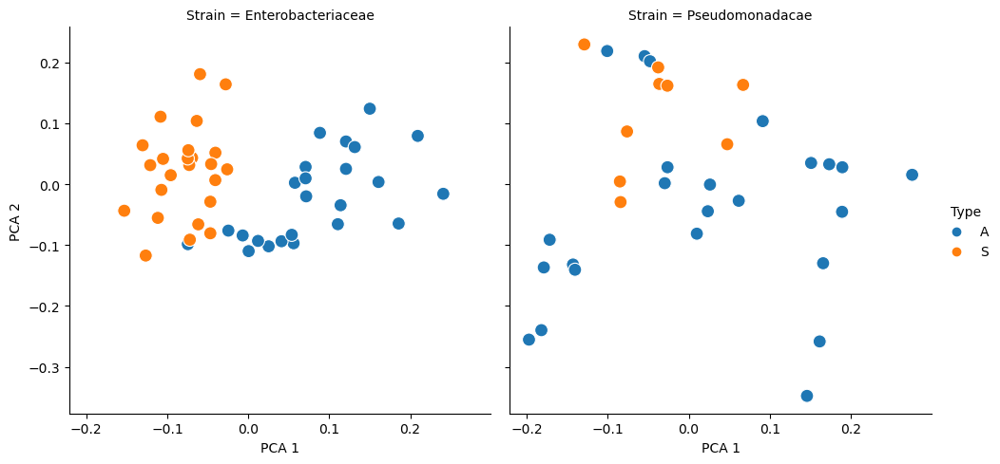

In [76]:
sns.relplot(data = pca_df, x = 'PCA 1', y = 'PCA 2', hue = 'Type', col = 'Strain', palette='tab10', s= 100)


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


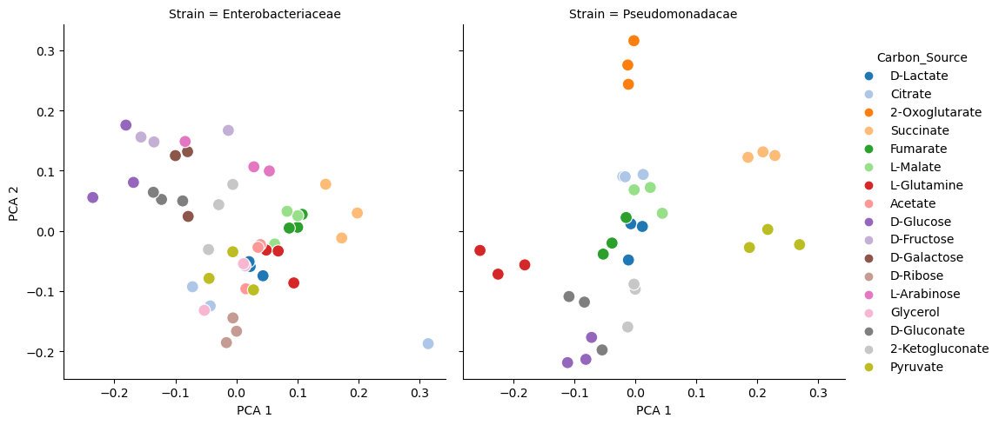

In [139]:
pca = PCA(n_components=2)
# X = pd.pivot_table(dfu.loc[sidx, :], index = 'Metabolite', columns = 'Carbon_Source', values = 'Z-score(log)', aggfunc='mean')
# dfu['ID'] = dfu['STRAIN
sidx = dfu.Strain == 'Enterobacteriaceae'

X = dfu.loc[:,:].pivot(index = 'Metabolite', columns = ['SID'], values = 'Z-score')
X = X.loc[X.isna().sum(axis=1)<5,:]

imputer = SimpleImputer()
Xi = imputer.fit_transform(X)
pca.fit(Xi)
# X = X.T.fillna(X.min(axis = 1)/10).T
pca_df = pd.DataFrame(pca.components_, index = ['PCA 1', 'PCA 2']).T
pca_df['CID'] = X.columns
pca_df['Strain'] = pca_df['CID'].map(cid_dict_s)
pca_df['Carbon_Source'] = pca_df['CID'].map(cid_dict_c)
pca_df['Type'] = pca_df['CID'].map(cid_dict_t)
sns.relplot(data = pca_df, x = 'PCA 1', y = 'PCA 2', hue = 'Carbon_Source', col = 'Strain', palette='tab20', s=100)


In [140]:
pca_df['OD'] = pca_df['CID'].map(cid_dict_od)

In [141]:
st.pearsonr(pca_df['OD'], pca_df['PCA 1'])

PearsonRResult(statistic=-0.7112539912938316, pvalue=1.0021647624709604e-13)

/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


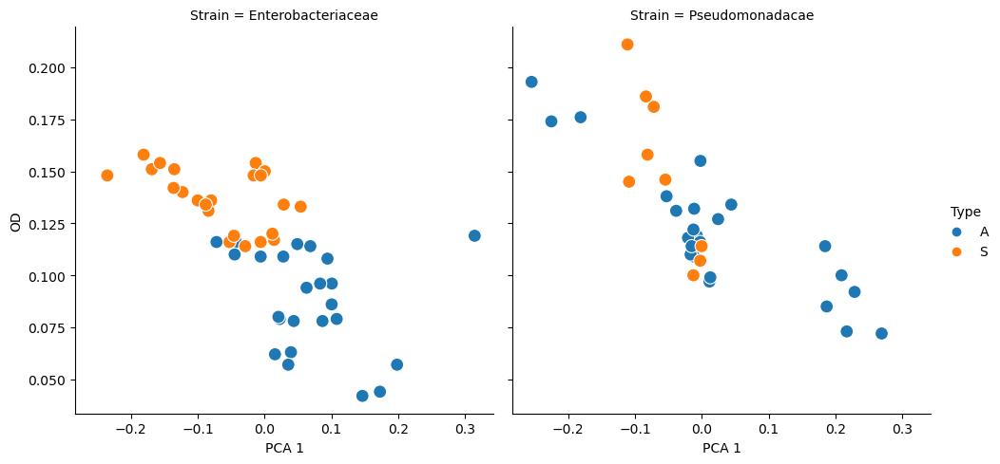

In [142]:
sns.relplot(data = pca_df, x = 'PCA 1', y = 'OD', hue = 'Type', col = 'Strain', palette='tab10', s= 100)


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


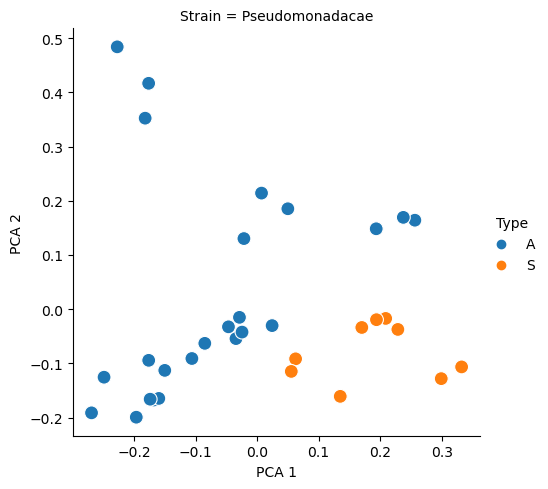

In [138]:
sns.relplot(data = pca_df, x = 'PCA 1', y = 'PCA 2', hue = 'Type', col = 'Strain', palette='tab10', s= 100)


# Question 2 - > Are metabolite values predictive of changes in release rates

## In which metabolites are there actually changes?
### Remove data where the metabolite is equal to the carbon source

In [306]:
cs_to_met_dict = {'D-Gluconate': 'Gluconic acid',
                  'Pyruvate': 'Pyruvic acid',
                  'L-Malate': 'Malic acid',
                  'Fumarate': 'Fumaric acid',
                  '2-Oxoglutarate': 'Oxoglutaric acid',
                  'Citrate': 'Citric/Isocitric acid',
                  'D-Lactate': 'Lactic acid/Glyceraldehyde'}

In [307]:
for cs, met in cs_to_met_dict.items():
    idx = (dfu.Carbon_Source == cs) & (dfu.Metabolite == met)
    dfu.loc[idx, 'Peak_Intensity'] = np.nan

In [308]:
dfu.Carbon_Source

0       D-Glucose
1       D-Glucose
2       D-Glucose
3       D-Glucose
4       D-Glucose
          ...    
4450     Pyruvate
4451     Pyruvate
4452     Pyruvate
4453     Pyruvate
4454     Pyruvate
Name: Carbon_Source, Length: 4455, dtype: object

## Calculate significant changes in metabolite concentration

In [460]:
ttest_pvals = {}
carbon_sources = dfu.Carbon_Source.unique()
nc = len(carbon_sources)
ttest_pval_arr = np.zeros((nc,nc))
data = []
key = 'Corrected Z-score(log)'
p_val_lim = 0.01
for met in dfu.Metabolite.unique():
    for strain in dfu.Strain.unique():
        idx = (dfu.Metabolite == met) & (dfu.Strain == strain)
        for i in range(nc):
            for j in range(nc):
                cs0 = carbon_sources[i]
                cs = carbon_sources[j]
                cs0_type = cs_to_type_map[cs0]
                cs_type = cs_to_type_map[cs]
                if cs0_type == cs_type:
                    if cs0_type == 'S':
                        type_diff = 'Sugar-Sugar'
                    else:
                        type_diff = 'Acid-Acid'
                else:
                    if cs0_type == 'S':
                        type_diff = 'Sugar-Acid'
                    else:
                        type_diff = 'Acid-Sugar'
                idxcs0 = idx & (dfu.Carbon_Source == cs0)
                idxcs  = idx & (dfu.Carbon_Source == cs)
                val0 = dfu.loc[idxcs0, key]
                valcs = dfu.loc[idxcs, key]
                if not (len(val0) and len(valcs)):
                    continue
                x0_arr = []
                x1_arr = []
                for x0, x1 in zip(val0.values, valcs.values):
                    if np.isfinite(x0) and np.isfinite(x1):
                        x0_arr.append(x0)
                        x1_arr.append(x1)
                        
                if not (len(x0_arr)>1 and len(x1_arr)>1):
                    continue
                # print(i, j, cs0, cs, len(val0), len(valcs))
                # I think equal_var is true when the data is log-scaled (se scatterplots)
                tscore = st.ttest_ind(x0_arr, x1_arr, equal_var=True)
                ttest_pvals[(cs0, cs)] = tscore.pvalue
                ttest_pval_arr[i,j] = tscore.pvalue
                # print(s, m, cs0, cs, x0_arr, x1_arr, tscore.pvalue)
                # Qualitative evaluation
                # log_diff = np.log10(np.mean(val0)) - np.log10(np.mean(valcs))
                diff = np.nanmean(x0_arr) - np.nanmean(x1_arr)
                # ratio = np.mean(x0_arr)/np.mean(x1_arr)
                if tscore.pvalue < p_val_lim:
                    if diff > 0:
                        qscore = 1
                    else:
                        qscore = -1
                elif np.isnan(tscore.pvalue):
                    qscore = np.nan
                else:
                    qscore = 0
                # print(cs0, cs, st.ttest_ind(val0, valcs))
                
                data.append([strain, met, cs0, cs, type_diff, np.nanmean(x0_arr), np.nanmean(x1_arr), tscore.pvalue, diff,qscore])
                

In [310]:
ttest_df = pd.DataFrame(data, columns = ['Strain', 'Metabolite', 'Carbon source 1', 'Carbon source 2', 'Type diff', 'X1', 'X2', 'P-value', 'Difference', 'Ratio', 'Outcome'])

In [311]:
ttest_df.head(5)

,Strain,Metabolite,Carbon source 1,Carbon source 2,Type diff,X1,X2,P-value,Difference,Ratio,Outcome
0,Enterobacteriaceae,"2',4'-Dihydroxyacetophenone",D-Glucose,D-Glucose,Sugar-Sugar,0.444628,0.444628,1.000000,0.000000,1.000000,0
1,Enterobacteriaceae,"2',4'-Dihydroxyacetophenone",D-Glucose,Citrate,Sugar-Acid,0.199567,-0.108929,0.708159,0.308496,-1.832084,0
2,Enterobacteriaceae,"2',4'-Dihydroxyacetophenone",D-Glucose,D-Fructose,Sugar-Sugar,0.444628,0.423623,0.964618,0.021005,1.049584,0
3,Enterobacteriaceae,"2',4'-Dihydroxyacetophenone",D-Glucose,D-Galactose,Sugar-Sugar,0.444628,-1.011935,0.371854,1.456563,-0.439384,0
4,Enterobacteriaceae,"2',4'-Dihydroxyacetophenone",D-Glucose,L-Arabinose,Sugar-Sugar,0.884282,0.185110,0.261852,0.699172,4.777065,0


In [312]:
ttest_df.sort_values('P-value', ascending=True).to_csv('ttest_results.csv')

In [313]:
n_changes_df = ttest_df.loc[ttest_df['P-value'] < 0.01, :].groupby(['Strain', 'Carbon source 1', 'Carbon source 2']).count().reset_index()

/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/matrix.py:624: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


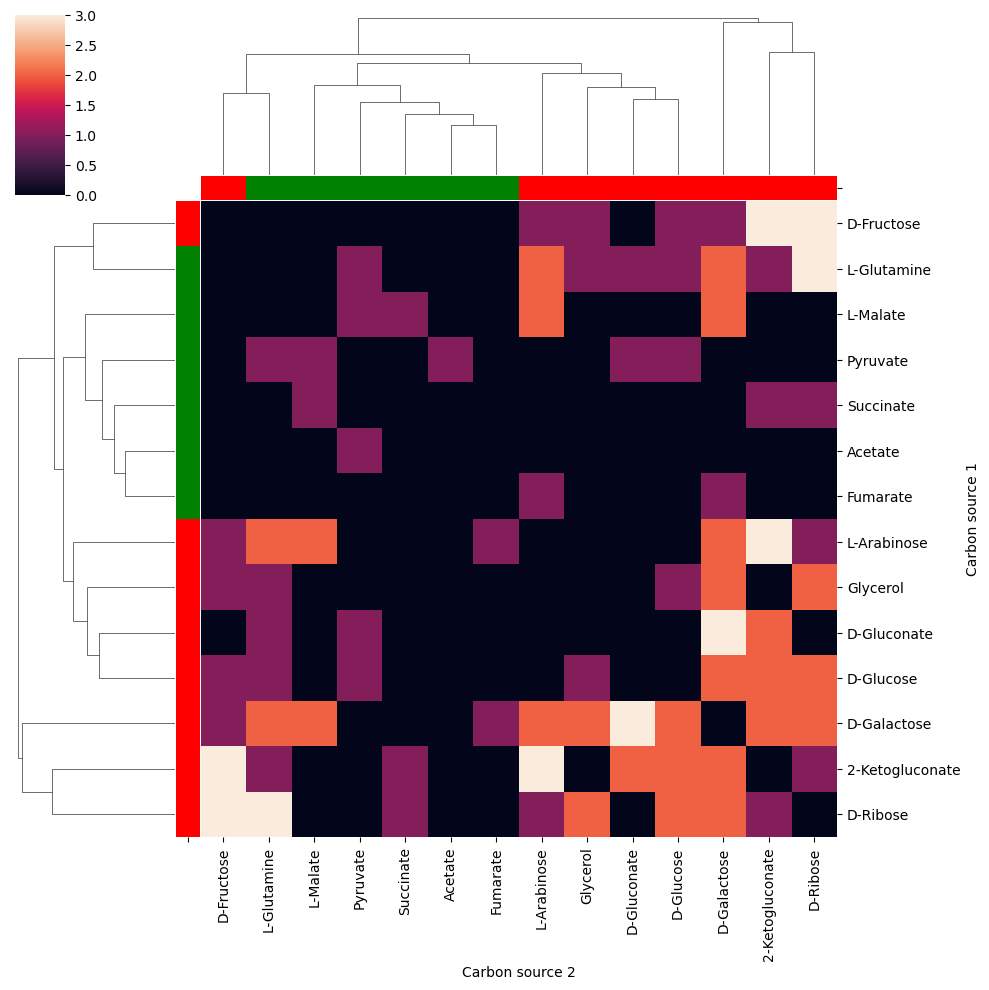

In [314]:
sidx = n_changes_df.Strain == 'Enterobacteriaceae'
pivot = n_changes_df.loc[sidx, :].pivot(index = 'Carbon source 1', columns = 'Carbon source 2', values = 'Metabolite')
pivot.fillna(0, inplace = True)
# mask = np.triu(pivot)

cscolors = pd.Series(cs_to_color_map)
sns.clustermap(pivot, row_colors=cscolors, col_colors=cscolors)#, mask = mask)

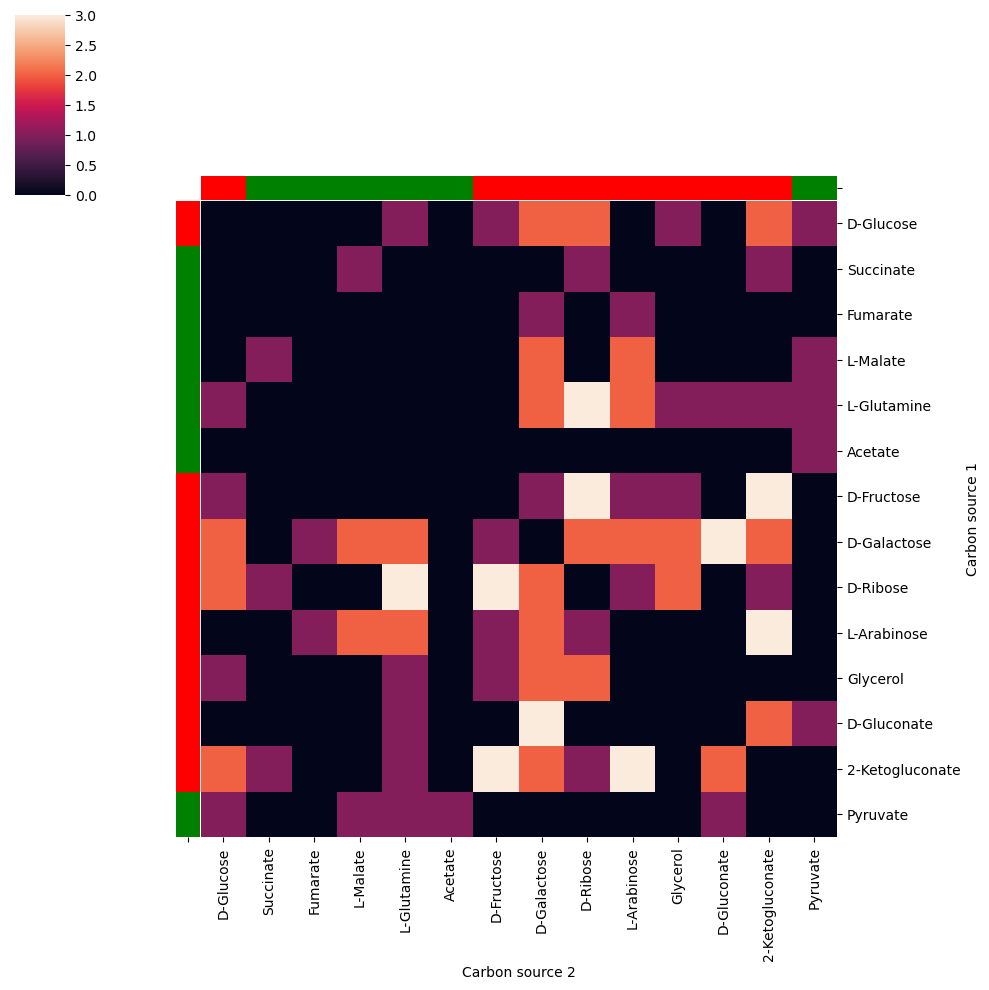

In [316]:
sidx = n_changes_df.Strain == 'Enterobacteriaceae'
pivot = n_changes_df.loc[sidx, :].pivot(index = 'Carbon source 1', columns = 'Carbon source 2', values = 'Metabolite')
pivot.fillna(0, inplace = True)
# mask = np.triu(pivot)

cscolors = pd.Series(cs_to_color_map)
col_order = [x for x in carbon_sources if x in pivot.columns]
row_order = [x for x in carbon_sources if x in pivot.index]
sns.clustermap(pivot.loc[row_order,col_order], row_colors=cscolors, col_colors=cscolors, row_cluster=False, col_cluster=False)#, mask = mask)

/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/matrix.py:624: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


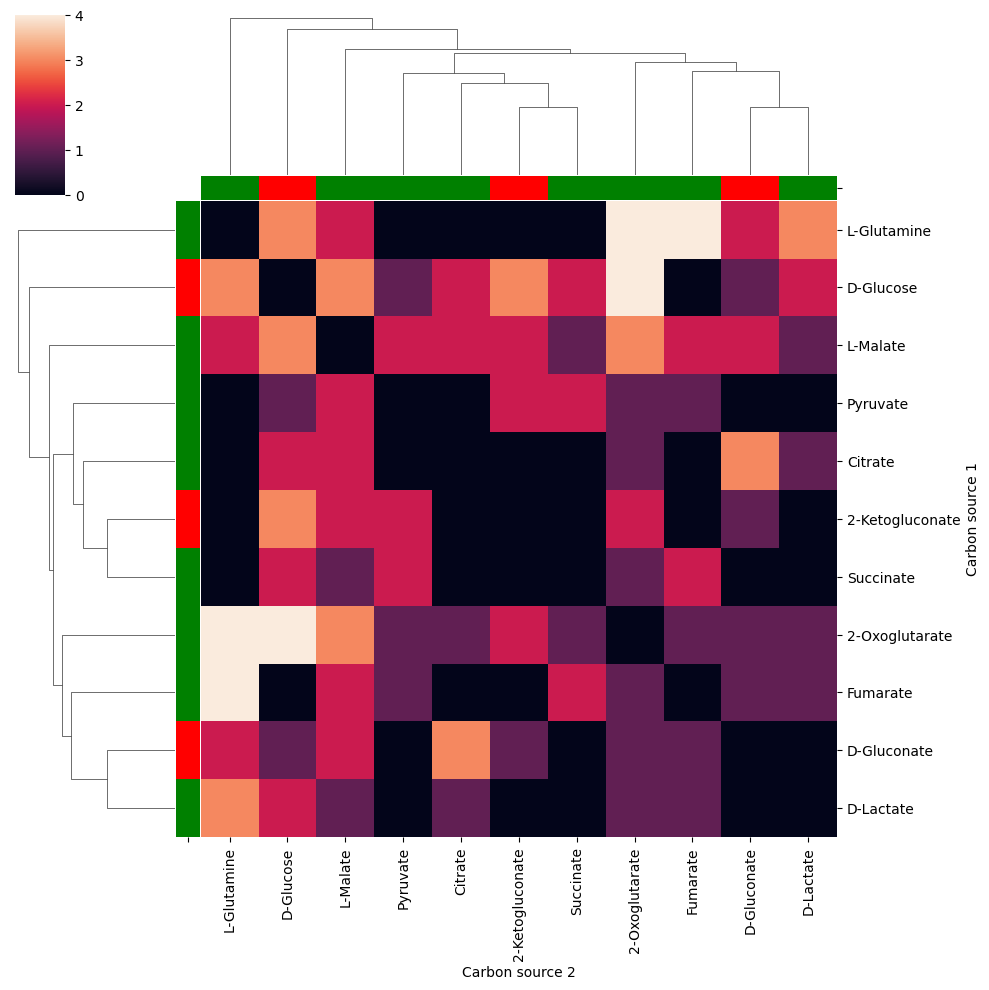

In [318]:
sidx = n_changes_df.Strain == 'Pseudomonadacae'
pivot = n_changes_df.loc[sidx, :].pivot(index = 'Carbon source 1', columns = 'Carbon source 2', values = 'Metabolite')
pivot.fillna(0, inplace = True)
# mask = np.triu(pivot)

cscolors = pd.Series(cs_to_color_map)
sns.clustermap(pivot, row_colors=cscolors, col_colors=cscolors)#, mask = mask)

## Calculate metabolite values for all pairs

In [35]:
fnmc = folder / 'ms_name_to_id_curated.csv'
dfmc = pd.read_csv(fnmc, index_col = 0)
translate_dict = dfmc[['Untargeted MS name', 'Metabolite ID']].set_index('Untargeted MS name').to_dict()['Metabolite ID']
model = model_ez

In [325]:
translate_dict_r = {value:key for key, value in translate_dict.items()}

In [319]:
model_dict = {'Enterobacteriaceae': model_ez,
              'Pseudomonadacae'   : model_p}

In [327]:
measured_mets = []
measured_metnames = []
for key, value in translate_dict.items():
    m_id = f'{value}_c'
    # try:
    #     m = model.metabolites.get_by_id(m_id)
    # except KeyError:
    #     pass
    # else:
    measured_mets.append(m_id)
    measured_metnames.append(key)
    

In [419]:
dfu.Carbon_Source.unique()

array(['D-Glucose', 'D-Lactate', 'Citrate', '2-Oxoglutarate', 'Succinate',
       'Fumarate', 'L-Malate', 'L-Glutamine', 'Acetate', 'D-Fructose',
       'D-Galactose', 'D-Ribose', 'L-Arabinose', 'Glycerol',
       'D-Gluconate', '2-Ketogluconate', 'Pyruvate'], dtype=object)

In [420]:
cs_to_exchange = {'D-Glucose': 'EX_glc__D_e',
                'D-Lactate': 'EX_lac__L_e',
                'Citrate': 'EX_cit_e',
                '2-Oxoglutarate': 'EX_akg_e',
                'Succinate': 'EX_succ_e',
                'Fumarate': 'EX_fum_e',
                'L-Malate': 'EX_mal__L_e',
                'L-Glutamine': 'EX_gln__L_e',
                'Acetate': 'EX_ac_e',
                'D-Fructose': 'EX_fru_e',
                'D-Galactose': 'EX_gal_e',
                'D-Ribose': 'EX_rib__D_e',
                'L-Arabinose': 'EX_arab__L_e',
                'Glycerol': 'EX_glyc_e',
                'D-Gluconate': 'EX_glcn_e',
                '2-Ketogluconate': 'EX_25dkglcn_e',
                'Pyruvate': 'EX_pyr_e'}

In [323]:
# metabolite_value_dict = OrderedDict()
# growth_dict = OrderedDict()
# model.reactions.EX_glc__D_e.lower_bound = 0
# for cs, ex_id in cs_to_exchange.items():
#     with model:
#         try:
#             r = model.reactions.get_by_id(ex_id)
#         except KeyError:
#             print(f'{ex_id} not in model')
#             continue
#         m_ex = r.metabolites.popitem()[0]
#         lb = 30/m_ex.elements['C']
#         # model.reactions.EX_pi_e.lower_bound = -1
#         r.lower_bound = -lb
#         solution = model.optimize()
#         if solution.objective_value:
#             # print(model.summary())

#             growth_dict[cs] = solution.objective_value
#             metabolite_value_dict[cs] = -solution.shadow_prices[measured_mets]
        

In [418]:
cs_to_exchange.keys()

dict_keys(['D-Glucose', 'D-Lactate', 'Citrate', '2-Oxoglutarate', 'Succinate', 'Fumarate', 'L-Malate', 'L-Glutamine', 'Acetate', 'D-Galactose', 'D-Ribose', 'L-Arabinose', 'Glycerol', 'D-Gluconate', '2-Ketogluconate', 'Pyruvate'])

In [515]:
metabolite_value_dict = OrderedDict()
metabolite_value_list = []
for s in dfu.Strain.unique():
    strain_metabolite_value_dict = OrderedDict()
    model = model_dict[s]
    model.reactions.EX_glc__D_e.lower_bound = 0
    model_metabolites = [m.id for m in model.metabolites]
    for cs, ex_id in cs_to_exchange.items():
        with model:
            try:
                r = model.reactions.get_by_id(ex_id)
            except KeyError:
                print(f'{ex_id} not in model')
                continue
            m_ex = r.metabolites.popitem()[0]
            try:
                nC = model_ez.metabolites.get_by_id(m_ex.id).elements['C']
            except KeyError:
                if len(m_ex.elements):
                    nC = m_ex.elements['C']
                else:
                    nC = 6
            lb = 30/nC
            # model.reactions.EX_pi_e.lower_bound = -1
            r.lower_bound = -lb
            solution = model.optimize()
            if solution.objective_value:
                # print(model.summary())

                # growth_dict[cs] = solution.objective_value
                
                strain_metabolite_value_dict[cs] = -solution.shadow_prices[[x for x in measured_mets if x in model_metabolites]]
                for key, value in strain_metabolite_value_dict[cs].items():
                    m_name = translate_dict_r[key[:-2]]
                    metabolite_value_list.append([s, cs,m_name , value])
metabolite_value_dict[s] = strain_metabolite_value_dict

EX_25dkglcn_e not in model
EX_gal_e not in model
EX_arab__L_e not in model


In [516]:
met_value_df = pd.DataFrame(metabolite_value_list, columns = ['Strain', 'Carbon source', 'Metabolite', 'Metabolite value'])

In [491]:
# dfsp = pd.DataFrame(metabolite_value_dict).T

In [492]:
# met_value_df

In [493]:
# dfsp[dfsp < 0] = np.nan
# dfsp.columns = [x.replace('_c', '') for x in dfsp.columns]

In [517]:
metabolite_values = {}
metabolite_zscores = {}
for strain in dfu.Strain.unique():
    dfsp = met_value_df.loc[met_value_df.Strain == strain, :].pivot(index = 'Metabolite', columns = 'Carbon source', values = 'Metabolite value')
    Zdfsp = (dfsp-dfsp.mean())/dfsp.std()
    metabolite_values[strain] = dfsp.T.to_dict()
    metabolite_zscores[strain] = Zdfsp.T.to_dict()

In [518]:
# metabolite_values[dfu.Strain.unique()[0]]

In [519]:
met_value_df.loc[met_value_df.Strain == 'Enterobacteriaceae', :]['Carbon source'].unique()

array(['D-Glucose', 'D-Lactate', 'Citrate', '2-Oxoglutarate', 'Succinate',
       'Fumarate', 'L-Malate', 'L-Glutamine', 'Acetate', 'D-Fructose',
       'D-Galactose', 'D-Ribose', 'L-Arabinose', 'Glycerol',
       'D-Gluconate', 'Pyruvate'], dtype=object)

## Compute differences in metabolite values

In [521]:
ratio_diff_sp = np.zeros(len(ttest_df))
log_diff = np.zeros(len(ttest_df))
for i, row in ttest_df.iterrows():
    m_name = row['Metabolite']
    strain = row['Strain']
    if not isinstance(m_name, str):
        ratio_diff_sp[i] = np.nan
        log_diff[i] = np.nan
    elif not metabolite_values[strain].get(m_name):
        ratio_diff_sp[i] = np.nan
        log_diff[i] = np.nan
    else:
        cs1 = row['Carbon source 1']
        cs2 = row['Carbon source 2']
        # print(c1, cs2)
        try:
            ratio_diff_sp[i] = metabolite_values[strain][m_name][cs1]/metabolite_values[strain][m_name][cs2]
            log_diff[i] = np.log10(metabolite_values[strain][m_name][cs1]) - np.log10(metabolite_values[strain][m_name][cs2])
        except (KeyError, ZeroDivisionError):
            ratio_diff_sp[i] = np.nan
            log_diff[i] = np.nan
        # print(strain, m_name, cs1, cs2, ratio_diff_sp[i], log_diff[i])


/var/folders/h6/4b_zz_cd5d92w2ycp017ytn00000gp/T/ipykernel_3711/4159258003.py:18: RuntimeWarning: invalid value encountered in log10
  log_diff[i] = np.log10(metabolite_values[strain][m_name][cs1]) - np.log10(metabolite_values[strain][m_name][cs2])


In [522]:
ttest_df['MV ratio diff'] = ratio_diff_sp
ttest_df['MV log diff'] = log_diff

In [523]:
added = {}
keep_idx = []
for idx, row in ttest_df.iterrows():
    m = row['Metabolite']
    s = row['Strain']
    c1 = row['Carbon source 1']
    c2 = row['Carbon source 2']
    lst1 = [s,m,c1,c2]
    lst2 = [s,m,c2,c1]
    if row['Type diff'] == 'Acid-Sugar':
        continue
    if added.get('-'.join(lst1)) or added.get('-'.join(lst2)):
        pass
    else:
        keep_idx.append(idx)
        added['-'.join(lst1)] = True

In [524]:
rttest_df = ttest_df.loc[keep_idx,:]

In [525]:
rttest_df

,Strain,Metabolite,Carbon source 1,Carbon source 2,Type diff,X1,X2,P-value,Difference,Ratio,Outcome,MV ratio diff,MV log diff
0,Enterobacteriaceae,"2',4'-Dihydroxyacetophenone",D-Glucose,D-Glucose,Sugar-Sugar,0.444628,0.444628,1.000000,0.000000,1.000000,0,NaN,NaN
1,Enterobacteriaceae,"2',4'-Dihydroxyacetophenone",D-Glucose,Citrate,Sugar-Acid,0.199567,-0.108929,0.708159,0.308496,-1.832084,0,NaN,NaN
2,Enterobacteriaceae,"2',4'-Dihydroxyacetophenone",D-Glucose,D-Fructose,Sugar-Sugar,0.444628,0.423623,0.964618,0.021005,1.049584,0,NaN,NaN
3,Enterobacteriaceae,"2',4'-Dihydroxyacetophenone",D-Glucose,D-Galactose,Sugar-Sugar,0.444628,-1.011935,0.371854,1.456563,-0.439384,0,NaN,NaN
4,Enterobacteriaceae,"2',4'-Dihydroxyacetophenone",D-Glucose,L-Arabinose,Sugar-Sugar,0.884282,0.185110,0.261852,0.699172,4.777065,0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4368,Pseudomonadacae,Xanthosine,D-Gluconate,2-Oxoglutarate,Sugar-Acid,-0.455297,-0.175565,0.835405,-0.279732,2.593330,0,0.937691,-0.027940
4369,Pseudomonadacae,Xanthosine,D-Gluconate,Fumarate,Sugar-Acid,-1.141110,0.524034,0.448682,-1.665143,-2.177551,0,0.937691,-0.027940
4370,Pseudomonadacae,Xanthosine,D-Gluconate,L-Malate,Sugar-Acid,-0.986344,-0.028502,0.670349,-0.957843,34.606528,0,0.937691,-0.027940
4371,Pseudomonadacae,Xanthosine,D-Gluconate,L-Glutamine,Sugar-Acid,-0.455297,0.447360,0.515694,-0.902656,-1.017742,0,0.932919,-0.030156


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


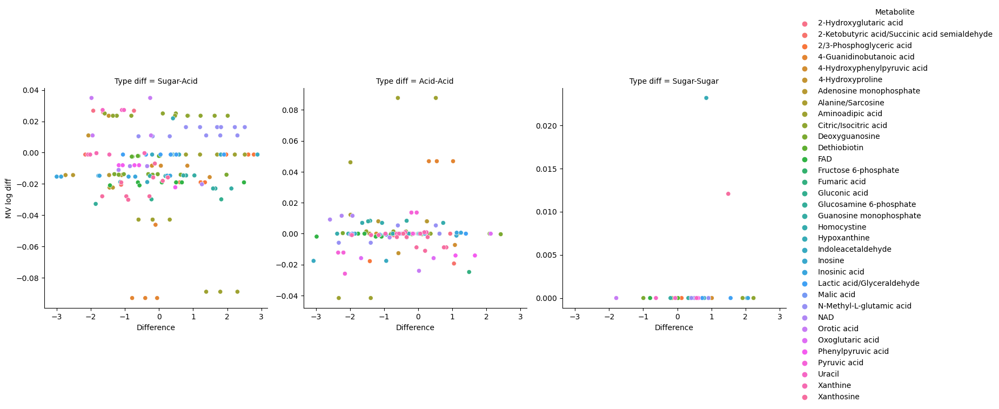

In [527]:
sidx = rttest_df.Strain ==  'Pseudomonadacae'#'Enterobacteriaceae'
# sidx = ttest_df.Strain ==  'Enterobacteriaceae'
pidx = rttest_df['P-value'] < 1
rttest_df.loc[:,'Size'] = 20 - 2*np.log10(ttest_df.loc[:,'P-value'])
nanidx = ~rttest_df['MV log diff'].isna()
sns.relplot(data = rttest_df.loc[pidx&sidx&nanidx,:], x = 'Difference', y = 'MV log diff', hue = 'Metabolite', col = 'Type diff', col_wrap= 3, facet_kws={'sharey': False, 'sharex': True})

# Compare Corrected Z-scores with metabolite values

In [528]:
dfu_met_values = np.zeros(len(dfu))
for i, row in dfu.iterrows():
    m_name = row['Metabolite']
    strain = row['Strain']
    # m_id = translate_dict[m_name]
    cs = row['Carbon_Source']
    try:
        # mv = metabolite_zscores[strain][m_name][cs]
        mv = metabolite_values[strain][m_name][cs]
    except KeyError:
        mv = np.nan
    dfu_met_values[i] = mv

dfu['Metabolite value'] = dfu_met_values
dfu['log(mv)'] = np.log10(dfu_met_values)
    
                      
                    

/var/folders/h6/4b_zz_cd5d92w2ycp017ytn00000gp/T/ipykernel_3711/4096790698.py:15: RuntimeWarning: divide by zero encountered in log10
  dfu['log(mv)'] = np.log10(dfu_met_values)
/var/folders/h6/4b_zz_cd5d92w2ycp017ytn00000gp/T/ipykernel_3711/4096790698.py:15: RuntimeWarning: invalid value encountered in log10
  dfu['log(mv)'] = np.log10(dfu_met_values)


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


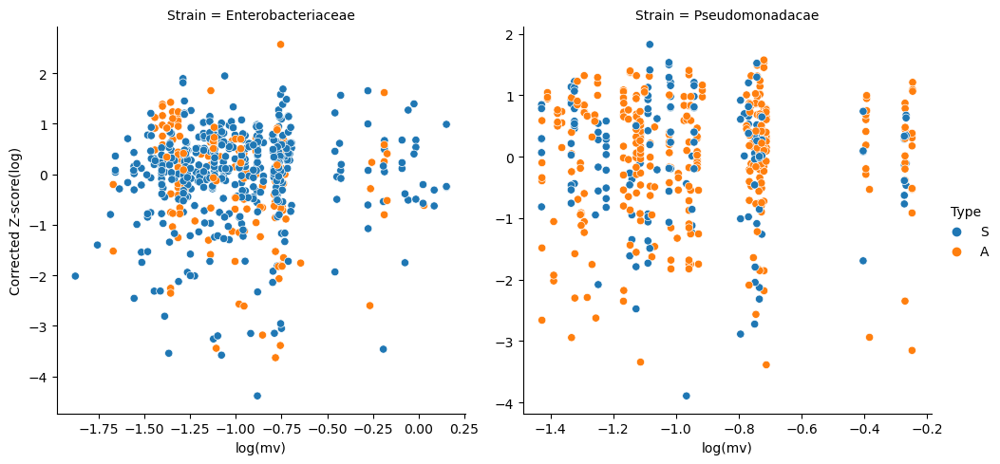

In [529]:
# nanidx = dfu[['Metabolite value', 'Corrected Z-score(log)']].isna().any(axis = 1)
# sidx = dfu.Strain == 'Enterobacteriaceae'
# sns.relplot(data = dfu, x = 'Metabolite value', y = 'Corrected Z-score(log)', hue = 'Carbon_Source', facet_kws={'sharey': False, 'sharex': False}, col = 'Strain')#col='Metabolite', col_wrap=4, 
sns.relplot(data = dfu, x = 'log(mv)', y = 'Corrected Z-score(log)', hue = 'Type', facet_kws={'sharey': False, 'sharex': False}, col = 'Strain')#col='Metabolite', col_wrap=4, 

/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


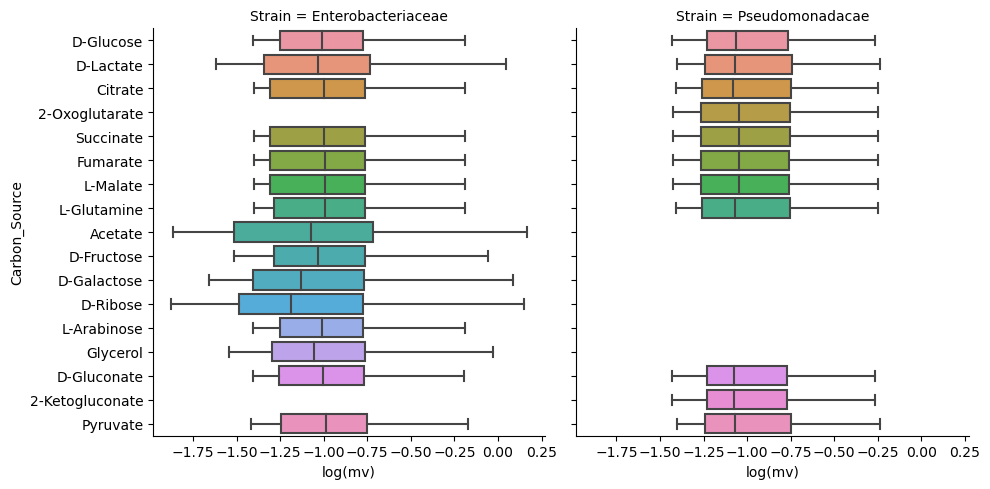

In [531]:
sns.catplot(data = dfu, col='Strain', x = 'log(mv)', kind = 'box', y = 'Carbon_Source')

/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


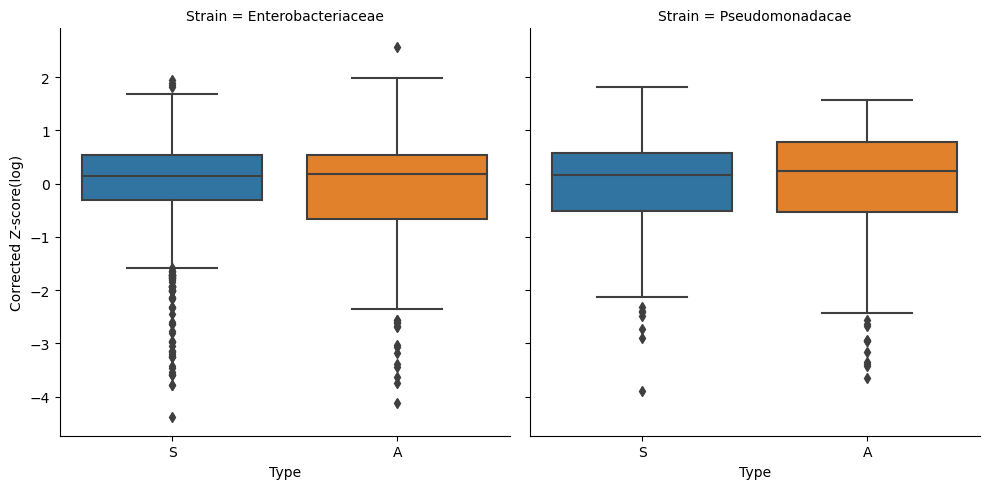

In [511]:
sns.catplot(data = dfu, col='Strain', y = 'Corrected Z-score(log)', x = 'Type', kind = 'box')

/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


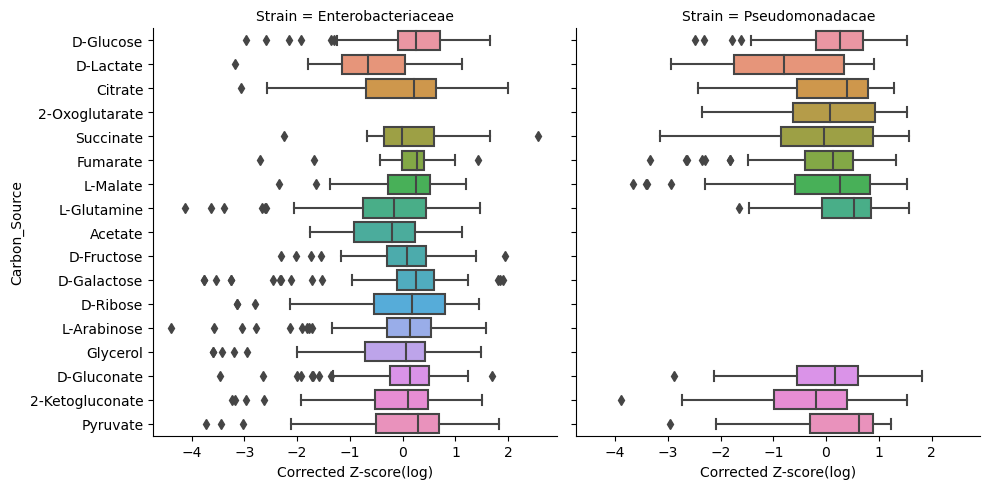

In [513]:
sns.catplot(data = dfu, col='Strain', x = 'Corrected Z-score(log)', y = 'Carbon_Source', kind = 'box')

In [532]:
tidx = dfu.Type == 'S'
all_x = dfu.loc[~nanidx&~sidx&tidx,'Metabolite value']
all_y = dfu.loc[~nanidx&~sidx&tidx,'Corrected Z-score(log)']
prho, ppval = st.pearsonr(all_x, all_y)
print(prho,ppval)
srho, spval = st.spearmanr(all_x, all_y)
print(srho,spval)

ValueError: array must not contain infs or NaNs

/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


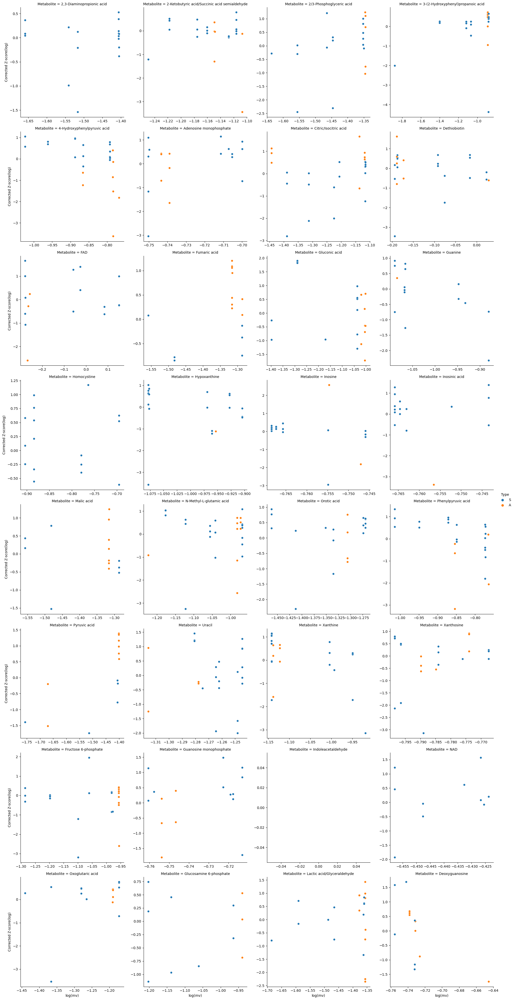

In [535]:
nanidx = dfu[['Metabolite value', 'Corrected Z-score(log)']].isna().any(axis = 1)
sidx = dfu.Strain == 'Enterobacteriaceae'
sns.relplot(data = dfu.loc[~nanidx&sidx,:], x = 'log(mv)', y = 'Corrected Z-score(log)', hue = 'Type', col='Metabolite', col_wrap=4, facet_kws={'sharey': False, 'sharex': False})#Metabolite value

/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


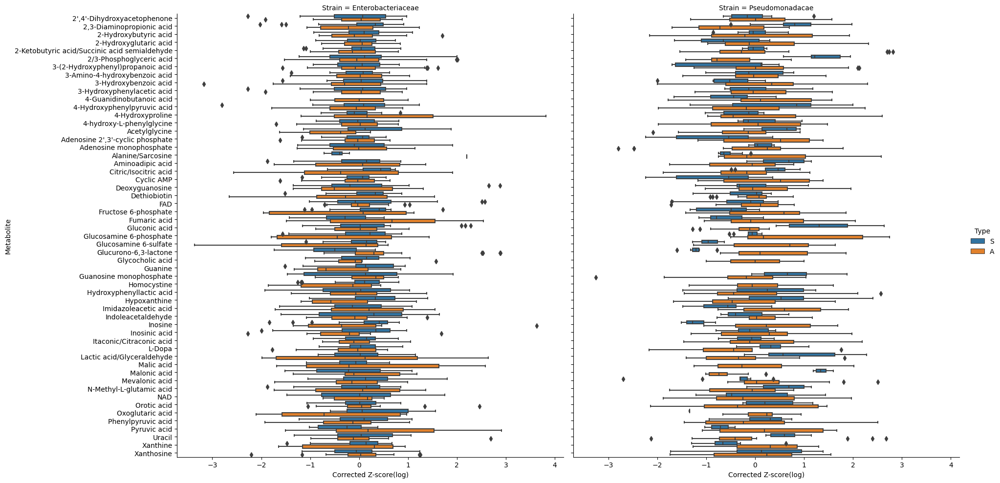

In [120]:
sidx = dfu.Strain == 'Enterobacteriaceae'
# fig, ax = plt.subplots(1, figsize = (6, 18))
x = 'Corrected Z-score(log)'
y = 'Metabolite'
# order = [x for x in dfu.loc[sidx,'Metabolite'].unique()]
# sns.boxplot(data = dfu.loc[~sidx,:], x = x, y = y, hue = 'Type', ax = ax)#, order = order)
sns.catplot(data = dfu, x = x, y = y, hue = 'Type', col = "Strain", kind = 'box', height=10, aspect=1)#, order = order)

mannwhitney = []
for s in dfu.Strain.unique():
    for m in dfu.Metabolite.unique():
        idxS = (dfu.Strain == s) & (dfu.Metabolite == m) & (dfu.Type=='S')
        idxA = (dfu.Strain == s) & (dfu.Metabolite == m) & (dfu.Type=='A')
        
        czsS = dfu.loc[idxS, 'Corrected Z-score(log)'].values
        czsA = dfu.loc[idxA, 'Corrected Z-score(log)'].values
        x_arr = []
        y_arr = []
        for x, y in zip(czsS, czsA):
            if np.isfinite(x) and np.isfinite(y):
                x_arr.append(x)
                y_arr.append(y)
        if len(x_arr) and len(y_arr):
            res = sp.stats.mannwhitneyu(x_arr, y_arr)
            mannwhitney.append([s, m, res.statistic, res.pvalue])
mwu_df = pd.DataFrame(mannwhitney, columns = ['Strain', 'Metabolite', 'Test statistic', 'p-value'])
# pairs = []
# for m in order:
#     m_pairs = []
#     for t in ['S', 'A']:
#         m_pairs.append((m, t))
#     pairs.append(m_pairs)
    

        
        
# annot = Annotator(ax, pairs, data=dfu.loc[sidx,:], x=y, y=x, order=order)
# # annot.new_plot(ax, pairs, data=df, x=x, y=y, order=order, hue=hue, hue_order=hue_order)
# annot.configure(test='Mann-Whitney', verbose=2)
# annot.apply_test()
# annot.annotate()

In [111]:
mwu_df.loc[mwu_df['p-value'] < 0.01, :]

,Strain,Metabolite,Test statistic,p-value
27,Enterobacteriaceae,"Glucurono-6,3-lactone",81.0,0.000021
33,Enterobacteriaceae,Hypoxanthine,347.0,0.001526
36,Enterobacteriaceae,Inosine,244.0,0.009922
37,Enterobacteriaceae,Inosinic acid,118.0,0.008616
57,Pseudomonadacae,2/3-Phosphoglyceric acid,81.0,0.000412
66,Pseudomonadacae,Acetylglycine,57.0,0.006993
78,Pseudomonadacae,Gluconic acid,36.0,0.002165
81,Pseudomonadacae,"Glucurono-6,3-lactone",0.0,0.000583
84,Pseudomonadacae,Hypoxanthine,46.0,0.004079
90,Pseudomonadacae,Lactic acid/Glyceraldehyde,35.0,0.004329


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


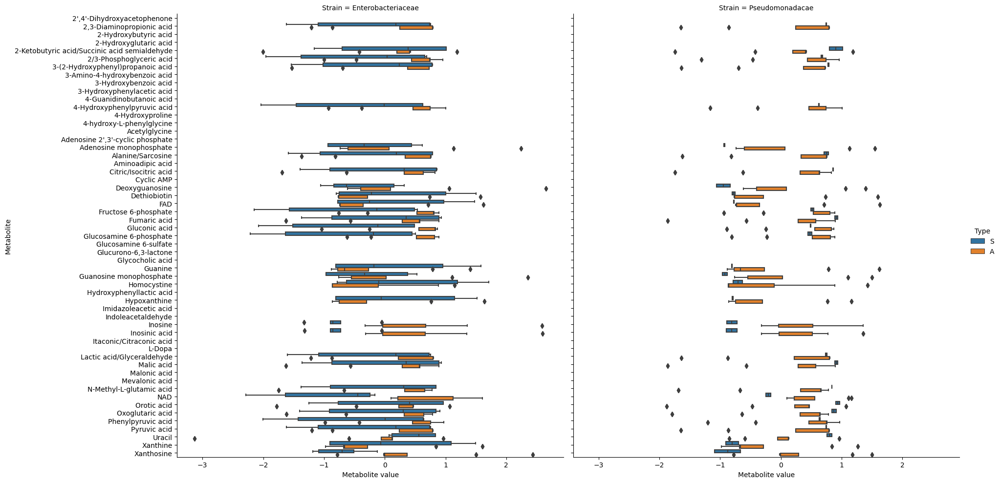

In [123]:
sidx = dfu.Strain == 'Enterobacteriaceae'
# fig, ax = plt.subplots(1, figsize = (6, 18))
xkey = 'Metabolite value'
ykey = 'Metabolite'
# order = [x for x in dfu.loc[sidx,'Metabolite'].unique()]
# sns.boxplot(data = dfu.loc[~sidx,:], x = xkey, y = ykey, hue = 'Type', ax = ax)#, order = order)
sns.catplot(data = dfu, x = xkey, y = ykey, hue = 'Type', col = "Strain", kind = 'box', height=10, aspect=1)#, order = order)


mannwhitney = []
for s in dfu.Strain.unique():
    for m in dfu.Metabolite.unique():
        idxS = (dfu.Strain == s) & (dfu.Metabolite == m) & (dfu.Type=='S')
        idxA = (dfu.Strain == s) & (dfu.Metabolite == m) & (dfu.Type=='A')
        
        czsS = dfu.loc[idxS, xkey].values
        czsA = dfu.loc[idxA, xkey].values
        x_arr = []
        y_arr = []
        for x, y in zip(czsS, czsA):
            if np.isfinite(x) and np.isfinite(y):
                x_arr.append(x)
                y_arr.append(y)
        if len(x_arr) and len(y_arr):
            res = sp.stats.mannwhitneyu(x_arr, y_arr)
            mannwhitney.append([s, m, res.statistic, res.pvalue])
mwu_df2 = pd.DataFrame(mannwhitney, columns = ['Strain', 'Metabolite', 'Test statistic', 'p-value'])
# pairs = []
# for m in order:
#     m_pairs = []
#     for t in ['S', 'A']:
#         m_pairs.append((m, t))
#     pairs.append(m_pairs)
    

        
        
# annot = Annotator(ax, pairs, data=dfu.loc[sidx,:], x=y, y=x, order=order)
# # annot.new_plot(ax, pairs, data=df, x=x, y=y, order=order, hue=hue, hue_order=hue_order)
# annot.configure(test='Mann-Whitney', verbose=2)
# annot.apply_test()
# annot.annotate()

In [110]:
mwu_df2.loc[mwu_df2['p-value'] < 0.01, :]

,Strain,Metabolite,Test statistic,p-value
2,Enterobacteriaceae,2/3-Phosphoglyceric acid,63.0,1.771576e-03
4,Enterobacteriaceae,4-Hydroxyphenylpyruvic acid,63.0,1.771576e-03
11,Enterobacteriaceae,Fructose 6-phosphate,63.0,1.771576e-03
13,Enterobacteriaceae,Gluconic acid,63.0,1.771576e-03
14,Enterobacteriaceae,Glucosamine 6-phosphate,54.0,6.455820e-04
17,Enterobacteriaceae,Homocystine,252.0,4.505109e-03
19,Enterobacteriaceae,Inosine,9.0,1.299313e-06
20,Enterobacteriaceae,Inosinic acid,9.0,1.299313e-06
24,Enterobacteriaceae,NAD,0.0,2.967649e-07
27,Enterobacteriaceae,Phenylpyruvic acid,63.0,1.771576e-03


<Axes: xlabel='Metabolite value', ylabel='Metabolite'>

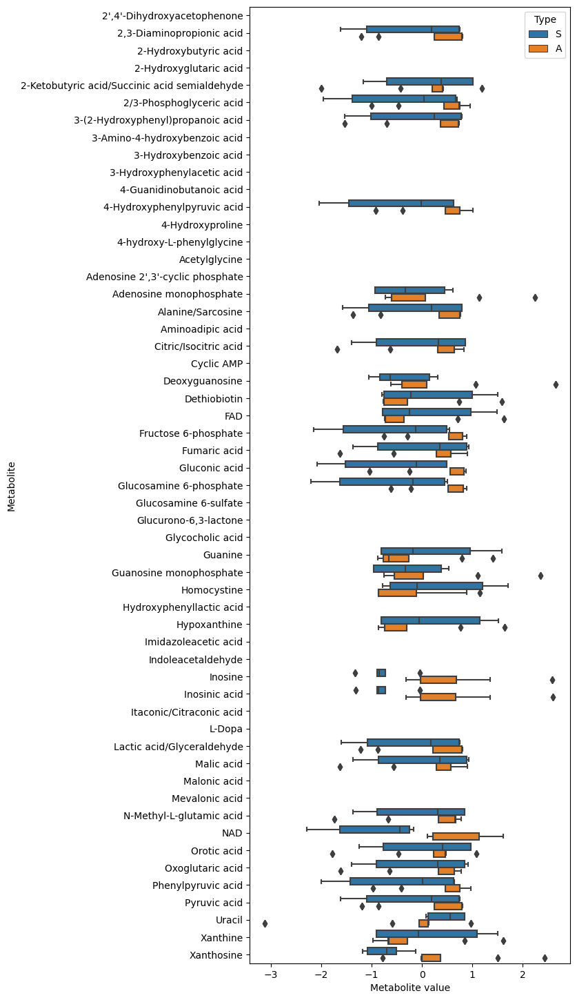

In [53]:
sidx = dfu.Strain == 'Enterobacteriaceae'
fig, ax = plt.subplots(1, figsize = (6,18))
sns.boxplot(data = dfu.loc[sidx,:], x = 'Metabolite value', y = 'Metabolite', hue = 'Type', ax = ax)

In [762]:
# sidx = ttest_df.Strain == 'Enterobacteriaceae'
# ttest_df.loc[idx, 

In [ ]:
# change_idx = ttest_df.Outcome != 0

In [668]:
# sidx = dfu.Strain == 'Enterobacteriaceae'
# metabolites = dfu.Metabolite.unique()
# key = 'Peak_Intensity'
# for s in dfu.Strain.unique():
#     sidx = dfu.Strain == s
#     for m in metabolites:
#         # Normalize both plates together?
#         idx = (dfu.Metabolite == m)&sidx
#         dfu.loc[idx, 'Max-scaled'] = dfu.loc[idx, key]/np.max(dfu.loc[idx, key])
#         # dfu.loc[idx, 'Z-score'] = (dfu.loc[idx, key]-dfu.loc[idx, key].mean())/dfu.loc[idx, key].std()

In [494]:
# s = 'Enterobacteriaceae'
# idx = (dfu.Metabolite == metabolites[0]) & (dfu.Strain == s)
# sns.catplot(data = dfu.loc[idx,:], y = 'Carbon_Source', x = key, jitter = False)

In [757]:
change_idx = ttest_df.Outcome != 0

In [759]:
change_idx.sum(), len(change_idx)

(4282, 21560)

In [750]:
ttest_pval_arr[np.isnan(ttest_pval_arr)] = 1

<Axes: >

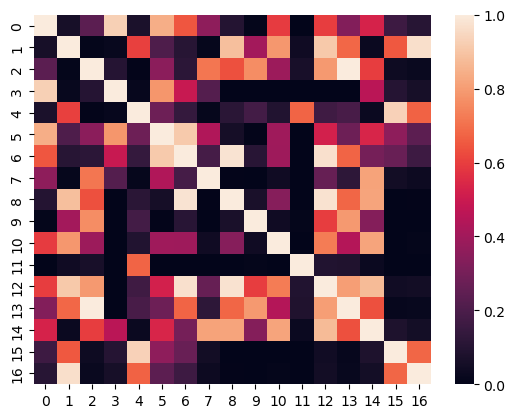

In [495]:
sns.heatmap(ttest_pval_arr)

In [497]:
# fig, ax = plt.subplots(1, figsize = (12,10))
# s = 'Enterobacteriaceae'
# sns.stripplot(data=dfum.loc[dfum.Strain==s,:], y="Metabolite", x="Max-scaled",hue = 'Carbon_Source', ax = ax)#
# plt.grid()
# plt.legend(loc = 3, )

In [680]:
# sns.violinplot(data=dfum.loc[dfu.Strain==s,:], x="Metabolite", y="Z-score", ax = ax)


In [628]:
metabolites = dfu.Metabolite.unique()
key = 'Peak_Intensity'
for m in metabolites:
    # Normalize both plates together?
    idx = dfu.Metabolite == m
    dfu.loc[idx, 'Z-score'] = (dfu.loc[idx, key]-dfu.loc[idx, key].mean())/dfu.loc[idx, key].std()

In [498]:
idx = dfu.Strain == 'Enterobacteriaceae'
# idx = dfu.Strain == 'Pseudomonadacae'
dfu0 = dfu.loc[idx, :]#['Carbon_Source', 'Metabolite','Peak_Intensity']].groupby(['Carbon_Source', 'Metabolite']).mean().reset_index()
# temp = dfu0.loc[~dfu0.isna().any(axis = 1),:]


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))
/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


<Axes: xlabel='Corrected Z-score(log)', ylabel='Metabolite'>

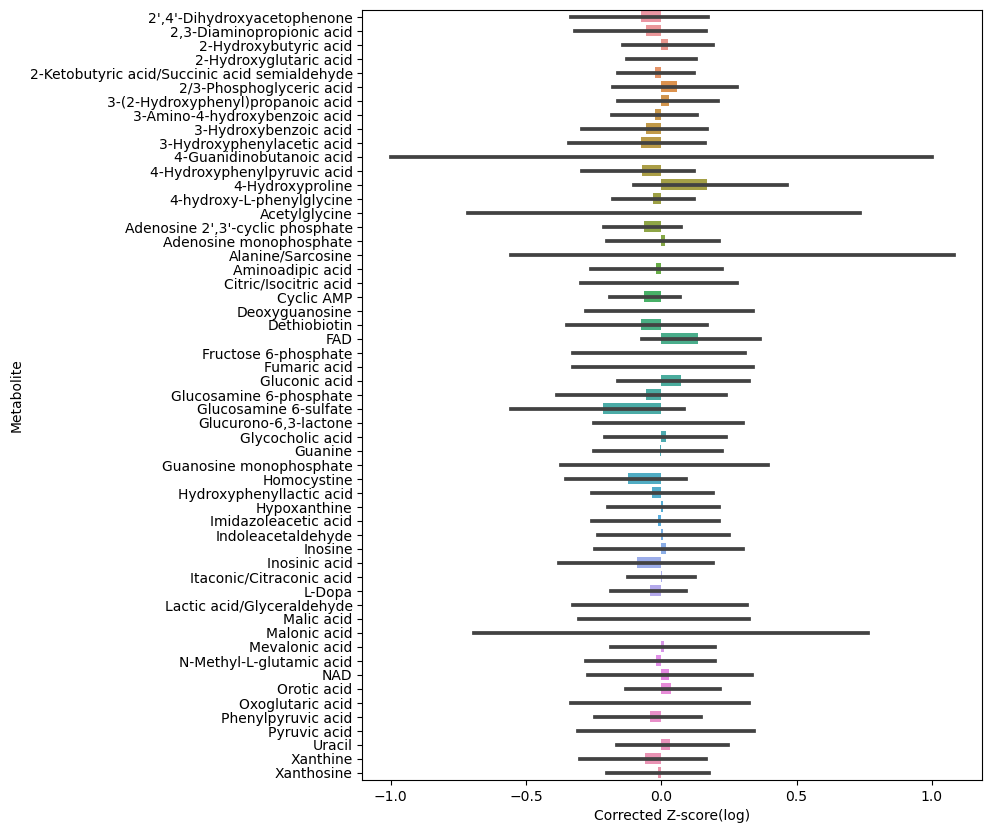

In [501]:
fig, ax = plt.subplots(1, figsize = (8,10))
sns.barplot(data = dfu0, y='Metabolite', x = 'Corrected Z-score(log)')


2',4'-Dihydroxyacetophenone


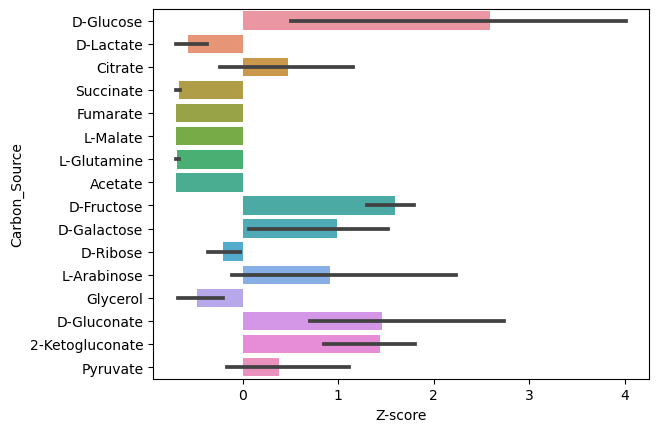

2,3-Diaminopropionic acid


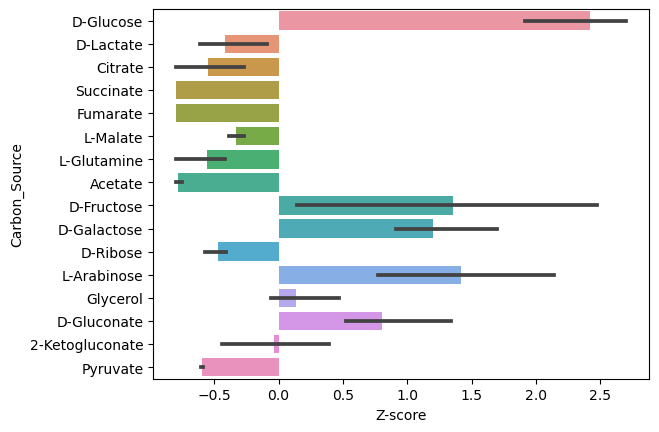

2-Hydroxybutyric acid


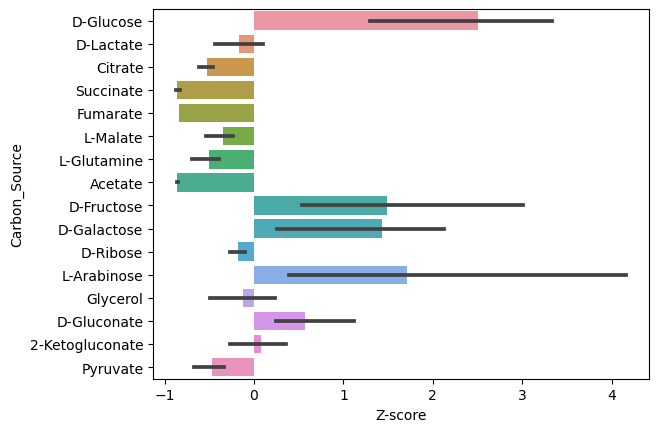

2-Hydroxyglutaric acid


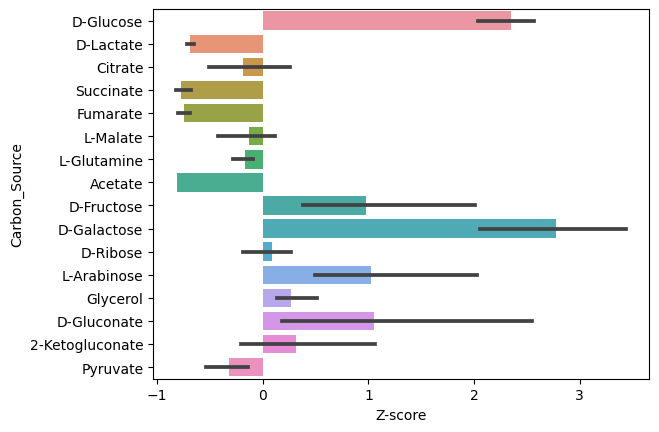

2-Ketobutyric acid/Succinic acid semialdehyde


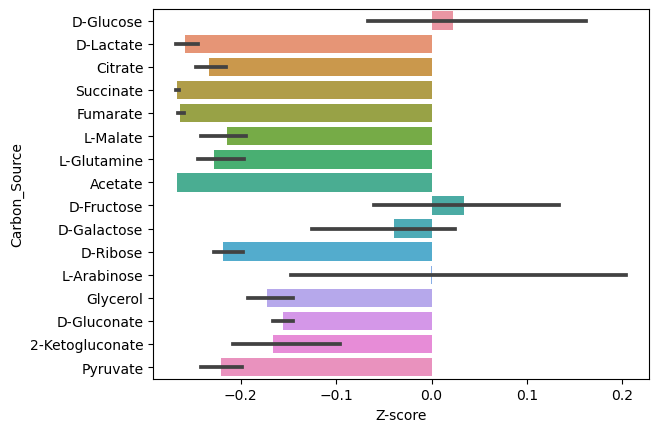

2/3-Phosphoglyceric acid


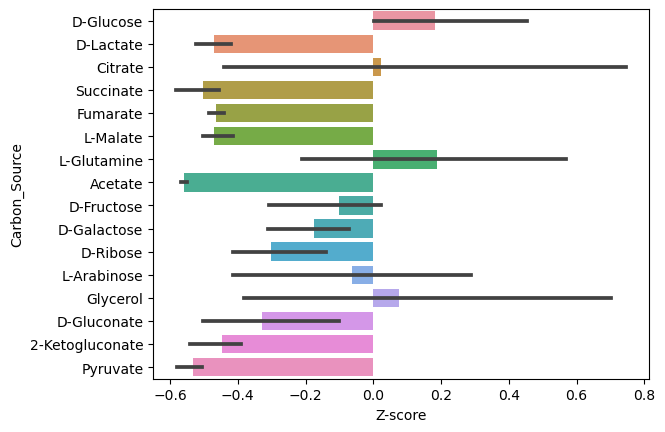

3-(2-Hydroxyphenyl)propanoic acid


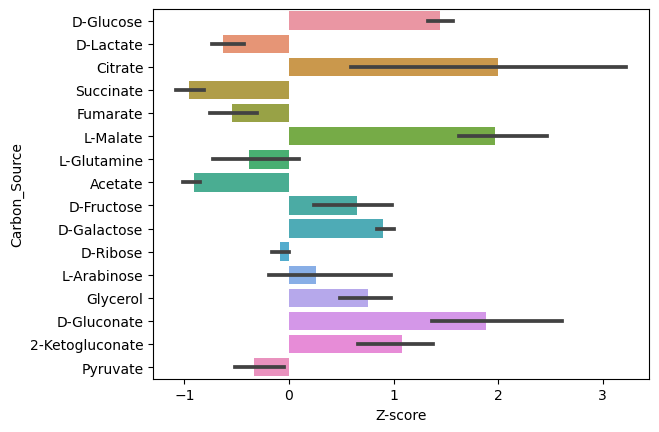

3-Amino-4-hydroxybenzoic acid


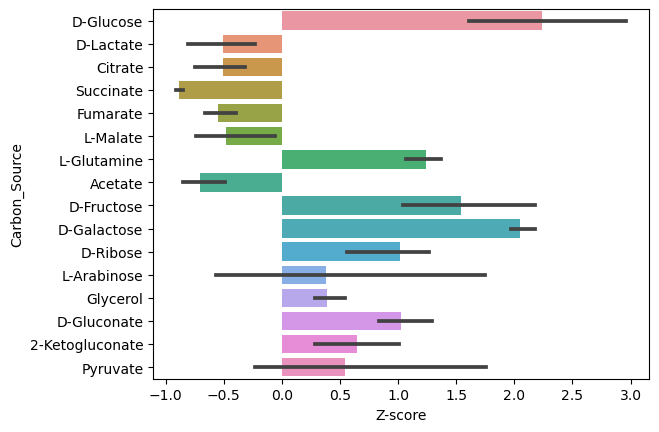

3-Hydroxybenzoic acid


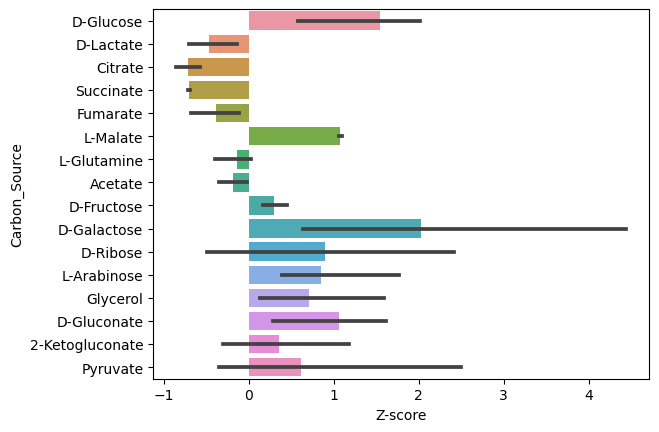

3-Hydroxyphenylacetic acid


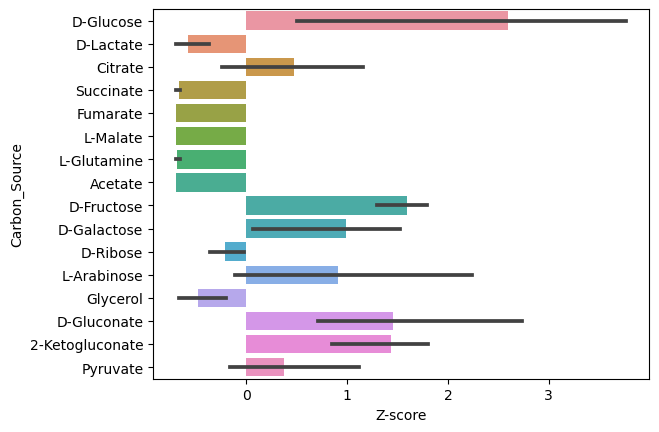

4-Guanidinobutanoic acid


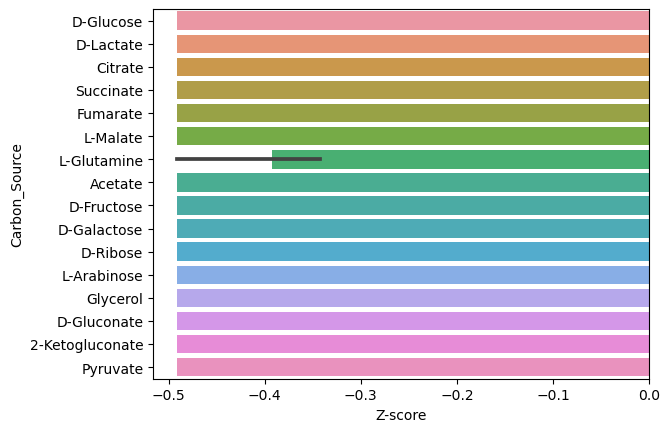

4-Hydroxyphenylpyruvic acid


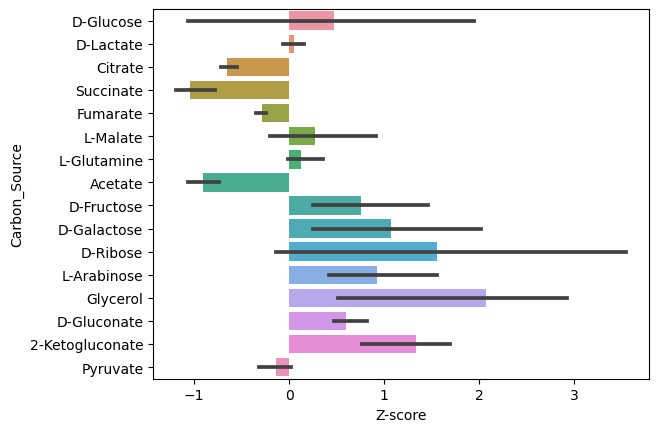

4-Hydroxyproline


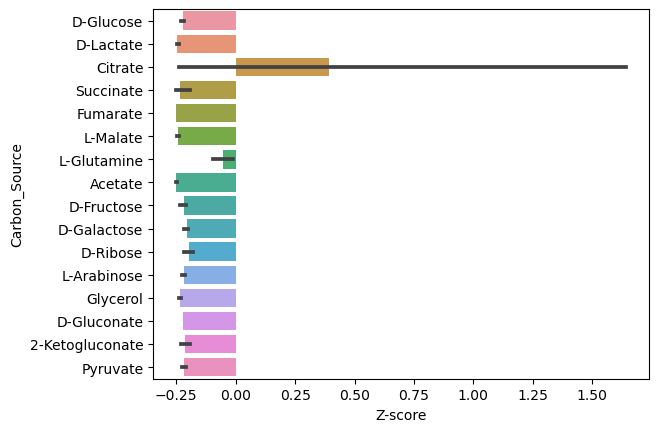

4-hydroxy-L-phenylglycine


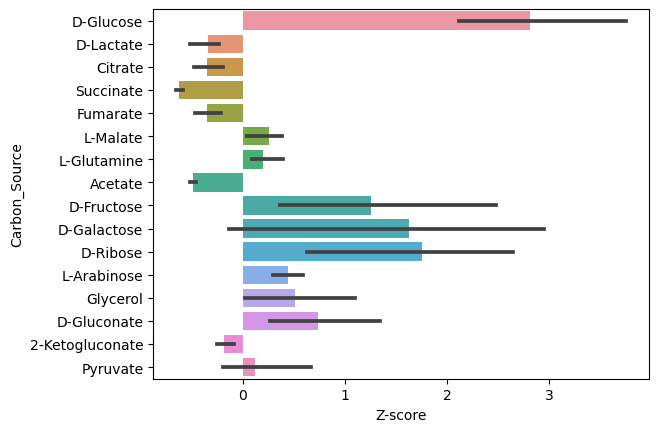

Acetylglycine


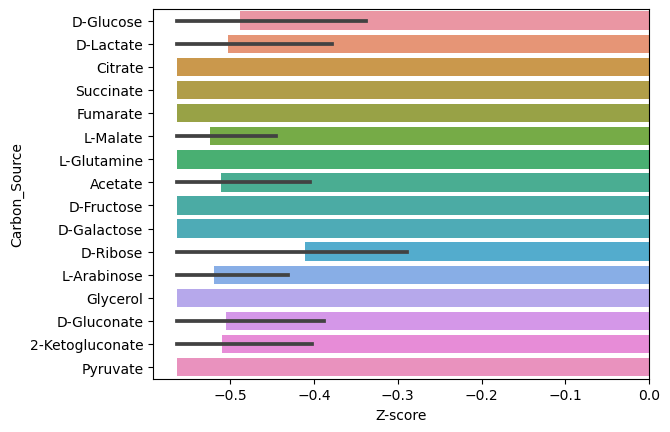

Adenosine 2',3'-cyclic phosphate


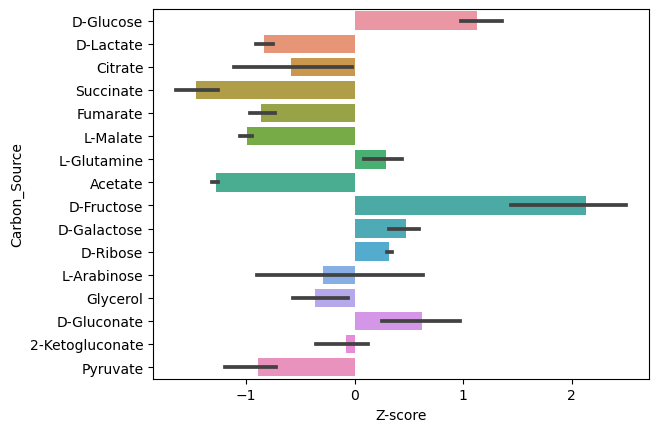

Adenosine monophosphate


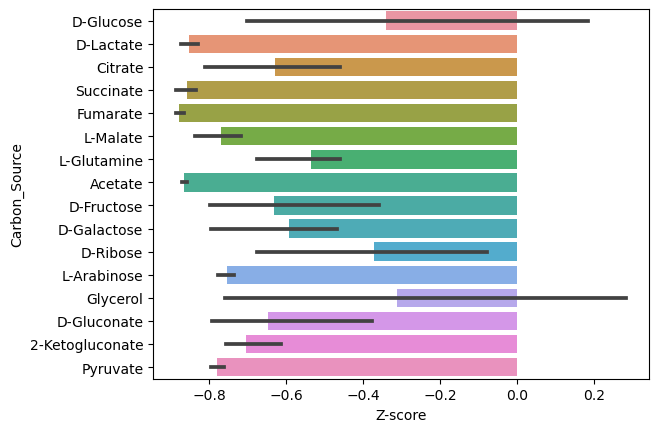

Alanine/Sarcosine


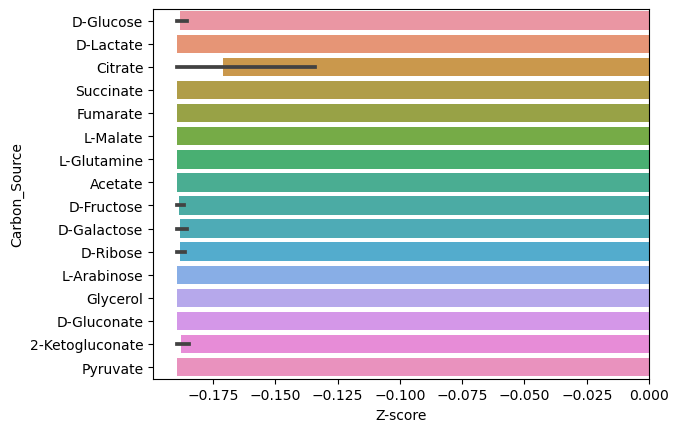

Aminoadipic acid


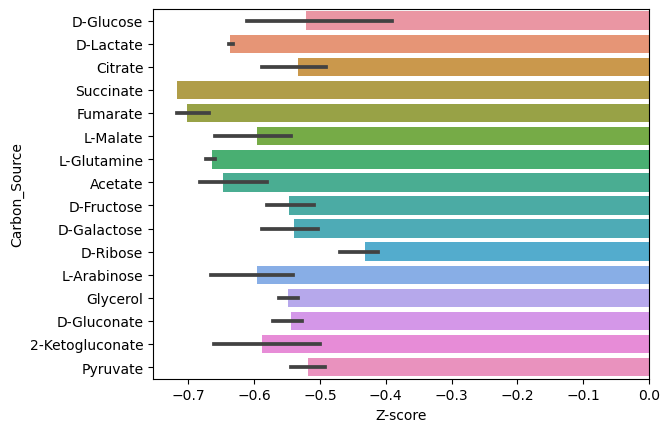

Citric/Isocitric acid


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))
/Users/ssulheim/anaconda3/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1556: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


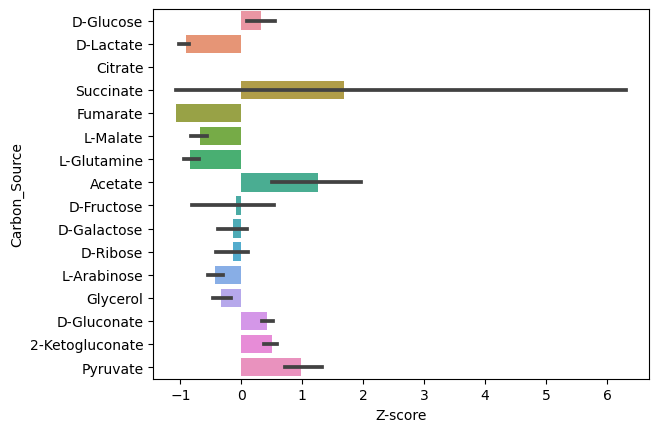

Cyclic AMP


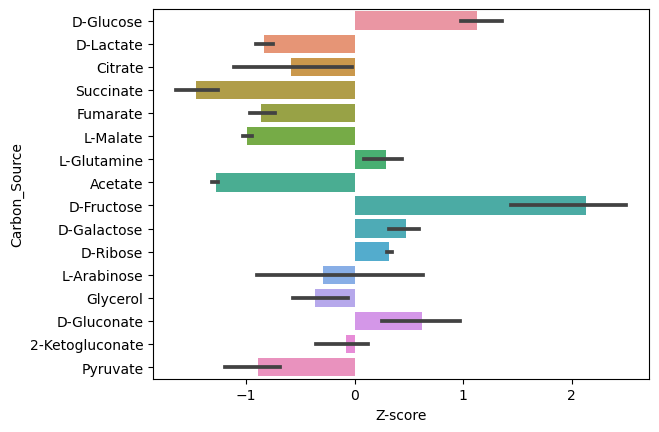

Deoxyguanosine


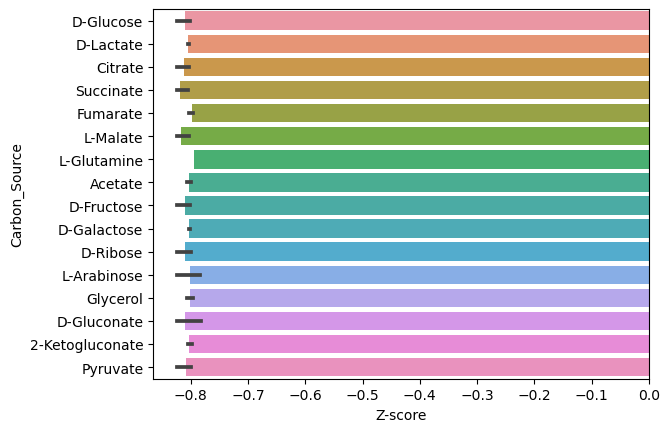

Dethiobiotin


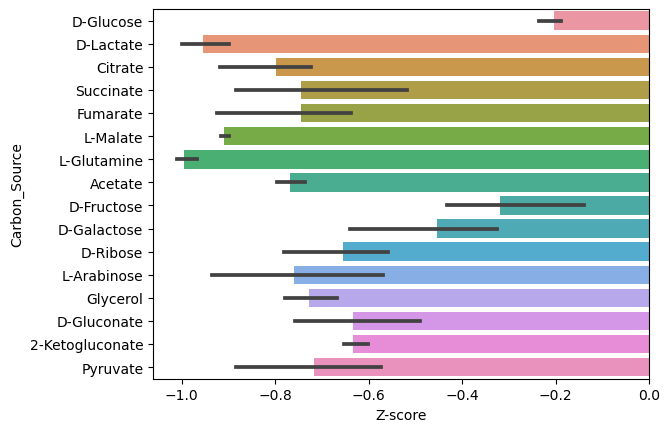

FAD


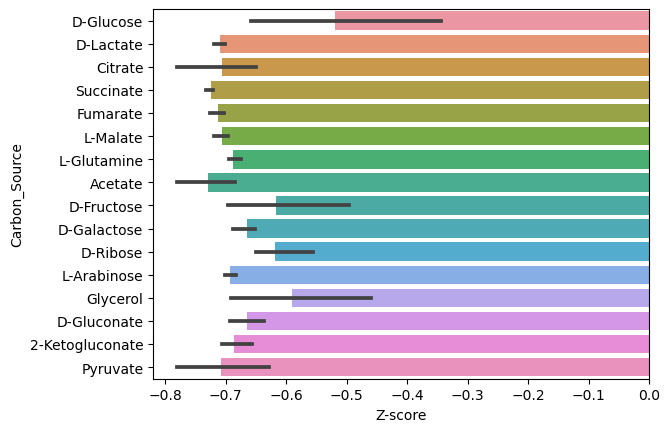

Fructose 6-phosphate


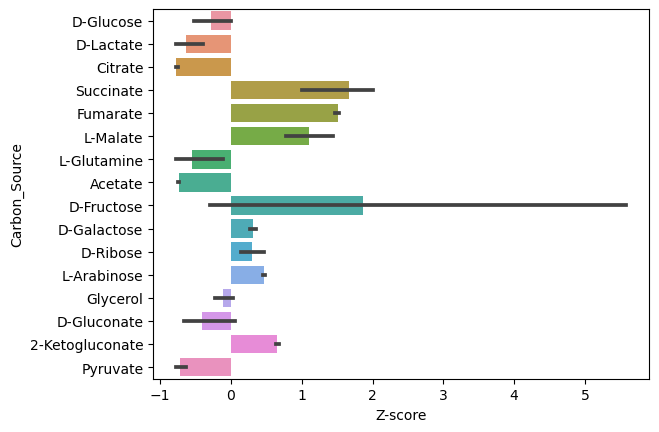

Fumaric acid


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))
/Users/ssulheim/anaconda3/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1556: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


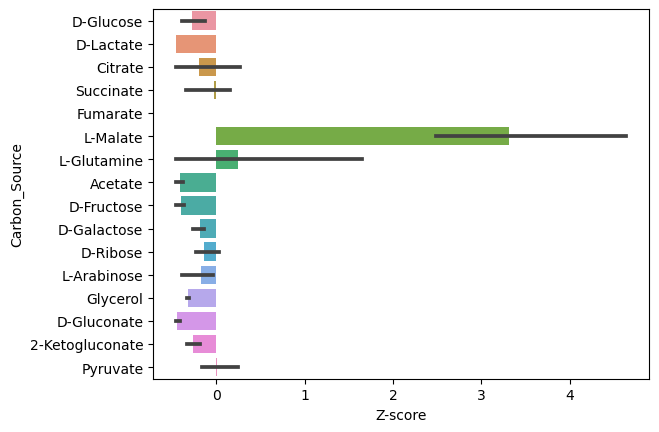

Gluconic acid


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))
/Users/ssulheim/anaconda3/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1556: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


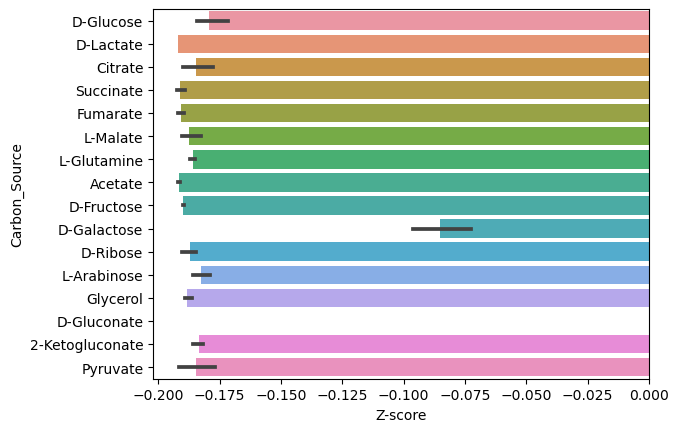

Glucosamine 6-phosphate


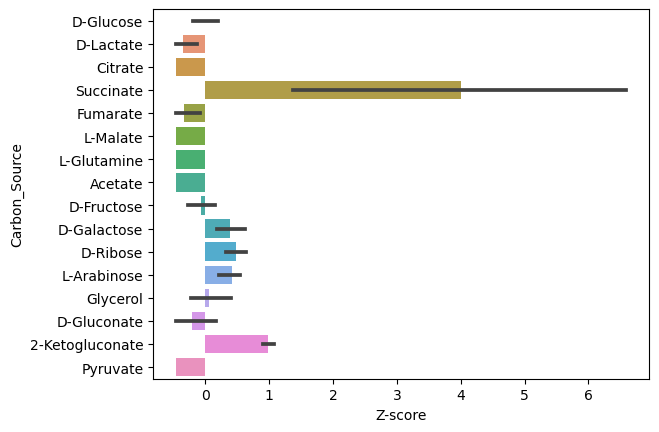

Glucosamine 6-sulfate


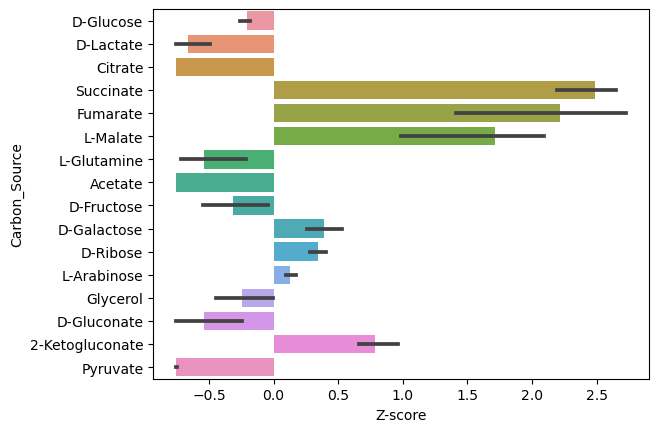

Glucurono-6,3-lactone


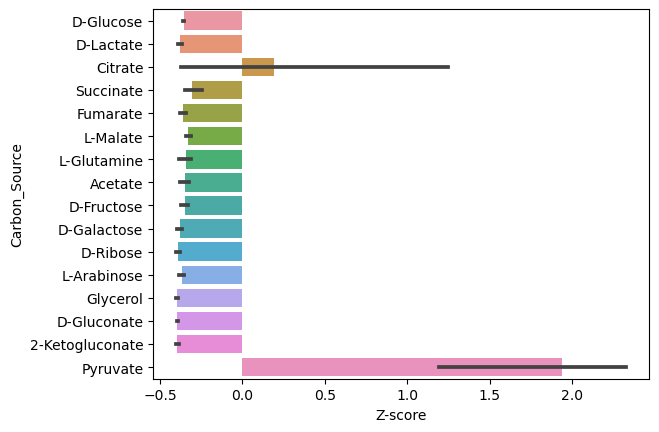

Glycocholic acid


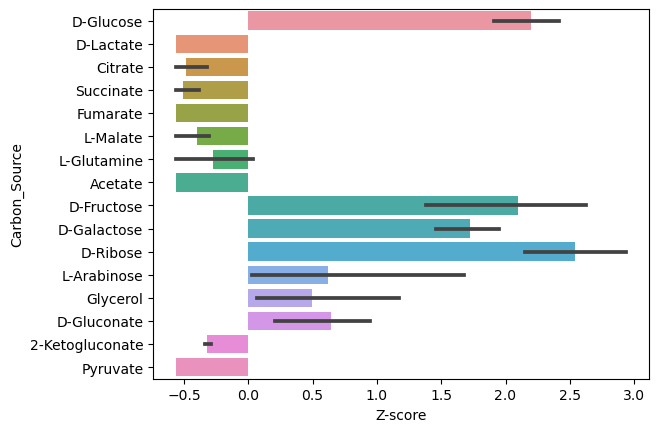

Guanine


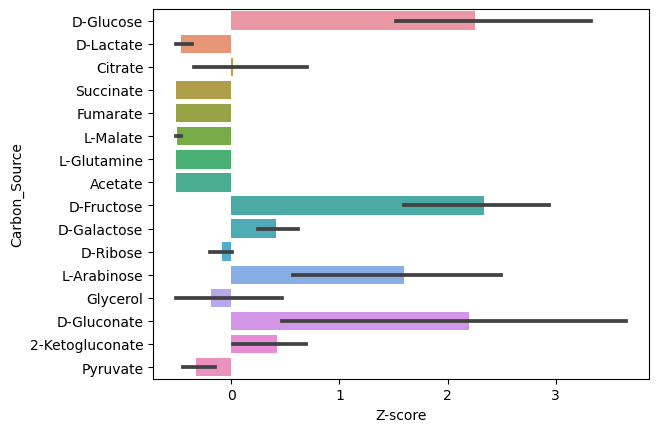

Guanosine monophosphate


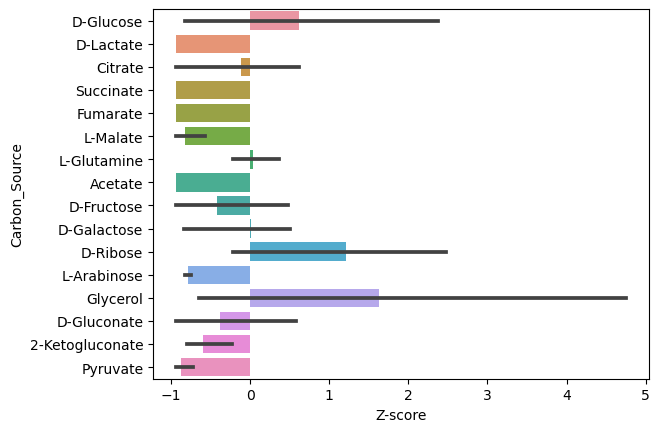

Homocystine


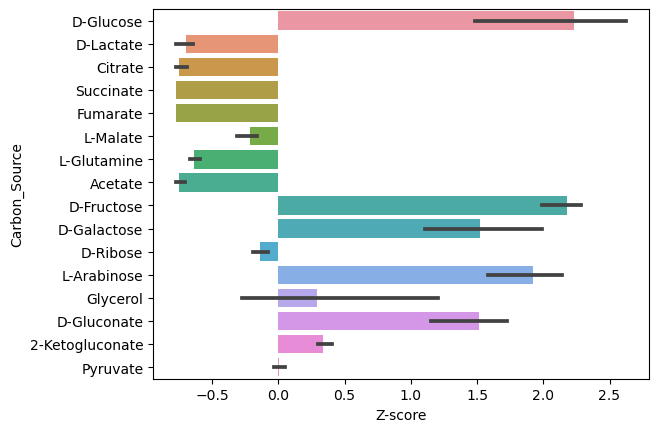

Hydroxyphenyllactic acid


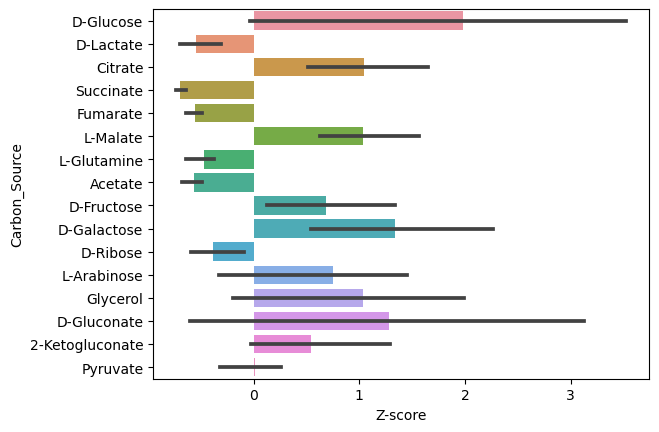

Hypoxanthine


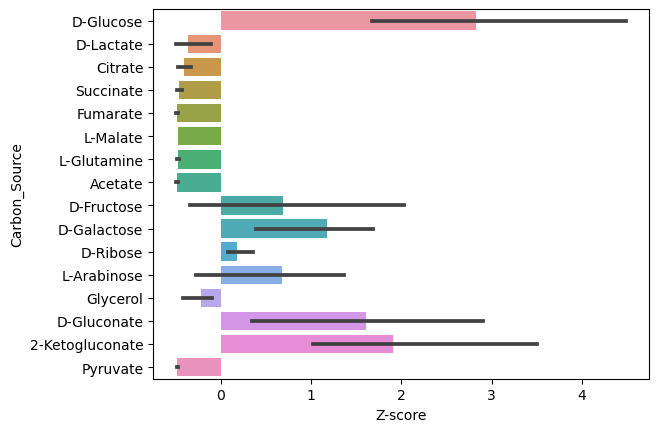

Imidazoleacetic acid


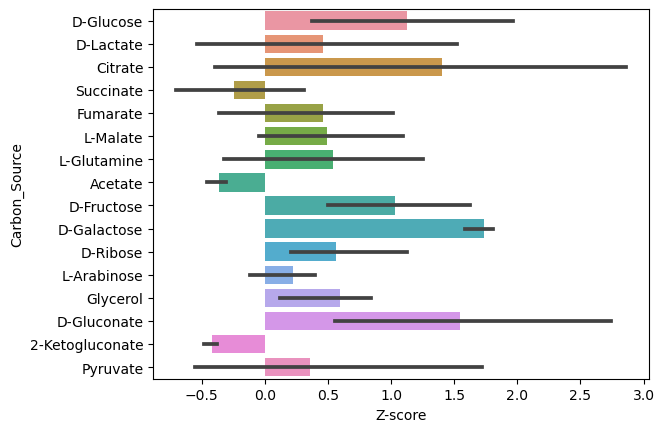

Indoleacetaldehyde


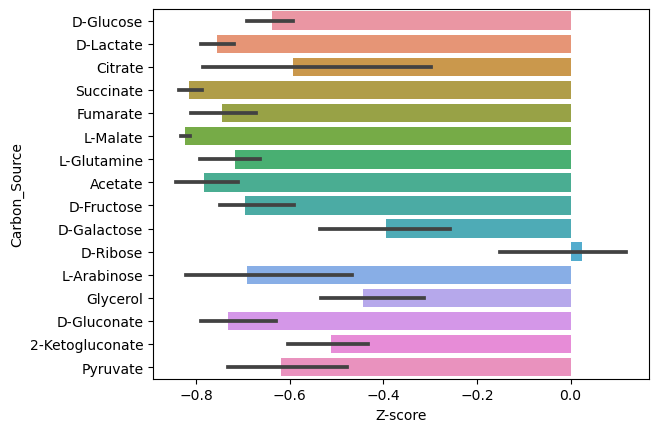

Inosine


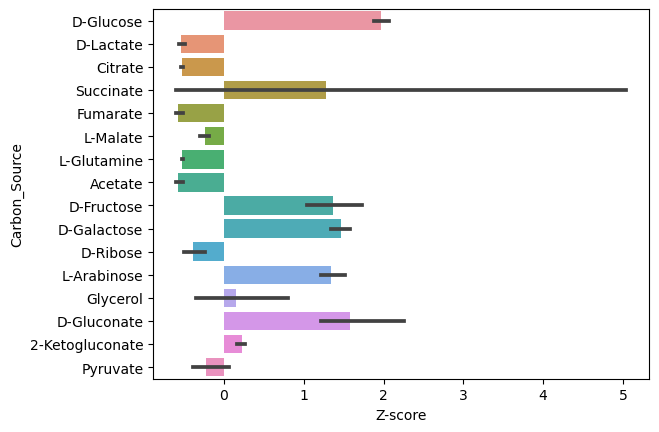

Inosinic acid


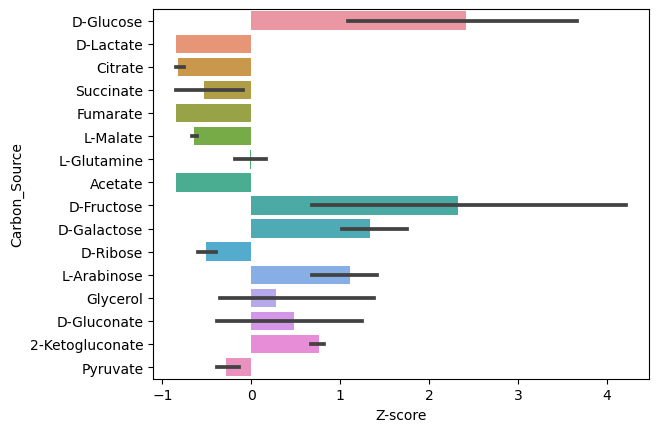

Itaconic/Citraconic acid


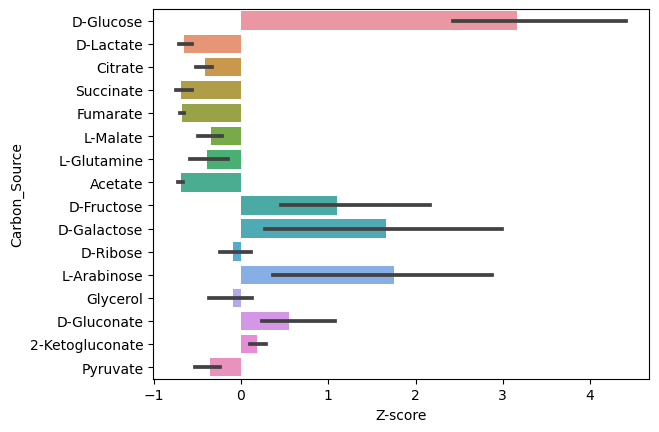

L-Dopa


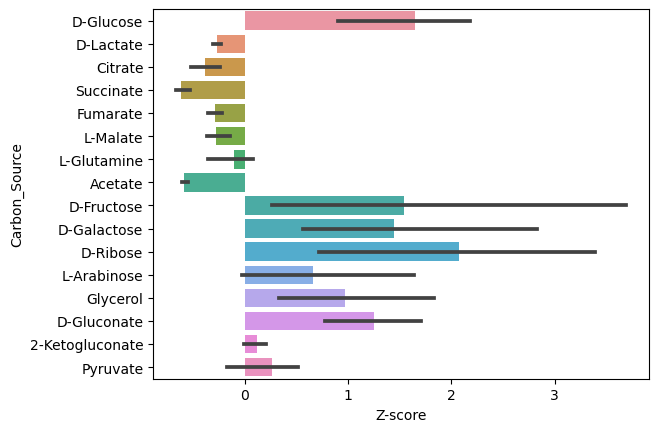

Lactic acid/Glyceraldehyde


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))
/Users/ssulheim/anaconda3/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1556: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


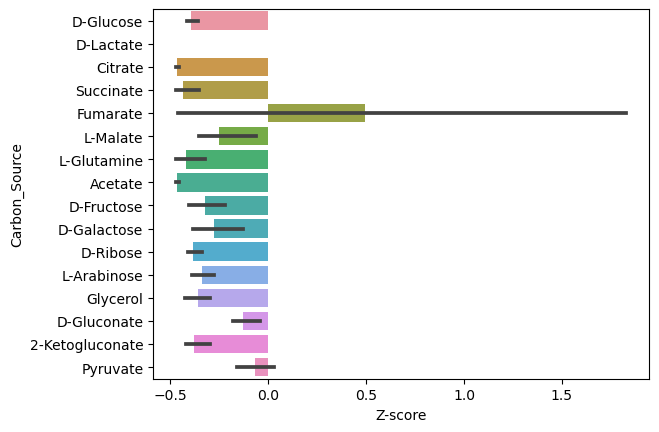

Malic acid


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))
/Users/ssulheim/anaconda3/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1556: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


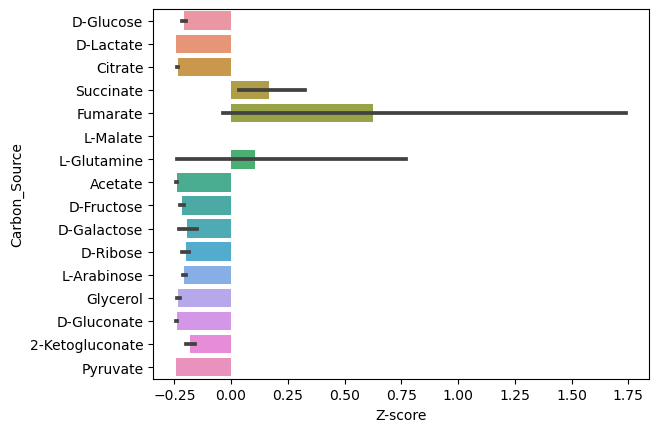

Malonic acid


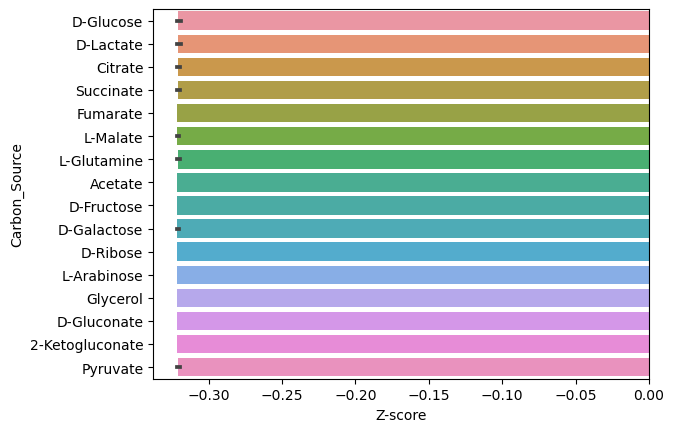

Mevalonic acid


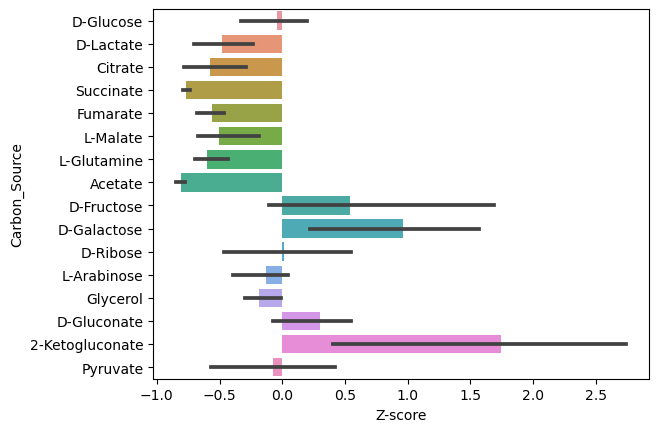

N-Methyl-L-glutamic acid


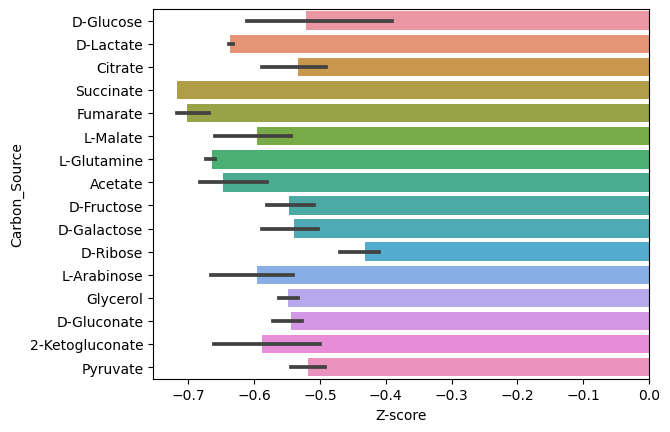

NAD


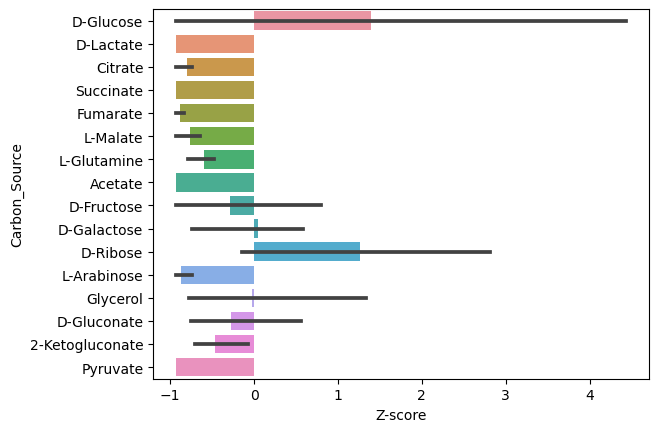

Orotic acid


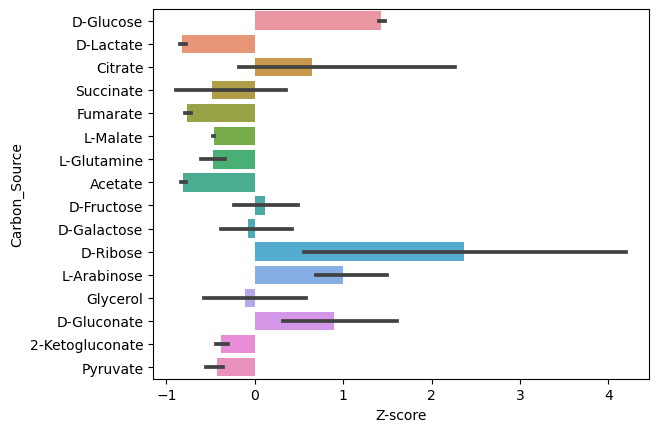

Oxoglutaric acid


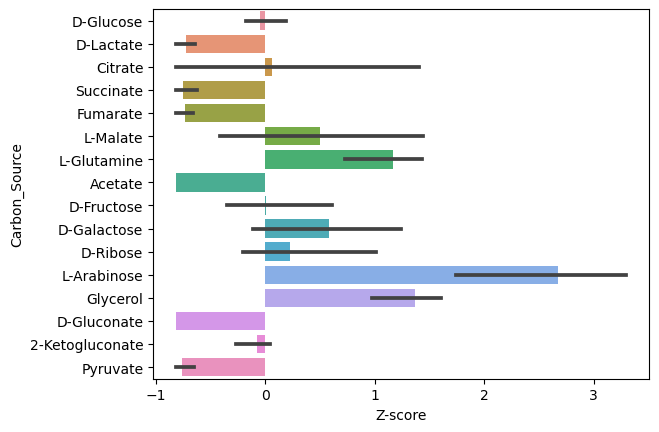

Phenylpyruvic acid


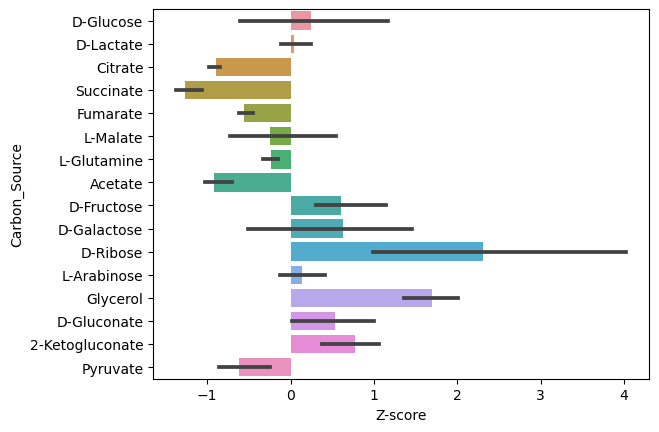

Pyruvic acid


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))
/Users/ssulheim/anaconda3/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1556: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


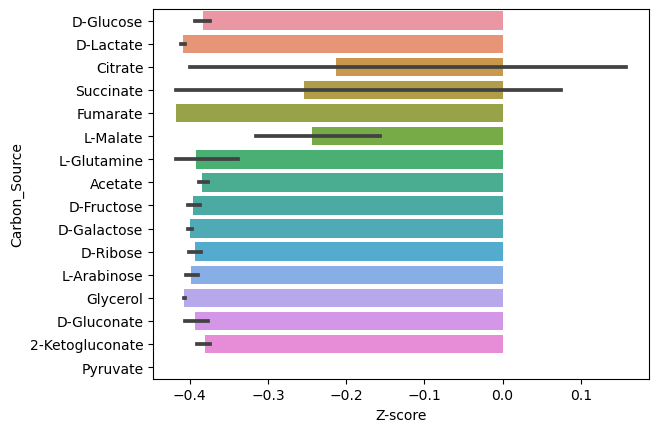

Uracil


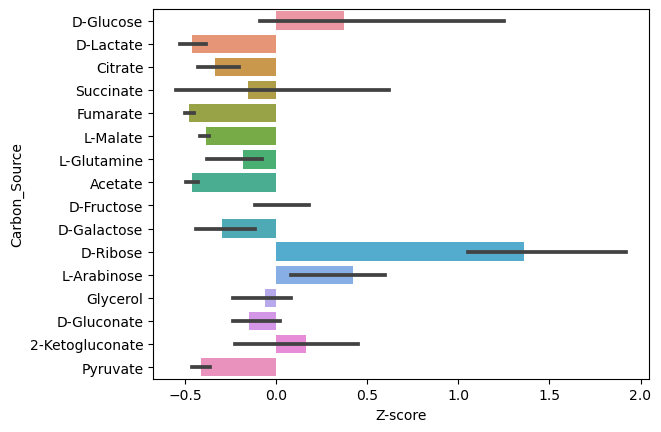

Xanthine


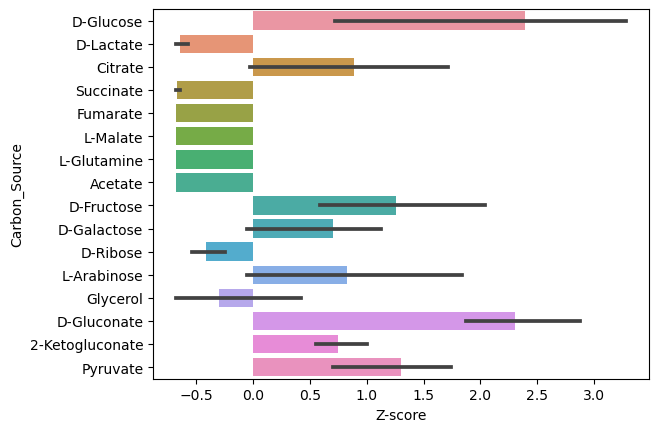

Xanthosine


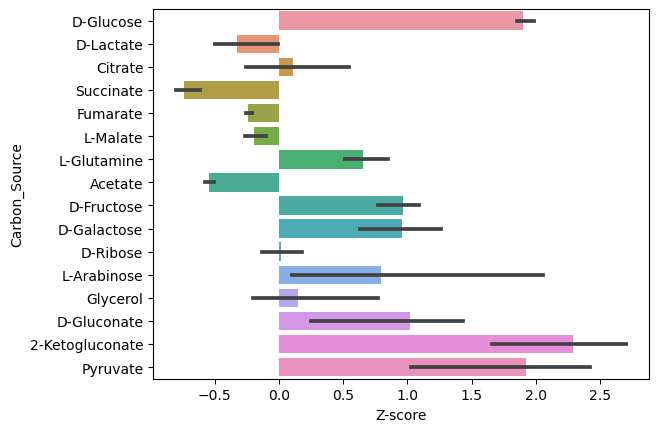

In [502]:
m = metabolites[0]
for m in metabolites:
    idx = dfu0.Metabolite == m
    print(m)
    sns.barplot(dfu0.loc[idx,:], x = 'Z-score', y = 'Carbon_Source')
    plt.show()

In [590]:
result = dfu0.pivot(index=['Metabolite'], columns='Carbon_Source', values='Peak_Intensity').T

In [554]:
# result = result.loc[:,~result.isna().any(axis=0)] 
mask = result.isna()
# result.fillna(0, inplace=True)
result[result == -np.inf] = np.nan

In [555]:
resultN = (result-np.nanmean(result, axis = 0))/np.nanstd(result, axis = 0)

In [556]:
resultN

Metabolite,"2',4'-Dihydroxyacetophenone","2,3-Diaminopropionic acid",2-Hydroxybutyric acid,2-Hydroxyglutaric acid,2-Ketobutyric acid/Succinic acid semialdehyde,2/3-Phosphoglyceric acid,3-(2-Hydroxyphenyl)propanoic acid,3-Amino-4-hydroxybenzoic acid,3-Hydroxybenzoic acid,3-Hydroxyphenylacetic acid,...,Mevalonic acid,N-Methyl-L-glutamic acid,NAD,Orotic acid,Oxoglutaric acid,Phenylpyruvic acid,Pyruvic acid,Uracil,Xanthine,Xanthosine
Carbon_Source,,,,,,,,,,,,,,,,,,,,,
2-Ketogluconate,1.084062,-0.163698,-0.101302,0.003737,-0.004557,-0.779796,0.639184,0.186047,-0.095512,1.084062,...,2.738917,-0.062754,-0.129528,-0.540880,-0.197217,0.683780,-0.249547,0.504649,0.369533,1.950084
Acetate,-0.990420,-0.940725,-1.027411,-1.080151,-0.971273,-1.213305,-1.345366,-1.206004,-0.782632,-0.990420,...,-1.108929,-0.886832,-0.777513,-1.031678,-0.986320,-1.143785,-0.302627,-0.858755,-0.982009,-1.215820
Citrate,0.149919,-0.700911,-0.697773,-0.477456,-0.650894,1.052611,1.548147,-0.998580,-1.451960,0.149919,...,-0.756727,0.676112,-0.592110,0.610038,-0.057574,-1.123126,2.327684,-0.585401,0.503953,-0.489997
D-Fructose,1.234588,1.278289,1.290932,0.634215,1.915383,0.566786,0.201599,1.107124,-0.172040,1.234588,...,0.922546,0.484829,0.131195,0.014315,-0.116901,0.506558,-0.477127,0.136894,0.853240,0.466099
D-Galactose,0.645832,1.112152,1.234724,2.360135,1.213949,0.278232,0.452703,1.629736,2.034583,0.645832,...,1.553934,0.602486,0.583702,-0.207100,0.491059,0.527717,-0.551393,-0.500039,0.333594,0.463772
D-Gluconate,1.104784,0.701518,0.382217,0.708699,0.093186,-0.322311,1.441059,0.578647,0.808091,1.104784,...,0.562584,0.537865,0.133047,0.888875,-0.986320,0.428901,-0.452884,-0.175964,1.850044,0.527356
D-Glucose,2.207946,2.373666,2.298829,1.953064,1.800165,1.674947,0.994824,1.826229,1.415389,2.207946,...,0.048943,0.838811,2.464078,1.494866,-0.175437,0.113034,-0.294973,0.956022,1.930357,1.514813
D-Lactate,-0.868249,-0.558648,-0.343160,-0.963015,-0.896196,-0.875436,-1.072803,-1.001156,-1.132036,-0.868249,...,-0.610920,-0.723353,-0.777513,-1.043658,-0.889909,-0.106834,-0.677901,-0.861352,-0.948581,-0.978988
D-Ribose,-0.511766,-0.614242,-0.353029,-0.221432,-0.506457,-0.217402,-0.523914,0.565341,0.597469,-0.511766,...,0.129344,2.077376,2.271682,2.549710,0.121042,2.343833,-0.456538,3.106146,-0.732333,-0.591316


In [ ]:
sns.clustermap(resultN.T,cmap='RdBu', vmin = -2, vmax = 2)#, mask = mask.T)

In [525]:
dfu.Carbon_Source.unique()

array(['D-Glucose', 'D-Lactate', 'Citrate', '2-Oxoglutarate', 'Succinate',
       'Fumarate', 'L-Malate', 'L-Glutamine', 'Acetate', 'D-Fructose',
       'D-Galactose', 'D-Ribose', 'L-Arabinose', 'Glycerol',
       'D-Gluconate', '2-Ketogluconate', 'Pyruvate'], dtype=object)

# Compare variations in shadow price versus variation in leakage rates
## ToDo: Mantel test https://en.wikipedia.org/wiki/Mantel_test

In [526]:
mets = [m for m in model.metabolites if m.compartment == 'c']
matches = []
for name in dfu.Metabolite.unique():
    name_at = name.replace("ic acid", 'ate')
    scores = []
    suggestions = []
    for m in mets:
        score1 = fuzz.ratio(name.lower(),m.name.lower())
        score2 = fuzz.ratio(name_at.lower(),m.name.lower())
        score = max(score1, score2)
        # pscore = fuzz.partial_ratio(name.lower(),m.name.lower())
        if score > 80:
            scores.append(score)
            suggestions.append(m)
            # print(name, mname, score, pscore)
        # elif pscore > 90 and score > 70:
        #     print(name, mname, score, pscore)
    if len(scores):
        # print(scores, suggestions, np.argmax(scores))
        match = suggestions[np.argmax(scores)]
        # print(name, match.name, match.id, scores[np.argmax(scores)])
        matches.append([name, match.name, match.id.rstrip('_c'), scores[np.argmax(scores)]])
    else:
        matches.append([name, None, None, None])
    #     print(name, ' No match')
dfmatch = pd.DataFrame(matches, columns = ['Untargeted MS name', 'Metabolite name', 'Metabolite ID', 'Score'])          

In [527]:
fnm = folder / 'ms_name_to_id.csv'
dfmatch.to_csv(fnm)

In [528]:
fnmc = folder / 'ms_name_to_id_curated.csv'
dfmc = pd.read_csv(fnmc, index_col = 0)

In [529]:
translate_dict = dfmc[['Untargeted MS name', 'Metabolite ID']].set_index('Untargeted MS name').to_dict()['Metabolite ID']

# Now try to predict

In [530]:
resultN

Metabolite,"2',4'-Dihydroxyacetophenone","2,3-Diaminopropionic acid",2-Hydroxybutyric acid,2-Hydroxyglutaric acid,2-Ketobutyric acid/Succinic acid semialdehyde,2/3-Phosphoglyceric acid,3-(2-Hydroxyphenyl)propanoic acid,3-Amino-4-hydroxybenzoic acid,3-Hydroxybenzoic acid,3-Hydroxyphenylacetic acid,...,Mevalonic acid,N-Methyl-L-glutamic acid,NAD,Orotic acid,Oxoglutaric acid,Phenylpyruvic acid,Pyruvic acid,Uracil,Xanthine,Xanthosine
Carbon_Source,,,,,,,,,,,,,,,,,,,,,
2-Ketogluconate,0.777026,0.213653,0.422005,0.466917,0.520545,-0.664645,0.729209,0.481948,0.240732,0.777026,...,1.694019,0.102866,0.104902,-0.146369,0.201679,0.755766,0.084276,0.863745,0.749420,1.264449
Acetate,NaN,-2.639961,-2.003680,-2.362717,-1.974295,-1.630393,-1.855653,-1.352748,-0.454331,NaN,...,-2.114373,-0.803865,NaN,-1.808186,NaN,-1.214920,-0.018195,-1.367994,-1.644358,-1.417786
Citrate,0.424219,-0.633157,-0.195415,0.077789,-0.127000,1.057006,1.120174,-0.792694,-2.056328,0.424219,...,-0.666514,0.609083,-0.931151,0.832053,0.321611,-1.167126,1.894840,-0.464693,0.780001,-0.101858
D-Fructose,0.818326,0.991392,0.982436,0.773510,1.174540,0.748524,0.478853,0.940480,0.179843,0.818326,...,1.010367,0.493938,0.384880,0.454306,0.273024,0.648974,-0.447422,0.561274,0.848098,0.633199
D-Galactose,0.637113,0.933379,0.967370,1.241761,1.007519,0.532885,0.629181,1.132717,1.295782,0.637113,...,1.297544,0.565833,0.719465,0.260123,0.663279,0.662159,-0.699763,-0.284076,0.740728,0.631878
D-Gluconate,0.782886,0.767234,0.677742,0.802030,0.577807,-0.036788,1.080522,0.702151,0.798114,0.782886,...,0.806315,0.526786,0.386566,0.965849,NaN,0.599499,-0.376453,0.221534,0.988047,0.667441
D-Glucose,1.032279,1.290995,1.204321,1.156944,1.150084,1.381811,0.898536,1.196789,1.069082,1.032279,...,0.430564,0.700334,1.437871,1.201969,0.221719,0.378158,-0.002800,1.151235,0.997068,1.112447
D-Lactate,-0.892739,-0.302691,0.239031,-0.958930,-0.916955,-0.833571,-0.960077,-0.798102,-1.046854,-0.892739,...,-0.372032,-0.573563,NaN,-1.934429,-1.345712,0.200568,-1.345629,-1.381093,-0.436931,-0.807973
D-Ribose,-0.087611,-0.415201,0.230281,0.311968,0.088813,0.078323,-0.118312,0.695395,0.688570,-0.087611,...,0.498337,1.253881,1.387211,1.505596,0.451083,1.489686,-0.386854,1.979469,0.205266,-0.216632


In [531]:
measured_mets = []
measured_metnames = []
for key, value in translate_dict.items():
    m_id = f'{value}_c'
    try:
        m = model.metabolites.get_by_id(m_id)
    except KeyError:
        pass
    else:
        measured_mets.append(m_id)
        measured_metnames.append(key)
    

In [532]:
cs_to_exchange = {'D-Glucose': 'EX_glc__D_e',
                'D-Lactate': 'EX_lac__L_e',
                'Citrate': 'EX_cit_e',
                '2-Oxoglutarate': 'EX_akg_e',
                'Succinate': 'EX_succ_e',
                'Fumarate': 'EX_fum_e',
                'L-Malate': 'EX_mal__L_e',
                'L-Glutamine': 'EX_gln__L_e',
                'Acetate': 'EX_ac_e',
                'D-Galactose': 'EX_gal_e',
                'D-Ribose': 'EX_rib__D_e',
                'L-Arabinose': 'EX_arab__L_e',
                'Glycerol': 'EX_glyc_e',
                'D-Gluconate': 'EX_glcn_e',
                '2-Ketogluconate': 'EX_25dkglcn_e',
                'Pyruvate': 'EX_pyr_e'}

In [575]:
shadow_price_dict = OrderedDict()
growth_dict = OrderedDict()
model.reactions.EX_glc__D_e.lower_bound = 0
for cs, ex_id in cs_to_exchange.items():    
    with model:
        try:
            r = model.reactions.get_by_id(ex_id)
        except KeyError:
            print(f'{ex_id} not in model')
            continue
        r.lower_bound = -200
        solution = model.optimize()
        if solution.objective_value:
            # print(model.summary())

            growth_dict[cs] = solution.objective_value
            shadow_price_dict[cs] = -solution.shadow_prices[measured_mets]
        

EX_25dkglcn_e not in model


In [576]:
dfsp = pd.DataFrame(shadow_price_dict).T

In [577]:
dfsp[dfsp < 0] = np.nan

In [578]:
dfsp

,23dappa_c,2obut_c,3pg_c,dhpppn_c,34hpp_c,amp_c,ala__L_c,cit_c,dgsn_c,dtbt_c,...,mal__D_c,acglu_c,nad_c,orot_c,akg_c,phpyr_c,pyr_c,ura_c,xan_c,xtsn_c
D-Glucose,NaN,0.037827,0.005221,NaN,0.045595,0.208744,0.004948,0.013604,0.197182,1.589743,...,0.000810,0.042004,0.334048,0.019141,0.015200,0.043667,0.001065,0.053105,0.141470,0.149058
D-Lactate,0.010858,0.049870,0.024066,NaN,0.103860,0.219219,0.017068,0.030494,0.214439,1.196114,...,0.013973,0.054665,0.387144,0.028756,0.027618,0.105052,0.011482,0.050627,0.123955,0.178435
Citrate,0.008228,0.034575,0.021360,NaN,0.096817,0.231059,0.012249,0.010360,0.227632,1.443275,...,0.009781,0.036991,0.400707,0.017421,0.011813,0.096158,0.009140,0.047597,0.132299,0.181134
2-Oxoglutarate,0.014319,0.048400,0.026424,NaN,0.111096,0.215246,0.020873,0.030844,0.211552,1.133856,...,0.017952,0.056122,0.382713,0.026530,0.027077,0.112847,0.014873,0.045735,0.117489,0.176253
Succinate,0.007700,0.038547,0.020323,NaN,0.093062,0.220256,0.013117,0.017644,0.215973,1.300525,...,0.010687,0.042345,0.379419,0.018099,0.016444,0.093870,0.008459,0.043214,0.125631,0.174381
Fumarate,0.009249,0.039897,0.021536,NaN,0.096350,0.218456,0.014669,0.020371,0.214661,1.260514,...,0.012461,0.045231,0.378895,0.019521,0.018841,0.097430,0.009963,0.043414,0.123429,0.174133
L-Malate,0.005149,0.036340,0.018332,NaN,0.087686,0.223348,0.010561,0.013154,0.217975,1.366453,...,0.007765,0.037604,0.380489,0.015761,0.012497,0.088044,0.005981,0.042908,0.129054,0.174605
L-Glutamine,0.012521,0.024416,0.027818,NaN,0.122119,0.181398,NaN,0.028041,0.200621,1.342493,...,0.017269,0.032382,0.353465,NaN,0.025799,0.123745,0.013901,0.025369,0.090478,0.154988
Acetate,0.017486,0.044434,0.028339,NaN,0.115242,0.225049,0.022091,0.030246,0.228584,1.146989,...,0.021058,0.053629,0.397803,0.026381,0.028564,0.116904,0.018060,0.046913,0.127722,0.188466
D-Galactose,0.021973,0.060615,0.027819,0.039794,0.109280,0.197131,0.029025,0.048685,0.195070,0.964432,...,0.027028,0.075490,0.356770,0.038696,0.043043,0.112581,0.022348,0.053150,0.112449,0.164428


In [579]:
rel_std = dfsp.std()/dfsp.mean()
std_log = np.log10(dfsp).std()#/np.log10(dfsp).mean()

In [582]:
log_sp = np.log10(dfsp)

In [583]:
dfspN = (dfsp-dfsp.mean())/dfsp.std()

In [584]:
log_spN = (log_sp-log_sp.mean())/log_sp.std()

In [585]:
res_dict = resultN.T.to_dict()
sp_dict = dfspN.T.to_dict()
spl_dict = log_spN.T.to_dict()

In [586]:
resultN

Metabolite,"2',4'-Dihydroxyacetophenone","2,3-Diaminopropionic acid",2-Hydroxybutyric acid,2-Hydroxyglutaric acid,2-Ketobutyric acid/Succinic acid semialdehyde,2/3-Phosphoglyceric acid,3-(2-Hydroxyphenyl)propanoic acid,3-Amino-4-hydroxybenzoic acid,3-Hydroxybenzoic acid,3-Hydroxyphenylacetic acid,...,Mevalonic acid,N-Methyl-L-glutamic acid,NAD,Orotic acid,Oxoglutaric acid,Phenylpyruvic acid,Pyruvic acid,Uracil,Xanthine,Xanthosine
Carbon_Source,,,,,,,,,,,,,,,,,,,,,
2-Ketogluconate,1.084062,-0.163698,-0.101302,0.003737,-0.004557,-0.779796,0.639184,0.186047,-0.095512,1.084062,...,2.738917,-0.062754,-0.129528,-0.540880,-0.197217,0.683780,-0.249547,0.504649,0.369533,1.950084
Acetate,-0.990420,-0.940725,-1.027411,-1.080151,-0.971273,-1.213305,-1.345366,-1.206004,-0.782632,-0.990420,...,-1.108929,-0.886832,-0.777513,-1.031678,-0.986320,-1.143785,-0.302627,-0.858755,-0.982009,-1.215820
Citrate,0.149919,-0.700911,-0.697773,-0.477456,-0.650894,1.052611,1.548147,-0.998580,-1.451960,0.149919,...,-0.756727,0.676112,-0.592110,0.610038,-0.057574,-1.123126,2.327684,-0.585401,0.503953,-0.489997
D-Fructose,1.234588,1.278289,1.290932,0.634215,1.915383,0.566786,0.201599,1.107124,-0.172040,1.234588,...,0.922546,0.484829,0.131195,0.014315,-0.116901,0.506558,-0.477127,0.136894,0.853240,0.466099
D-Galactose,0.645832,1.112152,1.234724,2.360135,1.213949,0.278232,0.452703,1.629736,2.034583,0.645832,...,1.553934,0.602486,0.583702,-0.207100,0.491059,0.527717,-0.551393,-0.500039,0.333594,0.463772
D-Gluconate,1.104784,0.701518,0.382217,0.708699,0.093186,-0.322311,1.441059,0.578647,0.808091,1.104784,...,0.562584,0.537865,0.133047,0.888875,-0.986320,0.428901,-0.452884,-0.175964,1.850044,0.527356
D-Glucose,2.207946,2.373666,2.298829,1.953064,1.800165,1.674947,0.994824,1.826229,1.415389,2.207946,...,0.048943,0.838811,2.464078,1.494866,-0.175437,0.113034,-0.294973,0.956022,1.930357,1.514813
D-Lactate,-0.868249,-0.558648,-0.343160,-0.963015,-0.896196,-0.875436,-1.072803,-1.001156,-1.132036,-0.868249,...,-0.610920,-0.723353,-0.777513,-1.043658,-0.889909,-0.106834,-0.677901,-0.861352,-0.948581,-0.978988
D-Ribose,-0.511766,-0.614242,-0.353029,-0.221432,-0.506457,-0.217402,-0.523914,0.565341,0.597469,-0.511766,...,0.129344,2.077376,2.271682,2.549710,0.121042,2.343833,-0.456538,3.106146,-0.732333,-0.591316


In [544]:
import scipy.stats as st

In [545]:
dfspN.columns

Index(['23dappa_c', '2obut_c', '3pg_c', 'dhpppn_c', '34hpp_c', 'amp_c',
       'ala__L_c', 'cit_c', 'dgsn_c', 'dtbt_c', 'fad_c', 'f6p_c', 'fum_c',
       'glcn_c', 'gam6p_c', 'gua_c', 'gmp_c', 'hcys__L_c', 'hxan_c',
       'aacald_c', 'ins_c', 'imp_c', 'lac__L_c', 'mal__D_c', 'acglu_c',
       'nad_c', 'orot_c', 'akg_c', 'phpyr_c', 'pyr_c', 'ura_c', 'xan_c',
       'xtsn_c'],
      dtype='object')

In [587]:
carbon_sources = [x for x in cs_to_exchange.keys() if x in shadow_price_dict.keys() and x in res_dict.keys()]

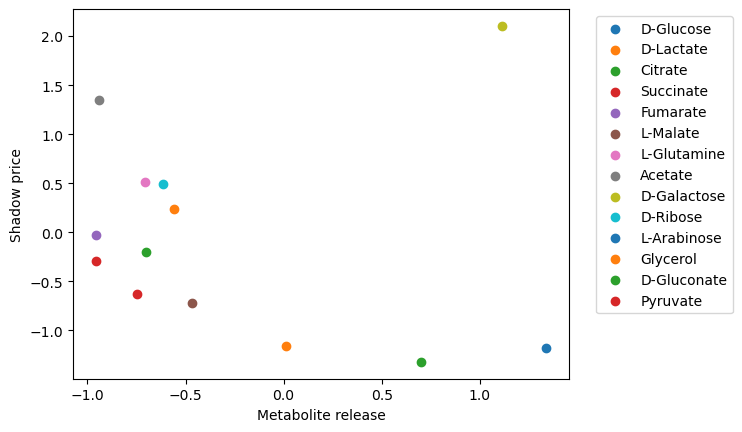

2,3-Diaminopropionic acid
-0.12441526933986873 0.685502816813651 -0.34112824568605227 0.2540107344193662
23dappa_c 0.6322 0.3438


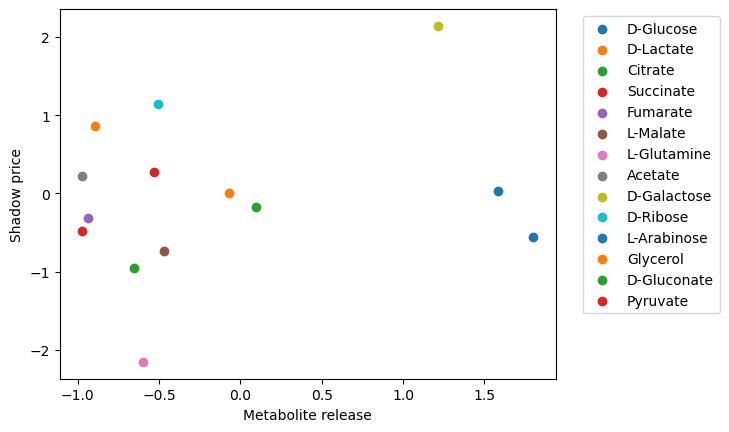

2-Ketobutyric acid/Succinic acid semialdehyde
0.2211684053636957 0.44733361629563345 0.09010989010989012 0.7593388378159541
2obut_c 0.198 0.0909


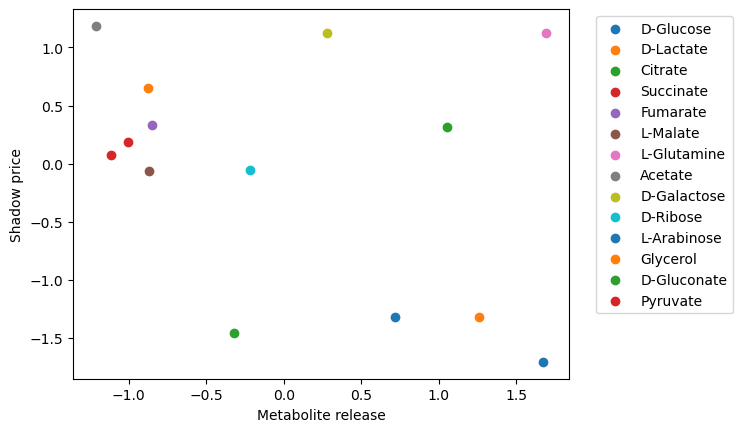

2/3-Phosphoglyceric acid
-0.3517101742449254 0.2175148863421093 -0.3054945054945055 0.2881698858754571
3pg_c 0.4241 0.2431


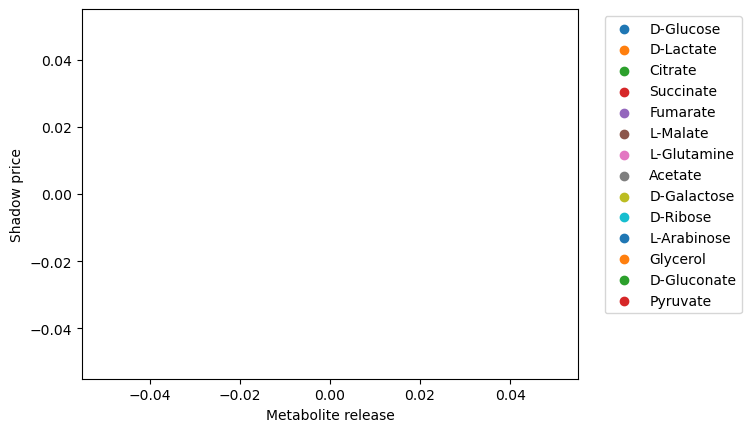

3-(2-Hydroxyphenyl)propanoic acid


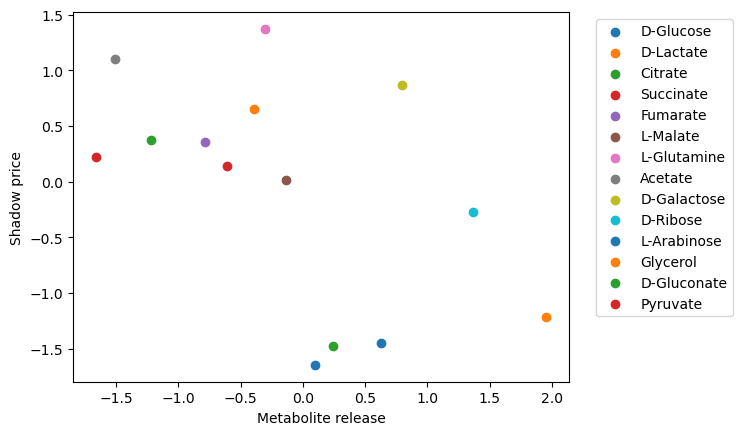

4-Hydroxyphenylpyruvic acid
-0.5192512030078223 0.05706457308572688 -0.49890109890109896 0.06936352739715487
34hpp_c 0.2903 0.1443


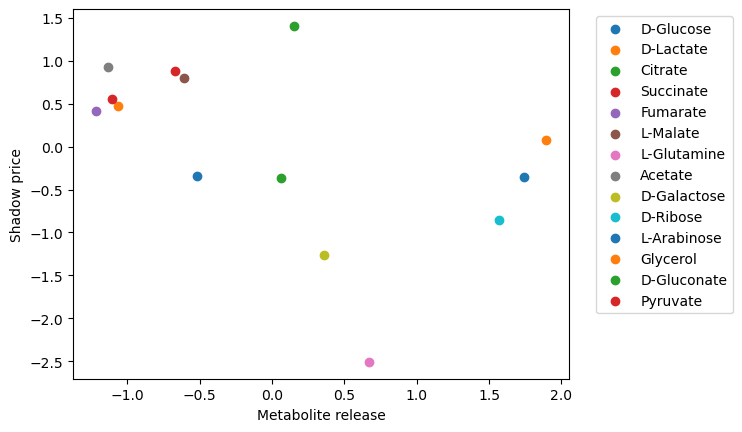

Adenosine monophosphate
-0.4925535264273299 0.07355827484500405 -0.5780219780219781 0.030383014145236958
amp_c 0.0595 0.0267


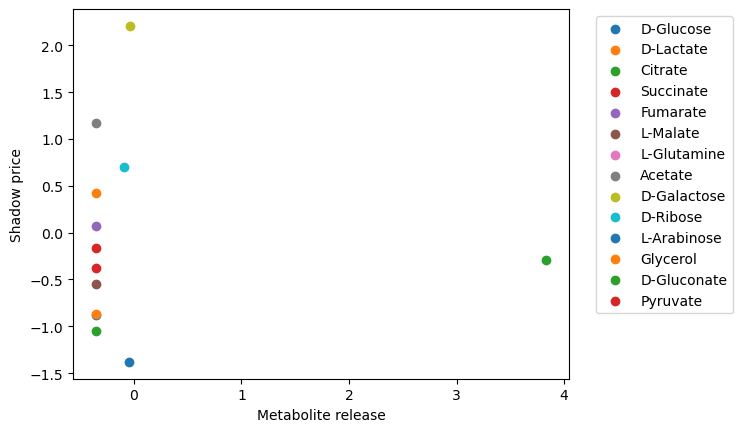

Alanine/Sarcosine
-0.026858607529740827 0.9305946108565869 0.1744848557072916 0.5685912573644221
ala__L_c 0.4722 0.2127


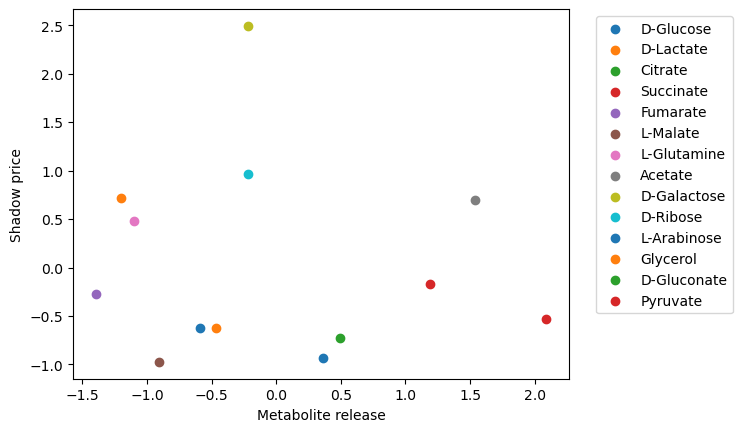

Citric/Isocitric acid
-0.08875647088806149 0.7730867341350731 -0.03846153846153846 0.9007243023389337
cit_c 0.4431 0.185


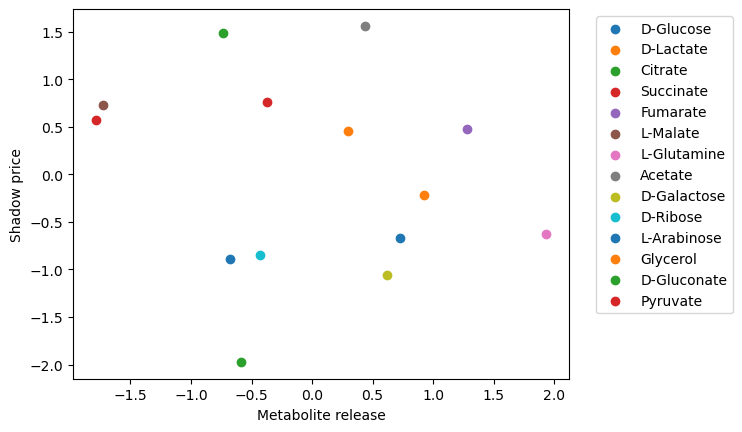

Deoxyguanosine
-0.18273577098637503 0.5317817765162729 -0.1824175824175824 0.5325088185186945
dgsn_c 0.0613 0.0268


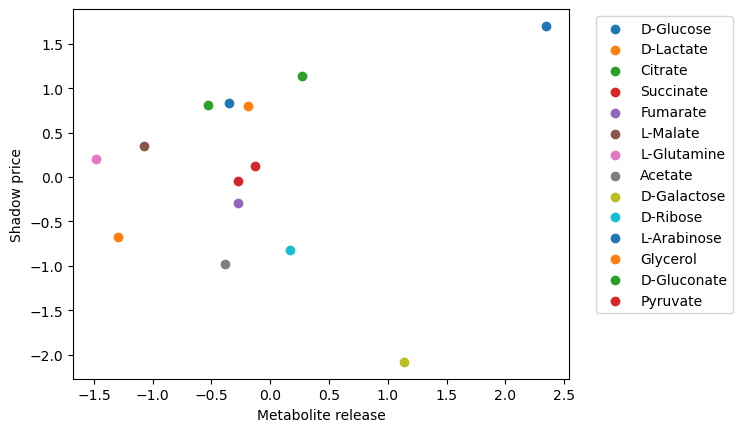

Dethiobiotin
0.1364805259972007 0.6417597153609818 0.0945054945054945 0.7479382611415478
dtbt_c 0.1263 0.0568


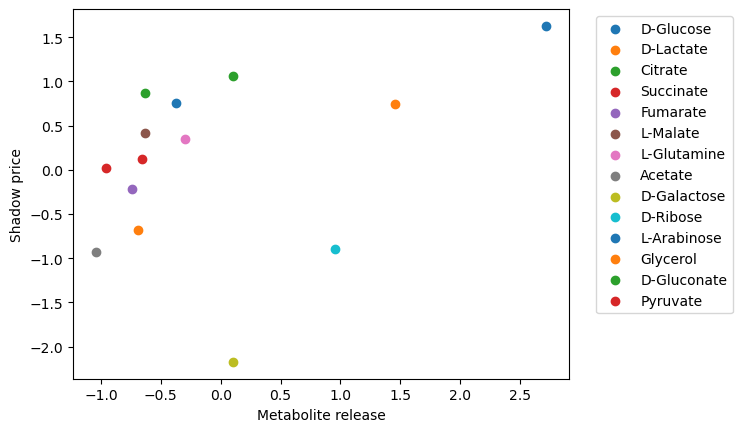

FAD
0.35478850774437953 0.2132354878018699 0.45054945054945056 0.10593278527264058
fad_c 0.1781 0.0835


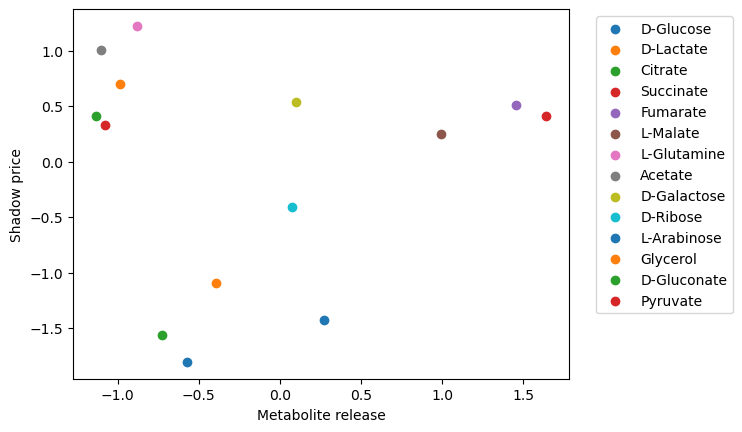

Fructose 6-phosphate
0.004375105400506926 0.9881568307897977 -0.2087912087912088 0.4737788373098136
f6p_c 0.4697 0.3148


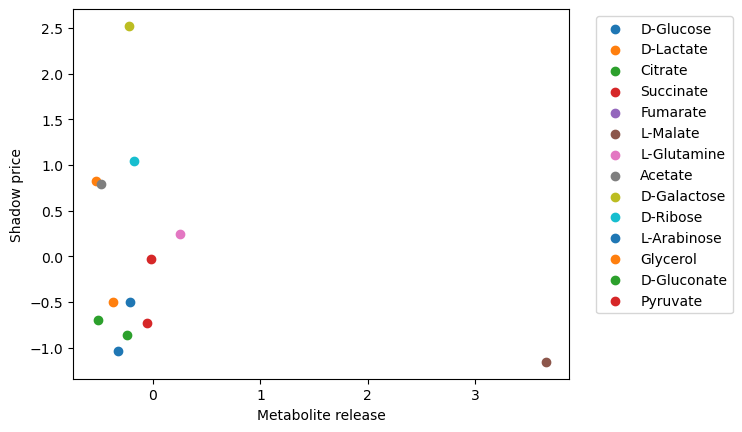

Fumaric acid
-0.32070134490616387 0.28536625037414215 -0.1868131868131868 0.5411235235098939
fum_c 0.4324 0.1765


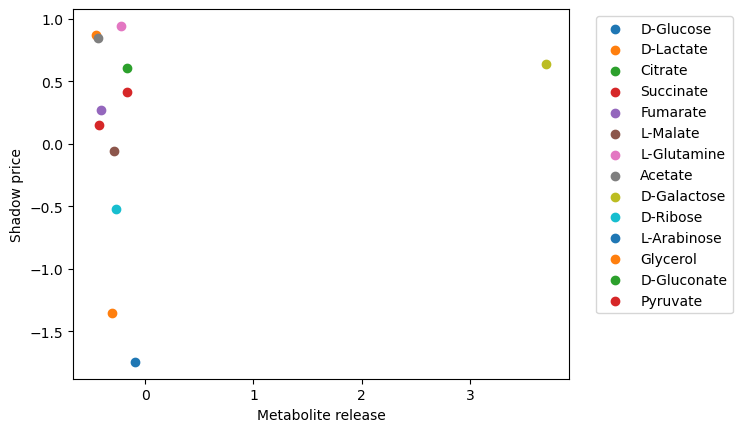

Gluconic acid
0.1556712102815822 0.629014398692699 -0.17482517482517487 0.5868236643627043
glcn_c 0.4913 0.4376


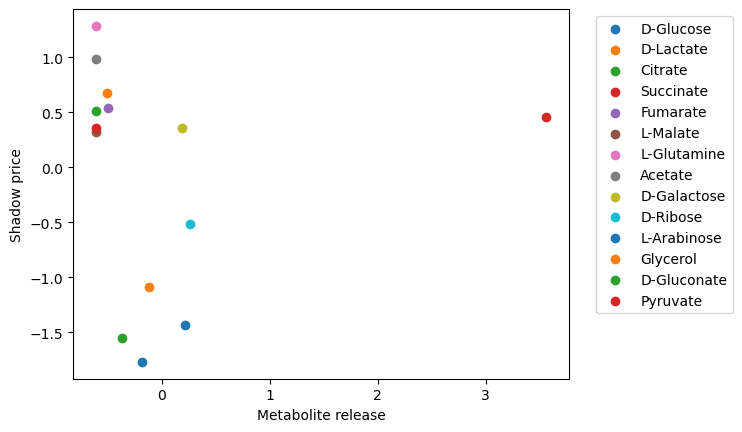

Glucosamine 6-phosphate
-0.03410239251199521 0.9078624437831757 -0.4877636220720025 0.07684048587548296
gam6p_c 0.3408 0.1829


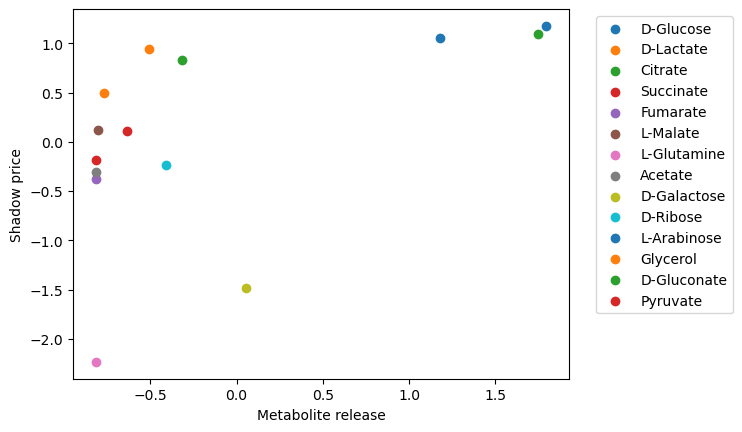

Guanine
0.5289712722523252 0.05178229765275612 0.6867090574230528 0.006673184188524621
gua_c 0.1051 0.0479


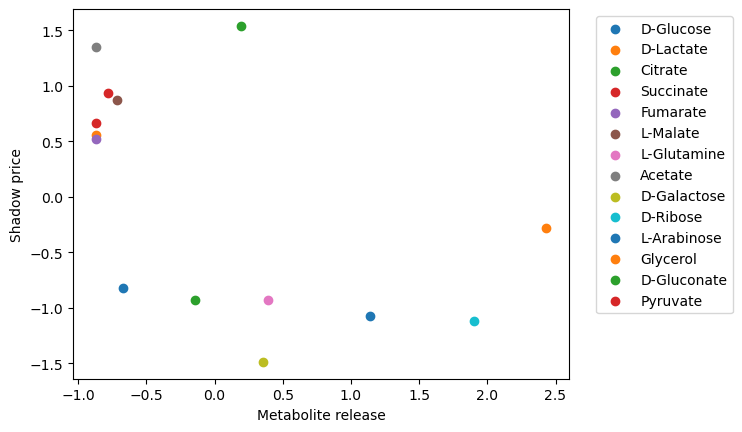

Guanosine monophosphate
-0.5380347983475035 0.0471849946721513 -0.6067041186941534 0.02142019683592601
gmp_c 0.0491 0.0214


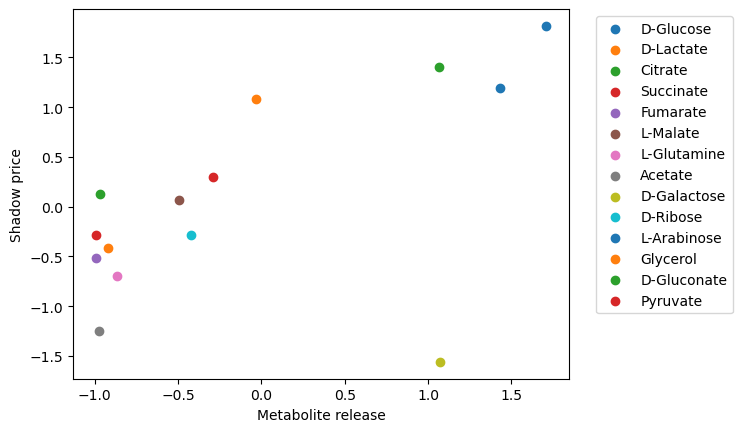

Homocystine
0.5848751059217281 0.02802557034020623 0.5786582159449335 0.030158146162140163
hcys__L_c 0.1318 0.0568


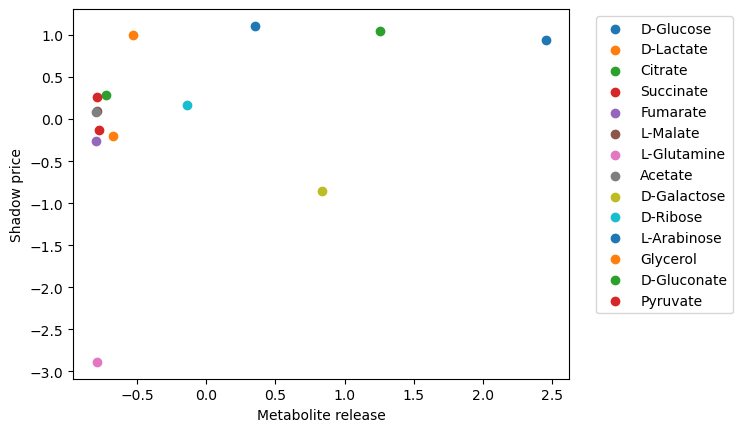

Hypoxanthine
0.3743534431009647 0.18727543059304763 0.4769230769230769 0.0846484341946868
hxan_c 0.0946 0.0449


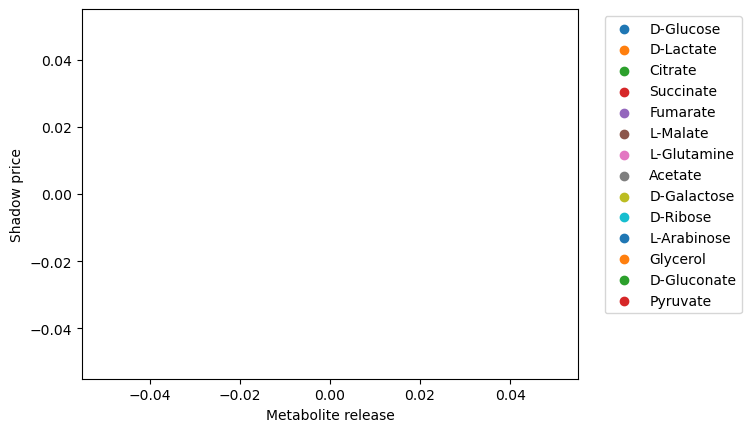

Indoleacetaldehyde


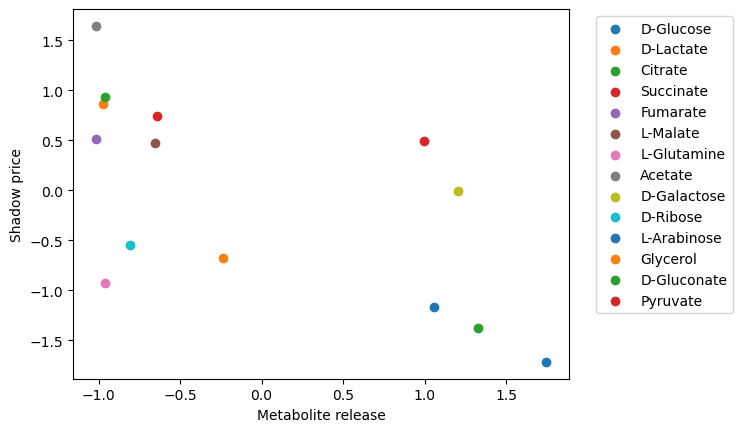

Inosine
-0.6307152894507057 0.015589785115592364 -0.745054945054945 0.002230037316742075
ins_c 0.0728 0.032


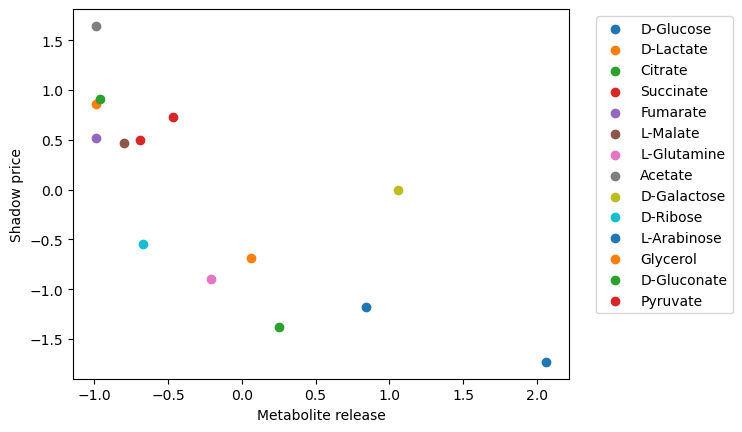

Inosinic acid
-0.7673568986144622 0.0013573468886392479 -0.8410677998713362 0.00016370711028037302
imp_c 0.0725 0.0319


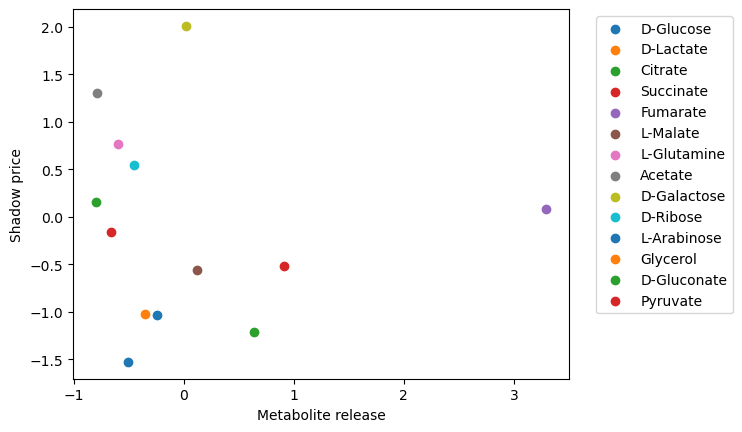

Lactic acid/Glyceraldehyde
-0.09341789591747222 0.7614719150061727 -0.3131868131868132 0.2974384220710292
lac__L_c 0.5835 0.3466


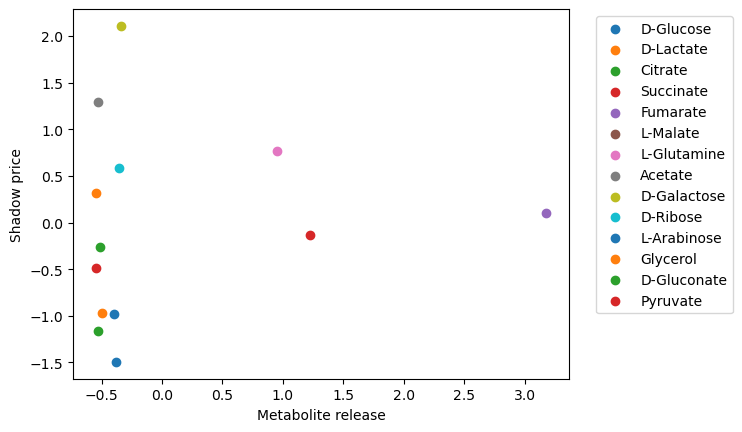

Malic acid
0.11581374893601487 0.7063449609906579 0.2200827391522918 0.46998875742238644
mal__D_c 0.6228 0.39


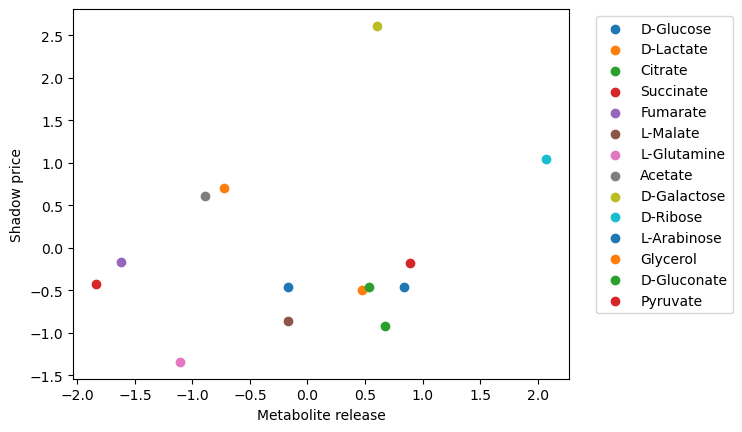

N-Methyl-L-glutamic acid
0.26190074660753465 0.36572333317029887 0.09010989010989012 0.7593388378159541
acglu_c 0.2316 0.0935


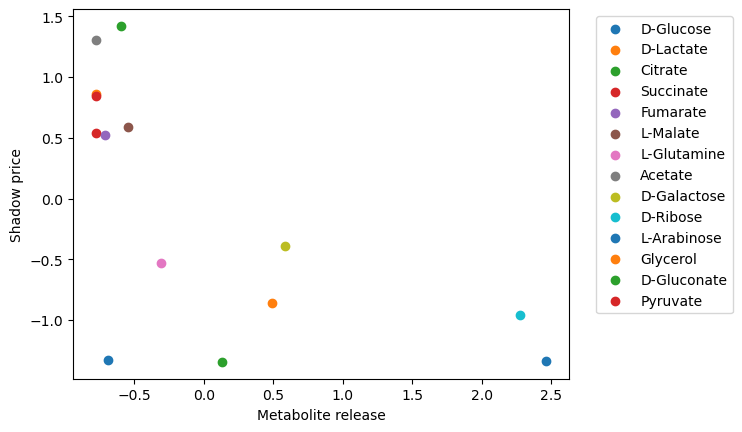

NAD
-0.6482901273874319 0.012155123366054536 -0.693376135650461 0.005961112964377703
nad_c 0.066 0.0289


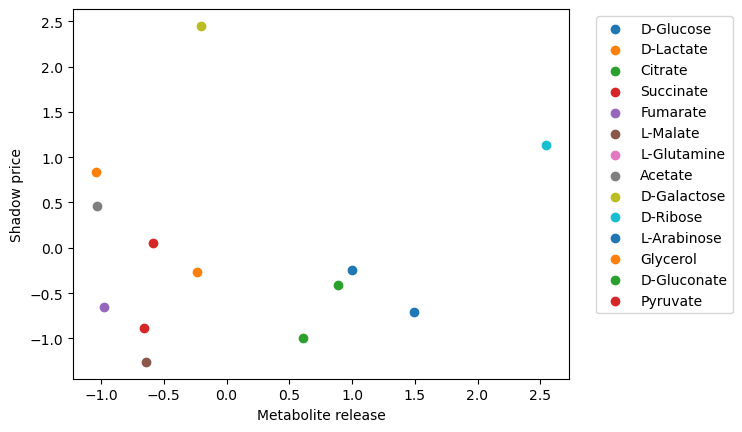

Orotic acid
0.06117665112405518 0.8426271144078209 0.016483516483516484 0.9573761750901849
orot_c 0.2628 0.1072


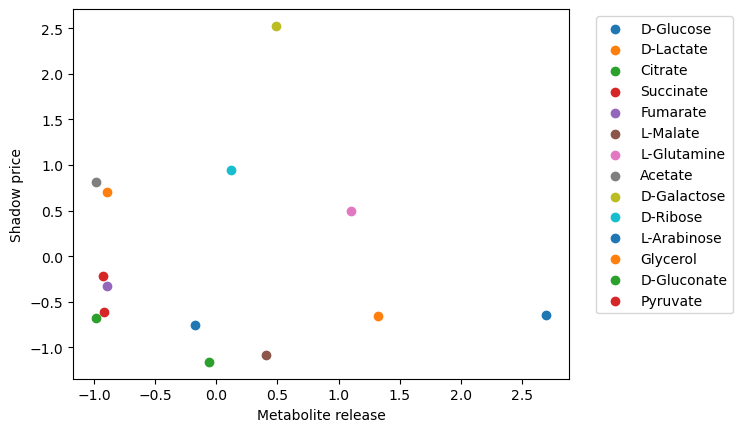

Oxoglutaric acid
-0.042591747268649505 0.8850506440748089 -0.059405976541875294 0.8401280416361696
akg_c 0.3919 0.1595


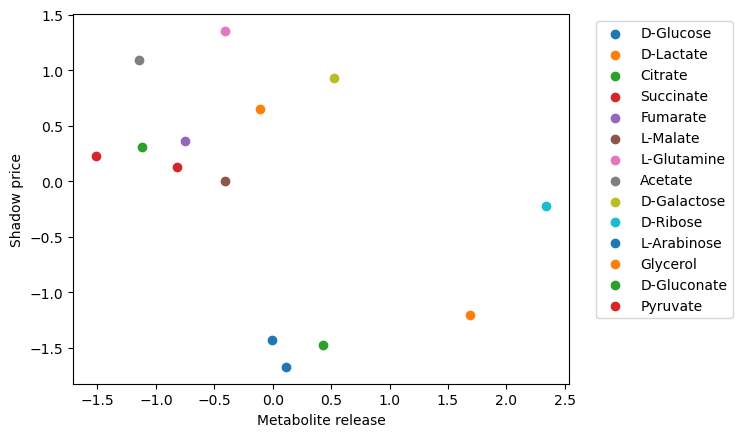

Phenylpyruvic acid
-0.41971837301478826 0.13516459916214912 -0.4461538461538462 0.10980712780122508
phpyr_c 0.301 0.151


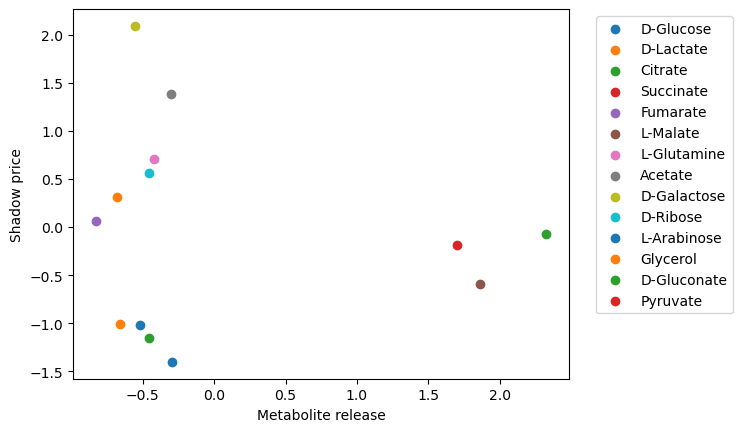

Pyruvic acid
-0.13326629328048883 0.6642680431321362 -0.19230769230769232 0.5290679872349875
pyr_c 0.6339 0.3618


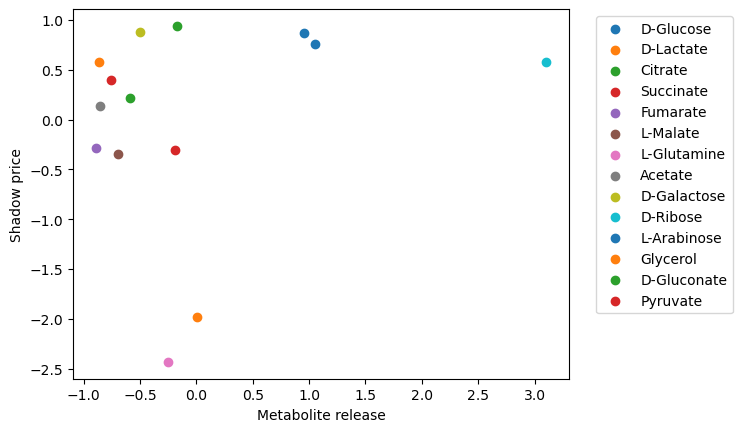

Uracil
0.1979096077016317 0.4976277547458855 0.2923076923076923 0.31052632038588196
ura_c 0.1833 0.095


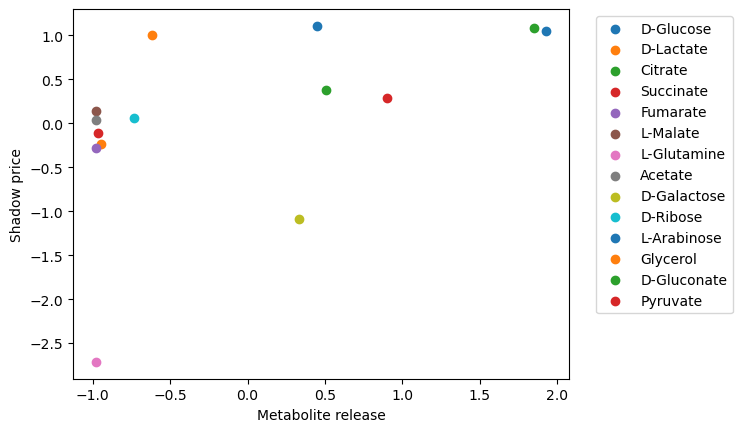

Xanthine
0.5015321226845814 0.0676758098303144 0.665934065934066 0.009322999096841759
xan_c 0.1063 0.0502


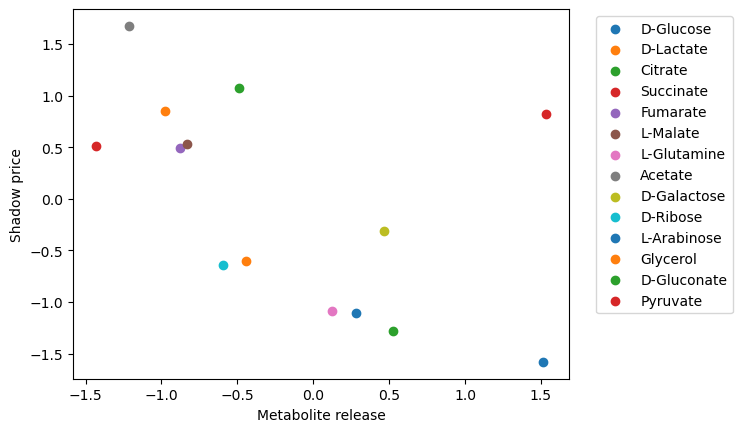

Xanthosine
-0.5494361078755238 0.04183350426488062 -0.5692307692307692 0.03361941707727023
xtsn_c 0.0719 0.0315


In [588]:
pcorrelations = []
scorrelations = []
ppvals = []
spvals = []
all_x = []
all_y = []

for m_id, m_name in zip(measured_mets, measured_metnames):
    x_arr = []
    y_arr = []
    for cs in carbon_sources:
        # if cs == 'D-Galactose':
        #     continue
        x = res_dict[cs][m_name]
        y = sp_dict[cs][m_id]
        if np.isfinite(x) and np.isfinite(y):
            x_arr.append(x)
            y_arr.append(y)
        all_x += x_arr
        all_y += y_arr
        plt.scatter(x,y, label = cs)
    plt.xlabel('Metabolite release')
    plt.ylabel('Shadow price')
    plt.legend(bbox_to_anchor=(1.04, 1), loc="upper left")
    plt.show()
    print(m_name)
    if len(x_arr)>4:
        prho, ppval = st.pearsonr(x_arr, y_arr)
        srho, spval = st.spearmanr(x_arr, y_arr)
        print(prho, ppval,srho, spval)
        print(m_id, np.round(rel_std[m_id], 4), np.round(std_log[m_id], 4))
        scorrelations.append(srho)
        pcorrelations.append(prho)
        spvals.append(spval)
        ppvals.append(ppval)